# **IMPORTS**:

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [ ]:
!pip install dalex -U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 7.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for dalex: filename=dalex-1.6.0-py3-none-any.whl size=1045995 sha256=a185cd6b3552a900e1d61d0ba7728444a4993ee75859ca03cfa88cb9f4f2cac3
  Stored in directory: /root/.cache/pip/wheels/c8/45/19/f5810bf7c5ff9a476ebd89bb5b81a18ffcdf93931d17dbb0c1
Successfully built dalex


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=b5a1d3614433fdf8552aa239302163017026b876482d2b5599b1ac4ef95edab7
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
#imports necesarios
import pandas as pd
import numpy as np
from scipy.stats import ttest_rel
from sklearn.model_selection import train_test_split, cross_val_score, KFold, StratifiedKFold
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance
import statsmodels.api as sm
import dalex as dx
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from imblearn.ensemble import BalancedRandomForestClassifier, RUSBoostClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, RocCurveDisplay

# **Dataset preprocesado:**

In [ ]:
#carga del dataset
data=pd.read_csv("/content/drive/MyDrive/TFM/Merge/java_data.csv")
label=pd.read_csv("/content/drive/MyDrive/TFM/Merge/java_label.csv")
#file_path_data = r'D:\Descargas\merge conflict\java_data.csv'
#file_path_label = r'D:\Descargas\merge conflict\java_label.csv'
#data = pd.read_csv(file_path_data)
#label= pd.read_csv(file_path_label)

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
data.head() #comprobar el dataframe

,parallel_changed_file_num,commit_num,file_added,file_removed,file_renamed,file_modified,file_copied,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,messages_median
0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,0.0,306.0,1.0,-157.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,17.0,17.0,17.000000,17.0
1,0.0,15.0,-11.0,0.0,0.0,-80.0,0.0,-759.0,-254.0,-3.0,176.0,-13.0,1.0,1.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,2.0,16.0,133.0,52.466667,48.0
2,0.0,3.0,-2.0,1.0,0.0,3.0,0.0,-24.0,16.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,42.0,62.0,49.333333,44.0
3,0.0,2.0,-7.0,-11.0,0.0,-39.0,0.0,-2316.0,-3378.0,0.0,230.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,17.0,42.0,29.500000,29.5
4,0.0,39.0,-65.0,-16.0,0.0,-230.0,0.0,-9213.0,-4131.0,-8.0,0.0,-37.0,2.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,0.0,2.0,0.0,1.0,0.0,65.0,45.904762,45.0


In [ ]:
label.head()

,is_conflict
0,0
1,0
2,0
3,0
4,0


In [ ]:
#comprobar si existen valores null o ?
print("¿Existen valores nulos en los datos?:", data.isnull().values.any())
print("¿Existen valores  '?'  en los datos?:", (data == '?').values.any())
print("¿Existen valores nulos en las etiquetas?:", label.isnull().values.any())
print("¿Existen valores  '?'  en las etiquetas?:", (label == '?').values.any())

¿Existen valores nulos en los datos?: False
¿Existen valores  '?'  en los datos?: False
¿Existen valores nulos en las etiquetas?: False
¿Existen valores  '?'  en las etiquetas?: False


In [ ]:
print(data.shape)
print(label.shape)

#obtener lista de atributos sin la variable dependiente
feature_names=list(data)
print(feature_names)
print(list(label))

(26699, 28)
(26699, 1)
['parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed', 'file_renamed', 'file_modified', 'file_copied', 'line_added', 'line_removed', 'developer_num', 'duration', 'commit_density', 'add_frequency', 'bug_frequency', 'change_frequency', 'delete_frequency', 'document_frequency', 'feature_frequency', 'fix_frequency', 'improve_frequency', 'refactor_frequency', 'remove_frequency', 'update_frequency', 'use_frequency', 'messages_min', 'messages_max', 'messages_mean', 'messages_median']
['is_conflict']


In [ ]:
# Calcular la frecuencia de cada clase
num_clases = label['is_conflict'].value_counts()
print(num_clases)

0    24519
1     2180
Name: is_conflict, dtype: int64


In [ ]:
# Combinamos los datos con las etiquetas en un solo df
df = pd.concat([data, label], axis=1)

In [ ]:
df.head()

,parallel_changed_file_num,commit_num,file_added,file_removed,file_renamed,file_modified,file_copied,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,messages_median,is_conflict
0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,0.0,306.0,1.0,-157.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,17.0,17.0,17.000000,17.0,0
1,0.0,15.0,-11.0,0.0,0.0,-80.0,0.0,-759.0,-254.0,-3.0,176.0,-13.0,1.0,1.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,2.0,16.0,133.0,52.466667,48.0,0
2,0.0,3.0,-2.0,1.0,0.0,3.0,0.0,-24.0,16.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,42.0,62.0,49.333333,44.0,0
3,0.0,2.0,-7.0,-11.0,0.0,-39.0,0.0,-2316.0,-3378.0,0.0,230.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,17.0,42.0,29.500000,29.5,0
4,0.0,39.0,-65.0,-16.0,0.0,-230.0,0.0,-9213.0,-4131.0,-8.0,0.0,-37.0,2.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,0.0,2.0,0.0,1.0,0.0,65.0,45.904762,45.0,0


In [ ]:
df.info() #comprobar el tipo de variables y su cantidad. Parece que no hay ninguna variable objeto

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26699 entries, 0 to 26698
Data columns (total 29 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   parallel_changed_file_num  26699 non-null  float64
 1   commit_num                 26699 non-null  float64
 2   file_added                 26699 non-null  float64
 3   file_removed               26699 non-null  float64
 4   file_renamed               26699 non-null  float64
 5   file_modified              26699 non-null  float64
 6   file_copied                26699 non-null  float64
 7   line_added                 26699 non-null  float64
 8   line_removed               26699 non-null  float64
 9   developer_num              26699 non-null  float64
 10  duration                   26699 non-null  float64
 11  commit_density             26699 non-null  float64
 12  add_frequency              26699 non-null  float64
 13  bug_frequency              26699 non-null  flo

In [ ]:
df.describe() #obtener algunas estadísitcas de cada atributo

,parallel_changed_file_num,commit_num,file_added,file_removed,file_renamed,file_modified,file_copied,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,messages_median,is_conflict
count,26699.000000,26699.000000,26699.000000,26699.000000,26699.0,26699.000000,26699.0,2.669900e+04,2.669900e+04,26699.000000,26699.00000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000
mean,5.835724,73.281883,-158.545264,-107.871081,0.0,-583.315368,0.0,-7.838139e+04,-4.399542e+04,-2.074422,-9.40612,-44.431814,1.295554,0.228136,0.328177,0.041799,0.109555,0.090378,1.576838,0.101502,0.088093,0.413424,0.641972,0.591445,28.874302,81.149669,49.261652,47.032492,0.081651
std,180.133313,329.084613,1141.605796,849.219816,0.0,4280.463367,0.0,9.891035e+05,5.313572e+05,10.994576,1067.21275,794.910793,1.842116,0.695852,0.785442,0.254656,0.453160,0.494214,2.110150,0.407112,0.434435,0.912097,1.411518,1.158557,24.242929,55.418772,25.045144,24.669679,0.273837
min,0.000000,1.000000,-33669.000000,-24229.000000,0.0,-139076.000000,0.0,-1.755810e+07,-9.044463e+06,-353.000000,-38826.00000,-80264.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,-3.000000,0.000000,0.0,-19.000000,0.0,-4.890000e+02,-1.835000e+02,-1.000000,-32.00000,-8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,49.000000,37.000000,35.000000,0.000000
50%,0.000000,4.000000,0.000000,0.000000,0.0,1.000000,0.0,1.000000e+00,1.000000e+00,0.000000,-1.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.000000,69.000000,45.904762,45.000000,0.000000
75%,0.000000,19.000000,0.000000,0.000000,0.0,3.000000,0.0,6.200000e+01,2.000000e+01,1.000000,3.00000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,1.000000,1.000000,37.000000,94.000000,55.666667,53.500000,0.000000
max,11225.000000,8402.000000,20500.000000,22253.000000,0.0,69610.000000,0.0,1.704412e+07,2.356213e+07,143.000000,30704.00000,6695.000000,25.000000,15.000000,19.000000,10.000000,12.000000,18.000000,19.000000,11.000000,13.000000,19.000000,33.000000,23.000000,400.000000,408.000000,400.000000,401.000000,1.000000


In [ ]:
# Parece que file_renamed y file_copied tienen el mismo valor siempre. Vamos a comprobarlo
val_renamed = df['file_renamed'].value_counts()
val_copied = df['file_copied'].value_counts()
print("Para file_renamed:\n", val_renamed)
print("Para file_copied:\n", val_copied)
columnas_constantes = df.columns[df.describe().loc['std'] == 0].tolist()
columnas_constantes

Para file_renamed:
 0.0    26699
Name: file_renamed, dtype: int64
Para file_copied:
 0.0    26699
Name: file_copied, dtype: int64


['file_renamed', 'file_copied']

In [ ]:
# Al ser caracteristicas constantes decido eliminarlas
df=df.drop('file_renamed', axis=1)
df=df.drop('file_copied', axis=1)

In [ ]:
# Actualizamos los nombres de las caracteristicas
feature_names=list(df)
feature_names.remove('is_conflict')
print(feature_names)

['parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed', 'file_modified', 'line_added', 'line_removed', 'developer_num', 'duration', 'commit_density', 'add_frequency', 'bug_frequency', 'change_frequency', 'delete_frequency', 'document_frequency', 'feature_frequency', 'fix_frequency', 'improve_frequency', 'refactor_frequency', 'remove_frequency', 'update_frequency', 'use_frequency', 'messages_min', 'messages_max', 'messages_mean', 'messages_median']


In [ ]:
correlation_matrix=df.corr()
print(correlation_matrix) #coeficientes de correlación

                           parallel_changed_file_num  commit_num  file_added  \
parallel_changed_file_num                   1.000000    0.057736   -0.033798   
commit_num                                  0.057736    1.000000   -0.531619   
file_added                                 -0.033798   -0.531619    1.000000   
file_removed                               -0.042338   -0.568256    0.860171   
file_modified                              -0.033094   -0.747726    0.724218   
line_added                                 -0.009779   -0.120702    0.469914   
line_removed                               -0.015071   -0.170434    0.489149   
developer_num                              -0.007163   -0.751053    0.385728   
duration                                    0.000910    0.009961   -0.017766   
commit_density                             -0.000971    0.000874    0.004918   
add_frequency                              -0.000135   -0.002776    0.009829   
bug_frequency                           

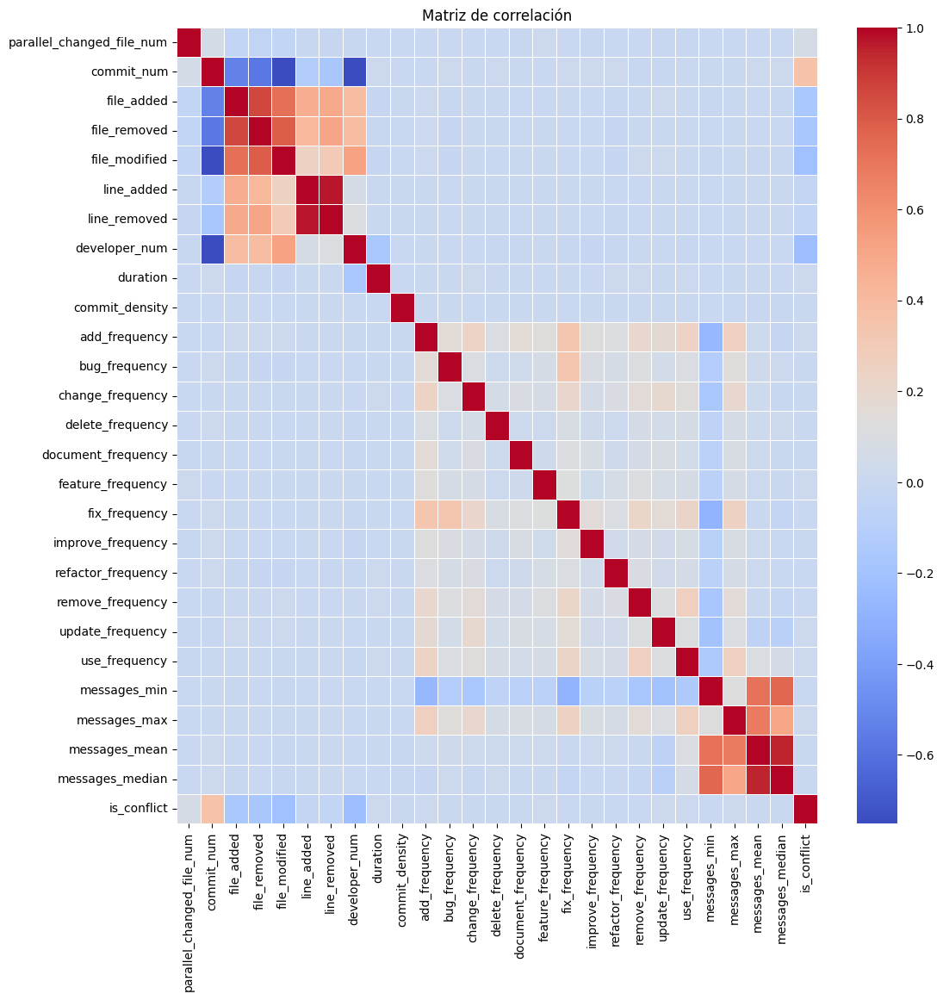

In [ ]:
plt.figure(figsize=(12, 12))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", annot_kws={"size": 7}, linewidths=0.5)
plt.title("Matriz de correlación")
plt.show()

In [ ]:
#Pares de atributos con correlación superior al umbral
high_correlation_pairs = []
atributos = []

#Recorre la matriz de correlación y verifica los valores
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.80:
            attribute_pair = (correlation_matrix.columns[i], correlation_matrix.columns[j])
            high_correlation_pairs.append(attribute_pair)

# Imprime los pares de atributos con correlación superior a 0.80 y crear una lista de atributos sin repetir
for pair in high_correlation_pairs:
    print("Correlación alta entre: ", pair[0], "y", pair[1])
    atributos.extend(pair)

# Eliminar duplicados y mantener el orden
atributos = list(dict.fromkeys(atributos))

# Imprimir la lista de atributos
print("Lista de atributos con correlación alta: ", atributos)

Correlación alta entre:  file_added y file_removed
Correlación alta entre:  line_added y line_removed
Correlación alta entre:  messages_mean y messages_median
Lista de atributos con correlación alta:  ['file_added', 'file_removed', 'line_added', 'line_removed', 'messages_mean', 'messages_median']


**VALIDACIÓN CRUZADA PARA COMPROBAR EL EFECTO DE LOS PARÁMETROS:**

In [ ]:
# Defino los algoritmos base para evaluar
rf = RandomForestClassifier(random_state=42)
gb = GradientBoostingClassifier(random_state=42)
ada = AdaBoostClassifier(random_state=42)
brf = BalancedRandomForestClassifier(random_state=42)
rus = RUSBoostClassifier(random_state=42)
modelos=[rf, brf, gb, ada, rus]

In [ ]:
for i in atributos:
  print("\n##########################################################################################################")
  print("\nPARA EL ATRIBUTO: ", i)

  # Preparando los datos
  X=df[feature_names]
  Y=df['is_conflict']

  x_train, x_test, y_train, y_test = train_test_split(X, Y, train_size=0.7, test_size=0.3, random_state=42, stratify=Y)
  x_train_sin=x_train.drop(i, axis=1)

  for j in modelos:
    # Realizar validación cruzada con y sin el atributo con alta correlación:
    # Con el atributo
    cv_scores_con = cross_val_score(j, x_train, y_train, cv=10, scoring='f1')

    # Sin el atributo
    cv_scores_sin = cross_val_score(j, x_train_sin, y_train, cv=10, scoring='f1')

    # Calcular el estadístico t y el p-valor
    t_statistic, p_value = ttest_rel(cv_scores_con, cv_scores_sin)

    # Mostrar los resultados
    print("-------------------------------------------------------------------------------------------------------------")
    print("El modelo: ", j)
    print("Valor de validación cruzada (con atributo):", cv_scores_con)
    print("Valor de validación cruzada (sin atributo):", cv_scores_sin)
    print("Valor medio con atributo es: ", np.mean(cv_scores_con), "\nEl valor medio sin atributo es: ", np.mean(cv_scores_sin))
    if np.mean(cv_scores_con) > np.mean(cv_scores_sin):
      print("El atributo mejora el desempeño del modelo, con una diferencia de: ", np.mean(cv_scores_con)-np.mean(cv_scores_sin))
    else:
      print("El atributo no mejora el desempeño del modelo, con una diferencia de: ", np.mean(cv_scores_con)-np.mean(cv_scores_sin))

    print("Estadístico t:", t_statistic)
    print("p-valor:", p_value)


##########################################################################################################

PARA EL ATRIBUTO:  line_added
-------------------------------------------------------------------------------------------------------------
El modelo:  RandomForestClassifier(class_weight='balanced', random_state=42)
Valor de validación cruzada (con atributo): [0.60728745 0.58196721 0.5952381  0.59003831 0.53543307 0.5877551
 0.52892562 0.5952381  0.61654135 0.61132075]
Valor de validación cruzada (sin atributo): [0.58730159 0.58536585 0.60240964 0.56916996 0.55513308 0.58921162
 0.53815261 0.608      0.61886792 0.60305344]
Valor medio con atributo es:  0.5849745068002011 
El valor medio sin atributo es:  0.5856665708178392
El atributo no mejora el desempeño del modelo, con una diferencia de:  -0.0006920640176381054
Estadístico t: -0.1638768316272752
p-valor: 0.8734492555409332
------------------------------------------------------------------------------------------------------

In [ ]:
# Elimina los atributos con demasiada correlación y menor relevancia que su par
feature_names.remove('messages_median')
print(feature_names)

['parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed', 'file_modified', 'line_added', 'line_removed', 'developer_num', 'duration', 'commit_density', 'add_frequency', 'bug_frequency', 'change_frequency', 'delete_frequency', 'document_frequency', 'feature_frequency', 'fix_frequency', 'improve_frequency', 'refactor_frequency', 'remove_frequency', 'update_frequency', 'use_frequency', 'messages_min', 'messages_max', 'messages_mean']


In [ ]:
from google.colab.data_table import DataTable
DataTable.max_columns = 30

df_display=df.drop("messages_median", axis=1)
df_display.describe()

,parallel_changed_file_num,commit_num,file_added,file_removed,file_modified,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,is_conflict
count,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,2.669900e+04,2.669900e+04,26699.000000,26699.00000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000,26699.000000
mean,5.835724,73.281883,-158.545264,-107.871081,-583.315368,-7.838139e+04,-4.399542e+04,-2.074422,-9.40612,-44.431814,1.295554,0.228136,0.328177,0.041799,0.109555,0.090378,1.576838,0.101502,0.088093,0.413424,0.641972,0.591445,28.874302,81.149669,49.261652,0.081651
std,180.133313,329.084613,1141.605796,849.219816,4280.463367,9.891035e+05,5.313572e+05,10.994576,1067.21275,794.910793,1.842116,0.695852,0.785442,0.254656,0.453160,0.494214,2.110150,0.407112,0.434435,0.912097,1.411518,1.158557,24.242929,55.418772,25.045144,0.273837
min,0.000000,1.000000,-33669.000000,-24229.000000,-139076.000000,-1.755810e+07,-9.044463e+06,-353.000000,-38826.00000,-80264.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,-3.000000,0.000000,-19.000000,-4.890000e+02,-1.835000e+02,-1.000000,-32.00000,-8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,49.000000,37.000000,0.000000
50%,0.000000,4.000000,0.000000,0.000000,1.000000,1.000000e+00,1.000000e+00,0.000000,-1.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.000000,69.000000,45.904762,0.000000
75%,0.000000,19.000000,0.000000,0.000000,3.000000,6.200000e+01,2.000000e+01,1.000000,3.00000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,1.000000,1.000000,37.000000,94.000000,55.666667,0.000000
max,11225.000000,8402.000000,20500.000000,22253.000000,69610.000000,1.704412e+07,2.356213e+07,143.000000,30704.00000,6695.000000,25.000000,15.000000,19.000000,10.000000,12.000000,18.000000,19.000000,11.000000,13.000000,19.000000,33.000000,23.000000,400.000000,408.000000,400.000000,1.000000


In [ ]:
# Tomar los valores de la variable dependiente (y) y las independientes (x)
X=df[feature_names]
Y=df['is_conflict']

In [ ]:
#dividir en conjunto de entrenamiento y test 70%-30%
x_train, x_test, y_train, y_test = train_test_split(X, Y, train_size=0.7, test_size=0.3, random_state=42, stratify=Y)

In [ ]:
# Comprobar la division de clases
num_train=pd.Series(y_train).value_counts()
num_test=pd.Series(y_test).value_counts()
porc_train=pd.Series(y_train).value_counts(normalize=True)
porc_test=pd.Series(y_test).value_counts(normalize=True)
comparacion = pd.DataFrame({'% Train': porc_train, 'Num Train': num_train, '% Test': porc_test,'Num Test': num_test})
print(comparacion)

    % Train  Num Train    % Test  Num Test
0  0.918348      17163  0.918352      7356
1  0.081652       1526  0.081648       654


# **Algoritmos:**

### **RandomForest:**

In [ ]:
modelo=RandomForestClassifier(random_state=42)
params={'n_estimators':[10,25,50,75,100,200],'min_samples_split':[2,3,5,10,20],'min_samples_leaf':[1,3,5,10,20],'max_depth':[1,3,5,10,20,30], 'class_weight':[None,'balanced']}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 320 candidates, totalling 3200 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': [3, 5, 7, 10],
                         'min_samples_leaf': [5, 10, 20, 25],
                         'min_samples_split': [2, 5, 10, 20],
                         'n_estimators': [25, 50, 75, 100, 200]},
             scoring='f1', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'max_depth': 10, 'min_samples_leaf': 5, 'min_samples_split': 20, 'n_estimators': 50}
RandomForestClassifier(max_depth=10, min_samples_leaf=5, min_samples_split=20,
                       n_estimators=50, random_state=42)
0.6335109286444249


In [ ]:
rf = RandomForestClassifier(max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=50, random_state=42, class_weight='balanced')

In [ ]:
modelo_rf=rf.fit(x_train,y_train)

In [ ]:
y_pred_rf = modelo_rf.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_rf.squeeze()})
print(df_pred)

       Actual  Predicted
20426       0          0
16205       0          0
2485        0          0
1106        0          1
5405        0          0
...       ...        ...
16051       0          0
8678        0          0
6588        0          0
15912       0          0
19759       0          0

[8010 rows x 2 columns]


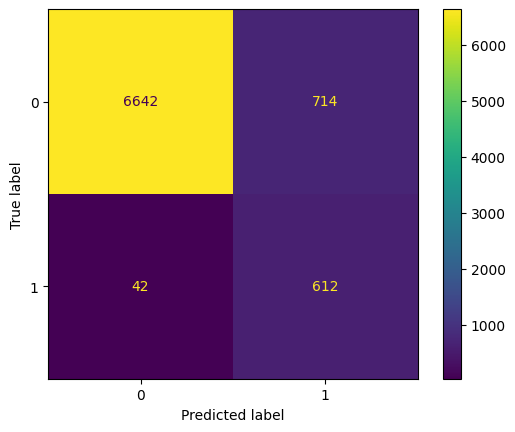

In [ ]:
# Matriz de confusion
cm_rf = confusion_matrix(y_test, y_pred_rf)
cm_display = ConfusionMatrixDisplay(cm_rf).plot()

In [ ]:
# Calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_rf)
recall = recall_score(y_test, y_pred_rf)
precision = precision_score(y_test, y_pred_rf)
f1 = f1_score(y_test, y_pred_rf)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.9056179775280899
Recall: 0.9357798165137615
Precision: 0.46153846153846156
F1-score: 0.6181818181818182


In [ ]:
modelo_rf.score(x_test, y_test)

0.9056179775280899

In [ ]:
modelo_rf.score(x_train, y_train)

0.9205950024078335

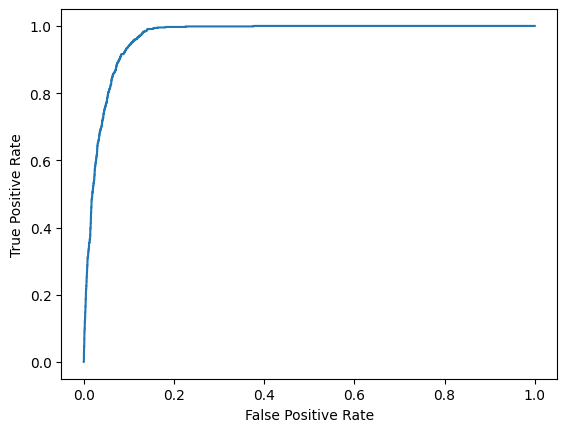

In [ ]:
# AUROC
y_score = modelo_rf.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_rf.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9679221272696736

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_rf_inv = 1 - y_pred_rf
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_rf_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
20426,0,0
16205,0,0
2485,0,0
1106,0,1
5405,0,0
3721,0,0
7175,0,0
8720,0,0
12401,0,0
6195,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,0
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_rf_inv)
recall_inv = recall_score(y_test_inv, y_pred_rf_inv)
precision_inv = precision_score(y_test_inv, y_pred_rf_inv)
f1_inv = f1_score(y_test_inv, y_pred_rf_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.9056179775280899
Recall: 0.9029363784665579
Precision: 0.9937163375224417
F1-score: 0.9461538461538462


In [ ]:
score_inv_result={"Modelo":["RandomForest"],"Accuracy":[accuracy_inv], "Precision":[precision_inv], "Recall":[recall_inv], "F1-score":[f1_inv]}
score_inv_result=pd.DataFrame(score_inv_result)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_rf= RandomForestClassifier(max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=50, random_state=42, class_weight="balanced")
    cv_rf.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_rf.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.9091
CV Precision: 0.4719
CV Recall: 0.9408
CV F1-Score: 0.6284


In [ ]:
cv_results = cross_validate(rf, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.90486891 0.91011236 0.91123596 0.91235955 0.90599251 0.91872659
 0.90599251 0.90411985 0.90749064 0.91007868] 
 Con una media de:  0.9090977557558485
Precision:
 [0.45982143 0.47511312 0.47764706 0.48139535 0.46258503 0.50120482
 0.46258503 0.4573991  0.46697039 0.47393365] 
 Con una media de:  0.4718654985380281
Recall:
 [0.94495413 0.96330275 0.93119266 0.94954128 0.93577982 0.95412844
 0.93577982 0.93577982 0.94036697 0.91743119] 
 Con una media de:  0.9408256880733946
F1-score:
 [0.61861862 0.63636364 0.63141524 0.63888889 0.61911988 0.65718799
 0.61911988 0.61445783 0.62404871 0.625     ] 
 Con una media de:  0.6284220673383251


In [ ]:
score_result={"Modelo":["RandomForest"],"Accuracy":[np.mean(cv_results['test_accuracy'])], "Precision":[np.mean(cv_results['test_precision'])], "Recall":[np.mean(cv_results['test_recall'])], "F1-score":[np.mean(cv_results['test_f1'])]}
score_result=pd.DataFrame(score_result)

### **BalancedRandomForest:**

In [ ]:
modelo=BalancedRandomForestClassifier(random_state=42)
params={'n_estimators':[10,25,50,75,100,200],'min_samples_split':[2,3,5,10,20],'min_samples_leaf':[1,3,5,10,20],'max_depth':[None,1,5,10,20,30],'class_weight':[None,'balanced']}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 225 candidates, totalling 2250 fits


GridSearchCV(cv=10, estimator=BalancedRandomForestClassifier(random_state=42),
             param_grid={'max_depth': [None, 5, 10, 20, 30],
                         'min_samples_leaf': [1, 3, 5],
                         'min_samples_split': [2, 3, 5],
                         'n_estimators': [25, 50, 75, 100, 200]},
             scoring='f1', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 25}
BalancedRandomForestClassifier(max_depth=20, min_samples_split=3,
                               n_estimators=25, random_state=42)
0.5766232521591867


In [ ]:
brf = BalancedRandomForestClassifier(max_depth=20, min_samples_split=3, n_estimators=25, random_state=42)

In [ ]:
modelo_brf=brf.fit(x_train,y_train)

In [ ]:
y_pred_brf = modelo_brf.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_brf.squeeze()})
print(df_pred)

       Actual  Predicted
20426       0          0
16205       0          0
2485        0          0
1106        0          1
5405        0          0
...       ...        ...
16051       0          0
8678        0          0
6588        0          0
15912       0          0
19759       0          0

[8010 rows x 2 columns]


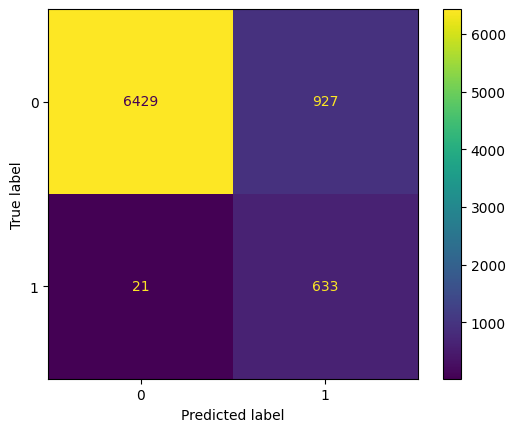

In [ ]:
# Matriz de confusion
cm_brf = confusion_matrix(y_test, y_pred_brf)
cm_display = ConfusionMatrixDisplay(cm_brf).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_brf)
recall = recall_score(y_test, y_pred_brf)
precision = precision_score(y_test, y_pred_brf)
f1 = f1_score(y_test, y_pred_brf)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.8816479400749063
Recall: 0.9678899082568807
Precision: 0.40576923076923077
F1-score: 0.5718157181571816


In [ ]:
modelo_brf.score(x_test, y_test)

0.8816479400749063

In [ ]:
modelo_brf.score(x_train, y_train)

0.8934667451442024

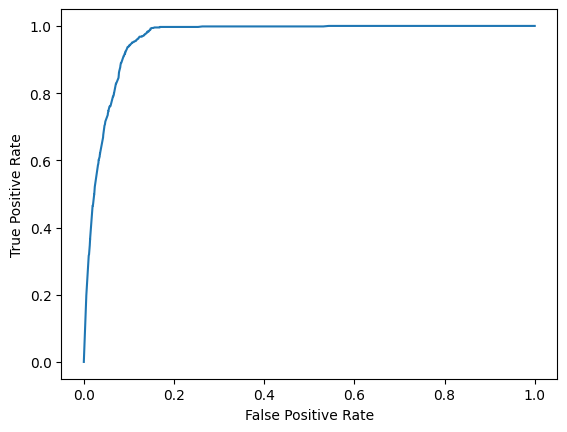

In [ ]:
# AUROC
y_score = modelo_brf.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_brf.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9633323729988875

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_brf_inv = 1 - y_pred_brf
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_brf_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
20426,0,0
16205,0,0
2485,0,0
1106,0,1
5405,0,0
3721,0,0
7175,0,0
8720,0,0
12401,0,1
6195,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,0
4,1,1
5,1,1
6,1,1
7,1,1
8,1,0
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_brf_inv)
recall_inv = recall_score(y_test_inv, y_pred_brf_inv)
precision_inv = precision_score(y_test_inv, y_pred_brf_inv)
f1_inv = f1_score(y_test_inv, y_pred_brf_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.8816479400749063
Recall: 0.8739804241435563
Precision: 0.9967441860465116
F1-score: 0.9313342025206431


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"BalancedRF","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_brf= BalancedRandomForestClassifier(max_depth=20, min_samples_split=3, n_estimators=25, random_state=42)
    cv_brf.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_brf.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.8846
CV Precision: 0.4122
CV Recall: 0.9661
CV F1-Score: 0.5778


In [ ]:
cv_results = cross_validate(brf, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.87565543 0.88539326 0.88764045 0.89101124 0.87865169 0.89400749
 0.88576779 0.87902622 0.88052434 0.8883477 ] 
 Con una media de:  0.8846025598387927
Precision:
 [0.39405204 0.41439689 0.41929134 0.42655936 0.39923954 0.43326489
 0.41317365 0.39884393 0.40344168 0.42      ] 
 Con una media de:  0.41222633232094186
Recall:
 [0.97247706 0.97706422 0.97706422 0.97247706 0.96330275 0.96788991
 0.94954128 0.94954128 0.96788991 0.96330275] 
 Con una media de:  0.9660550458715595
F1-score:
 [0.56084656 0.58196721 0.58677686 0.59300699 0.56451613 0.59858156
 0.57579972 0.56173677 0.56950067 0.58495822] 
 Con una media de:  0.5777690700350292


In [ ]:
score_result=score_result.append({"Modelo":"BalancedRF","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

### **GradientBoosting:**

In [ ]:
modelo=GradientBoostingClassifier(random_state=42)
params={'n_estimators':[10,25,50,75,100,200],'min_samples_split':[2,3,5,10,20],'min_samples_leaf':[1,3,5,10,20],'max_depth':[1,3,5,10,20,30]}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'max_depth': 5, 'min_samples_leaf': 25, 'min_samples_split': 2, 'n_estimators': 100}
GradientBoostingClassifier(max_depth=5, min_samples_leaf=25, random_state=42)
0.6668735598523333


In [ ]:
gb =GradientBoostingClassifier(max_depth=5, min_samples_leaf=25, random_state=42)

In [ ]:
modelo_gb=gb.fit(x_train,y_train)

In [ ]:
y_pred_gb = modelo_gb.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_gb.squeeze()})
print(df_pred)

       Actual  Predicted
20426       0          0
16205       0          0
2485        0          0
1106        0          0
5405        0          0
...       ...        ...
16051       0          0
8678        0          0
6588        0          0
15912       0          0
19759       0          0

[8010 rows x 2 columns]


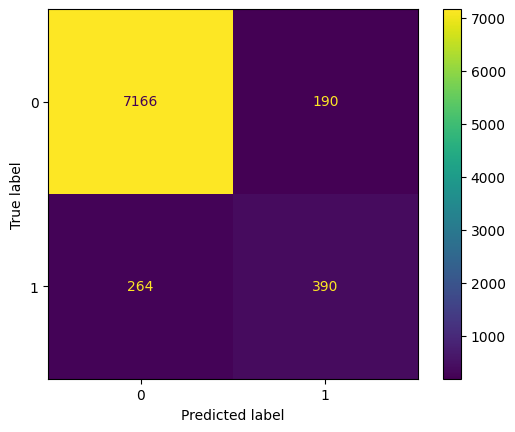

In [ ]:
# Matriz de confusion
cm_gb = confusion_matrix(y_test, y_pred_gb)
cm_display = ConfusionMatrixDisplay(cm_gb).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_gb)
recall = recall_score(y_test, y_pred_gb)
precision = precision_score(y_test, y_pred_gb)
f1 = f1_score(y_test, y_pred_gb)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.9433208489388265
Recall: 0.5963302752293578
Precision: 0.6724137931034483
F1-score: 0.6320907617504052


In [ ]:
modelo_gb.score(x_test, y_test)

0.9433208489388265

In [ ]:
modelo_gb.score(x_train, y_train)

0.967146449783295

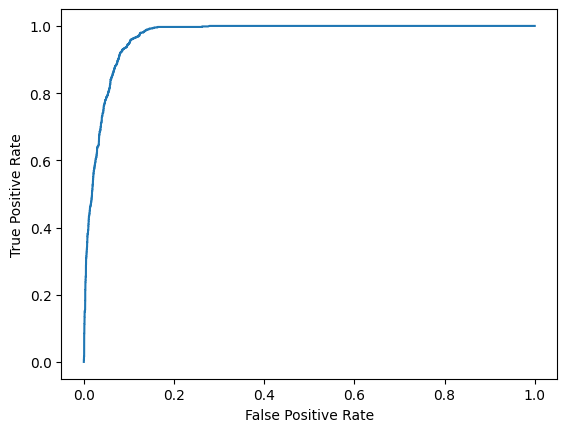

In [ ]:
# AUROC
y_score = modelo_gb.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_gb.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9701284021198863

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_gb_inv = 1 - y_pred_gb
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_gb_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
20426,0,0
16205,0,0
2485,0,0
1106,0,0
5405,0,0
3721,0,0
7175,0,0
8720,0,0
12401,0,0
6195,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_gb_inv)
recall_inv = recall_score(y_test_inv, y_pred_gb_inv)
precision_inv = precision_score(y_test_inv, y_pred_gb_inv)
f1_inv = f1_score(y_test_inv, y_pred_gb_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.9433208489388265
Recall: 0.9741707449700925
Precision: 0.9644683714670256
F1-score: 0.9692952793182742


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"GradientBoost","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_gb= GradientBoostingClassifier(max_depth=5, min_samples_leaf=25, random_state=42)
    cv_gb.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_gb.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.9480
CV Precision: 0.7115
CV Recall: 0.6119
CV F1-Score: 0.6576


In [ ]:
cv_results = cross_validate(gb, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.94531835 0.94344569 0.95393258 0.94981273 0.94906367 0.95018727
 0.94906367 0.94419476 0.94868914 0.94604721] 
 Con una media de:  0.9479755073860933
Precision:
 [0.6875     0.67179487 0.75675676 0.73595506 0.71354167 0.72486772
 0.72777778 0.67336683 0.70558376 0.71764706] 
 Con una media de:  0.7114791503383134
Recall:
 [0.60550459 0.60091743 0.64220183 0.60091743 0.62844037 0.62844037
 0.60091743 0.6146789  0.63761468 0.55963303] 
 Con una media de:  0.6119266055045871
F1-score:
 [0.64390244 0.63438257 0.69478908 0.66161616 0.66829268 0.67321867
 0.65829146 0.64268585 0.66987952 0.62886598] 
 Con una media de:  0.6575924411316976


In [ ]:
score_result=score_result.append({"Modelo":"GradientBoosting","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

### **AdaBoosting:**

In [ ]:
modelo=AdaBoostClassifier(random_state=42)
params={'n_estimators':[5,10,25,50,75,100,200],'learning_rate':[0.2,0.4,0.6,0.8,1.0,1.2,1.4,1.6,1.8,2.0,3.0,5.0]}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'learning_rate': 0.4, 'n_estimators': 25}
AdaBoostClassifier(learning_rate=0.4, n_estimators=25, random_state=42)
0.6688277669206344


In [ ]:
ada=AdaBoostClassifier(learning_rate=0.4, n_estimators=25, random_state=42)

In [ ]:
modelo_ada=ada.fit(x_train,y_train)

In [ ]:
y_pred_ada = modelo_ada.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_ada.squeeze()})
print(df_pred)

       Actual  Predicted
20426       0          0
16205       0          0
2485        0          0
1106        0          0
5405        0          0
...       ...        ...
16051       0          0
8678        0          0
6588        0          0
15912       0          0
19759       0          0

[8010 rows x 2 columns]


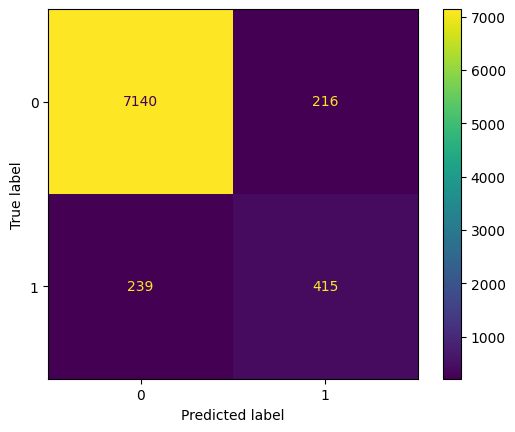

In [ ]:
# Matriz de confusion
cm_ada = confusion_matrix(y_test, y_pred_ada)
cm_display = ConfusionMatrixDisplay(cm_ada).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_ada)
recall = recall_score(y_test, y_pred_ada)
precision = precision_score(y_test, y_pred_ada)
f1 = f1_score(y_test, y_pred_ada)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.9431960049937578
Recall: 0.6345565749235474
Precision: 0.6576862123613312
F1-score: 0.6459143968871596


In [ ]:
modelo_ada.score(x_test, y_test)

0.9431960049937578

In [ ]:
modelo_ada.score(x_train, y_train)

0.9485258708331104

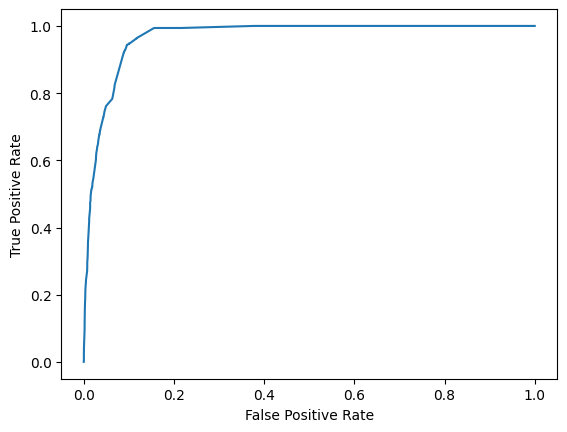

In [ ]:
# AUROC
y_score = modelo_ada.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_ada.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9672304578176212

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_ada_inv = 1 - y_pred_ada
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_ada_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
20426,0,0
16205,0,0
2485,0,0
1106,0,0
5405,0,0
3721,0,0
7175,0,0
8720,0,0
12401,0,0
6195,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_ada_inv)
recall_inv = recall_score(y_test_inv, y_pred_ada_inv)
precision_inv = precision_score(y_test_inv, y_pred_ada_inv)
f1_inv = f1_score(y_test_inv, y_pred_ada_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.9431960049937578
Recall: 0.9706362153344209
Precision: 0.9676107873695623
F1-score: 0.9691211401425177


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"AdaBoost","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_ada= AdaBoostClassifier(learning_rate=0.4, n_estimators=25, random_state=42)
    cv_ada.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_ada.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.9468
CV Precision: 0.6938
CV Recall: 0.6261
CV F1-Score: 0.6579


In [ ]:
cv_results = cross_validate(ada, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.94269663 0.94681648 0.94794007 0.94868914 0.94644195 0.94868914
 0.95393258 0.94494382 0.94494382 0.94304983] 
 Con una media de:  0.9468143464356329
Precision:
 [0.65700483 0.69191919 0.69458128 0.70984456 0.69633508 0.70351759
 0.76243094 0.67149758 0.67317073 0.67741935] 
 Con una media de:  0.6937721139998074
Recall:
 [0.62385321 0.62844037 0.64678899 0.62844037 0.61009174 0.64220183
 0.63302752 0.63761468 0.63302752 0.57798165] 
 Con una media de:  0.6261467889908257
F1-score:
 [0.64       0.65865385 0.66983373 0.66666667 0.65036675 0.67146283
 0.69172932 0.65411765 0.65248227 0.62376238] 
 Con una media de:  0.6579075436047398


In [ ]:
score_result=score_result.append({"Modelo":"AdaBoost","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

### **RUSBoost:**

In [ ]:
modelo=RUSBoostClassifier(random_state=42)
params={'n_estimators':[5,10,25,50,75,100,200], 'learning_rate':[0.2,0.4,0.6,0.8,1.0,1.2,1.4,1.6,1.8,2.0,3.0,5.0]}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 50 candidates, totalling 500 fits


GridSearchCV(cv=10, estimator=RUSBoostClassifier(random_state=42),
             param_grid={'learning_rate': [0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4,
                                           1.6, 1.8, 2.0],
                         'n_estimators': [25, 50, 75, 100, 200]},
             scoring='f1', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'learning_rate': 1.6, 'n_estimators': 25}
RUSBoostClassifier(learning_rate=1.6, n_estimators=25, random_state=42)
0.6066850514740845


In [ ]:
rus = RUSBoostClassifier(learning_rate=1.6, n_estimators=25, random_state=42, algorithm='SAMME.R', replacement=True)

In [ ]:
modelo_rus=rus.fit(x_train,y_train)

In [ ]:
y_pred_rus = modelo_rus.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_rus.squeeze()})
print(df_pred)

       Actual  Predicted
20426       0          0
16205       0          0
2485        0          0
1106        0          0
5405        0          0
...       ...        ...
16051       0          0
8678        0          0
6588        0          0
15912       0          0
19759       0          0

[8010 rows x 2 columns]


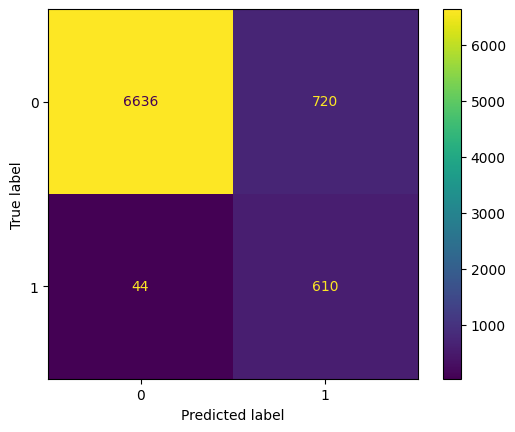

In [ ]:
# Matriz de confusion
cm_rus = confusion_matrix(y_test, y_pred_rus)
cm_display = ConfusionMatrixDisplay(cm_rus).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_rus)
recall = recall_score(y_test, y_pred_rus)
precision = precision_score(y_test, y_pred_rus)
f1 = f1_score(y_test, y_pred_rus)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.9046192259675405
Recall: 0.9327217125382263
Precision: 0.45864661654135336
F1-score: 0.6149193548387096


In [ ]:
modelo_rus.score(x_test, y_test)

0.9046192259675405

In [ ]:
modelo_rus.score(x_train, y_train)

0.9079137460538285

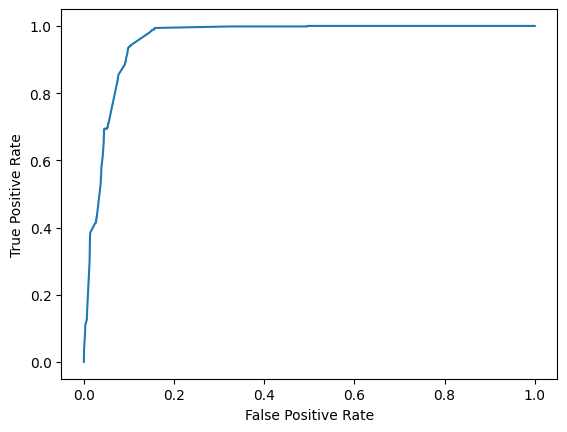

In [ ]:
# AUROC
y_score = modelo_rus.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_rus.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9587758770638877

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_rus_inv = 1 - y_pred_rus
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_rus_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
20426,0,0
16205,0,0
2485,0,0
1106,0,0
5405,0,0
3721,0,0
7175,0,0
8720,0,0
12401,0,0
6195,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_rus_inv)
recall_inv = recall_score(y_test_inv, y_pred_rus_inv)
precision_inv = precision_score(y_test_inv, y_pred_rus_inv)
f1_inv = f1_score(y_test_inv, y_pred_rus_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.9046192259675405
Recall: 0.9021207177814029
Precision: 0.9934131736526947
F1-score: 0.945568538045027


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"RUSBoost","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_rus= RUSBoostClassifier(learning_rate=1.6, n_estimators=25, random_state=42)
    cv_rus.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_rus.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.8909
CV Precision: 0.4270
CV Recall: 0.9202
CV F1-Score: 0.5804


In [ ]:
cv_results = cross_validate(rus, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.89400749 0.89625468 0.87490637 0.91161049 0.8917603  0.917603
 0.86554307 0.91011236 0.85393258 0.90633196] 
 Con una media de:  0.8922062296614058
Precision:
 [0.43243243 0.43815514 0.39454545 0.47916667 0.42710472 0.49757282
 0.37433155 0.4740566  0.35618729 0.46244131] 
 Con una media de:  0.43359939883390997
Recall:
 [0.95412844 0.9587156  0.99541284 0.94954128 0.95412844 0.94036697
 0.96330275 0.92201835 0.97706422 0.90366972] 
 Con una media de:  0.951834862385321
F1-score:
 [0.59513591 0.60143885 0.56510417 0.63692308 0.59007092 0.65079365
 0.53915276 0.62616822 0.52205882 0.61180124] 
 Con una media de:  0.5938647623743856


In [ ]:
score_result=score_result.append({"Modelo":"RUSBoost","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

# **Instancias comunes:**

In [ ]:
# Crear un DataFrame con las predicciones de cada modelo y la etiqueta real
pred_modelos_df = pd.DataFrame({
    'RandomForest': y_pred_rf,
    'BalancedRF': y_pred_brf,
    'GradientBoost': y_pred_gb,
    'AdaBoost': y_pred_ada,
    'RUSBoost': y_pred_rus,
    'Etiqueta': y_test
})

In [ ]:
pred_modelos_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
20426,0,0,0,0,0,0
16205,0,0,0,0,0,0
2485,0,0,0,0,0,0
1106,1,1,0,0,0,0
5405,0,0,0,0,0,0
...,...,...,...,...,...,...
16051,0,0,0,0,0,0
8678,0,0,0,0,0,0
6588,0,0,0,0,0,0
15912,0,0,0,0,0,0


In [ ]:
# Filtrar las instancias que tienen valor 1 en todas las columnas de los modelos
filtro_1 = pred_modelos_df[['RandomForest', 'BalancedRF', 'GradientBoost', 'AdaBoost', 'RUSBoost']].all(axis=1)

# Filtrar las instancias que tienen valor 0 en todas las columnas de los modelos
filtro_0 = (~pred_modelos_df[['RandomForest', 'BalancedRF', 'GradientBoost', 'AdaBoost', 'RUSBoost']].any(axis=1)) & (~filtro_1)

# Aplicar los filtros al DataFrame de las predicciones
df_comunes = pred_modelos_df[filtro_1 | filtro_0]

In [ ]:
df_comunes

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
20426,0,0,0,0,0,0
16205,0,0,0,0,0,0
2485,0,0,0,0,0,0
5405,0,0,0,0,0,0
3721,0,0,0,0,0,0
...,...,...,...,...,...,...
16051,0,0,0,0,0,0
8678,0,0,0,0,0,0
6588,0,0,0,0,0,0
15912,0,0,0,0,0,0


In [ ]:
# Filtrar las instancias que son Verdadero Positivo
vp_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 1) & (pred_modelos_df['BalancedRF'] == 1) & (pred_modelos_df['GradientBoost'] == 1) & (pred_modelos_df['AdaBoost'] == 1) & (pred_modelos_df['RUSBoost'] == 1) & (pred_modelos_df['Etiqueta'] == 1)]

# Filtrar las instancias que son Verdadero Negativo
vn_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 0) & (pred_modelos_df['BalancedRF'] == 0) & (pred_modelos_df['GradientBoost'] == 0) & (pred_modelos_df['AdaBoost'] == 0) & (pred_modelos_df['RUSBoost'] == 0) & (pred_modelos_df['Etiqueta'] == 0)]

# Filtrar las instancias que son Falso Positivo
fp_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 1) & (pred_modelos_df['BalancedRF'] == 1) & (pred_modelos_df['GradientBoost'] == 1) & (pred_modelos_df['AdaBoost'] == 1) & (pred_modelos_df['RUSBoost'] == 1) & (pred_modelos_df['Etiqueta'] == 0)]

# Filtrar las instancias que son Falso Negativo
fn_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 0) & (pred_modelos_df['BalancedRF'] == 0) & (pred_modelos_df['GradientBoost'] == 0) & (pred_modelos_df['AdaBoost'] == 0) & (pred_modelos_df['RUSBoost'] == 0) & (pred_modelos_df['Etiqueta'] == 1)]


In [ ]:
vp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
24351,1,1,1,1,1,1
16294,1,1,1,1,1,1
19474,1,1,1,1,1,1
25269,1,1,1,1,1,1
24464,1,1,1,1,1,1
...,...,...,...,...,...,...
9104,1,1,1,1,1,1
16842,1,1,1,1,1,1
12074,1,1,1,1,1,1
15840,1,1,1,1,1,1


In [ ]:
vn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
20426,0,0,0,0,0,0
16205,0,0,0,0,0,0
2485,0,0,0,0,0,0
5405,0,0,0,0,0,0
3721,0,0,0,0,0,0
...,...,...,...,...,...,...
16051,0,0,0,0,0,0
8678,0,0,0,0,0,0
6588,0,0,0,0,0,0
15912,0,0,0,0,0,0


In [ ]:
fp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
11750,1,1,1,1,1,0
12299,1,1,1,1,1,0
16642,1,1,1,1,1,0
950,1,1,1,1,1,0
16147,1,1,1,1,1,0
...,...,...,...,...,...,...
905,1,1,1,1,1,0
16203,1,1,1,1,1,0
7744,1,1,1,1,1,0
17046,1,1,1,1,1,0


In [ ]:
fn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
24506,0,0,0,0,0,1
21242,0,0,0,0,0,1
15984,0,0,0,0,0,1
22274,0,0,0,0,0,1
15218,0,0,0,0,0,1
15062,0,0,0,0,0,1
2458,0,0,0,0,0,1
23300,0,0,0,0,0,1
18356,0,0,0,0,0,1
8436,0,0,0,0,0,1


In [ ]:
indices_vp = vp_df.index.tolist()
indices_vn = vn_df.index.tolist()
indices_fp = fp_df.index.tolist()
indices_fn = fn_df.index.tolist()

In [ ]:
vp_instancias = x_test.loc[indices_vp]
vn_instancias = x_test.loc[indices_vn]
fp_instancias = x_test.loc[indices_fp]
fn_instancias = x_test.loc[indices_fn]

**VALOR DE PREDICCION INSTANCIAS COMUNES:**

In [ ]:
# Valor de la predicciones para RandomForest
valor_pred_rf_vp = modelo_rf.predict_proba(vp_instancias)
valor_pred_rf_vn = modelo_rf.predict_proba(vn_instancias)
valor_pred_rf_fp = modelo_rf.predict_proba(fp_instancias)
valor_pred_rf_fn = modelo_rf.predict_proba(fn_instancias)

proba_rf_vp = valor_pred_rf_vp[:, 1] # selecciona la probabilidad estimada de la clase positiva de los verdaderos positivos
proba_rf_vn = valor_pred_rf_vn[:, 0] # selecciona la probabilidad estimada de la clase negativa de los verdaderos negativos
proba_rf_fp = valor_pred_rf_fp[:, 1] # selecciona la probabilidad estimada de la clase positiva de los falsos positivos
proba_rf_fn = valor_pred_rf_fn[:, 0] # selecciona la probabilidad estimada de la clase negativa de los falsos negativos

proba_rf_vp = pd.Series(proba_rf_vp, index=vp_df.index) # transformamos en series de pandas
proba_rf_vn = pd.Series(proba_rf_vn, index=vn_df.index)
proba_rf_fp = pd.Series(proba_rf_fp, index=fp_df.index)
proba_rf_fn = pd.Series(proba_rf_fn, index=fn_df.index)

vp_df['RF V.Pred'] = proba_rf_vp # añadir los valores a los dataframe
vn_df['RF V.Pred'] = proba_rf_vn
fp_df['RF V.Pred'] = proba_rf_fp
fn_df['RF V.Pred'] = proba_rf_fn

# Valor de la predicciones para BalancedRandomForest
valor_pred_brf_vp = modelo_brf.predict_proba(vp_instancias)
valor_pred_brf_vn = modelo_brf.predict_proba(vn_instancias)
valor_pred_brf_fp = modelo_brf.predict_proba(fp_instancias)
valor_pred_brf_fn = modelo_brf.predict_proba(fn_instancias)

proba_brf_vp = valor_pred_brf_vp[:, 1]
proba_brf_vn = valor_pred_brf_vn[:, 0]
proba_brf_fp = valor_pred_brf_fp[:, 1]
proba_brf_fn = valor_pred_brf_fn[:, 0]

proba_brf_vp = pd.Series(proba_brf_vp, index=vp_df.index)
proba_brf_vn = pd.Series(proba_brf_vn, index=vn_df.index)
proba_brf_fp = pd.Series(proba_brf_fp, index=fp_df.index)
proba_brf_fn = pd.Series(proba_brf_fn, index=fn_df.index)

vp_df['BRF V.Pred'] = proba_brf_vp
vn_df['BRF V.Pred'] = proba_brf_vn
fp_df['BRF V.Pred'] = proba_brf_fp
fn_df['BRF V.Pred'] = proba_brf_fn

# Valor de la predicciones para GradientBoosting
valor_pred_gb_vp = modelo_gb.predict_proba(vp_instancias)
valor_pred_gb_vn = modelo_gb.predict_proba(vn_instancias)
valor_pred_gb_fp = modelo_gb.predict_proba(fp_instancias)
valor_pred_gb_fn = modelo_gb.predict_proba(fn_instancias)

proba_gb_vp = valor_pred_gb_vp[:, 1]
proba_gb_vn = valor_pred_gb_vn[:, 0]
proba_gb_fp = valor_pred_gb_fp[:, 1]
proba_gb_fn = valor_pred_gb_fn[:, 0]

proba_gb_vp = pd.Series(proba_gb_vp, index=vp_df.index)
proba_gb_vn = pd.Series(proba_gb_vn, index=vn_df.index)
proba_gb_fp = pd.Series(proba_gb_fp, index=fp_df.index)
proba_gb_fn = pd.Series(proba_gb_fn, index=fn_df.index)

vp_df['GB V.Pred'] = proba_gb_vp
vn_df['GB V.Pred'] = proba_gb_vn
fp_df['GB V.Pred'] = proba_gb_fp
fn_df['GB V.Pred'] = proba_gb_fn

# Valor de la predicciones para AdaBoost
valor_pred_ada_vp = modelo_ada.predict_proba(vp_instancias)
valor_pred_ada_vn = modelo_ada.predict_proba(vn_instancias)
valor_pred_ada_fp = modelo_ada.predict_proba(fp_instancias)
valor_pred_ada_fn = modelo_ada.predict_proba(fn_instancias)

proba_ada_vp = valor_pred_ada_vp[:, 1]
proba_ada_vn = valor_pred_ada_vn[:, 0]
proba_ada_fp = valor_pred_ada_fp[:, 1]
proba_ada_fn = valor_pred_ada_fn[:, 0]

proba_ada_vp = pd.Series(proba_ada_vp, index=vp_df.index)
proba_ada_vn = pd.Series(proba_ada_vn, index=vn_df.index)
proba_ada_fp = pd.Series(proba_ada_fp, index=fp_df.index)
proba_ada_fn = pd.Series(proba_ada_fn, index=fn_df.index)

vp_df['AB V.Pred'] = proba_ada_vp
vn_df['AB V.Pred'] = proba_ada_vn
fp_df['AB V.Pred'] = proba_ada_fp
fn_df['AB V.Pred'] = proba_ada_fn

# Valor de la predicciones para RUSBoos
valor_pred_rus_vp = modelo_rus.predict_proba(vp_instancias)
valor_pred_rus_vn = modelo_rus.predict_proba(vn_instancias)
valor_pred_rus_fp = modelo_rus.predict_proba(fp_instancias)
valor_pred_rus_fn = modelo_rus.predict_proba(fn_instancias)

proba_rus_vp = valor_pred_rus_vp[:, 1]
proba_rus_vn = valor_pred_rus_vn[:, 0]
proba_rus_fp = valor_pred_rus_fp[:, 1]
proba_rus_fn = valor_pred_rus_fn[:, 0]

proba_rus_vp = pd.Series(proba_rus_vp, index=vp_df.index)
proba_rus_vn = pd.Series(proba_rus_vn, index=vn_df.index)
proba_rus_fp = pd.Series(proba_rus_fp, index=fp_df.index)
proba_rus_fn = pd.Series(proba_rus_fn, index=fn_df.index)

vp_df['RB V.Pred'] = proba_rus_vp
vn_df['RB V.Pred'] = proba_rus_vn
fp_df['RB V.Pred'] = proba_rus_fp
fn_df['RB V.Pred'] = proba_rus_fn

In [ ]:
# Cálculo de la media para cada instancia del dataframe
media_vp = vp_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
vp_df['V.Pred media'] = media_vp

media_vn = vn_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
vn_df['V.Pred media'] = media_vn

media_fp = fp_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
fp_df['V.Pred media'] = media_fp

media_fn = fn_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
fn_df['V.Pred media'] = media_fn

In [ ]:
vp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
24351,1,1,1,1,1,1,0.926409,0.96,0.895863,0.549080,0.527916,0.771854
16294,1,1,1,1,1,1,0.776998,0.92,0.740434,0.510886,0.516670,0.692998
19474,1,1,1,1,1,1,0.971036,0.99,0.920073,0.543225,0.527916,0.790450
25269,1,1,1,1,1,1,0.920048,0.88,0.667528,0.518100,0.535038,0.704143
24464,1,1,1,1,1,1,0.978639,1.00,0.953940,0.534605,0.517852,0.797007
...,...,...,...,...,...,...,...,...,...,...,...,...
9104,1,1,1,1,1,1,0.888335,1.00,0.673021,0.517513,0.527916,0.721357
16842,1,1,1,1,1,1,0.905621,0.93,0.681615,0.543225,0.527916,0.717676
12074,1,1,1,1,1,1,0.844573,0.92,0.768256,0.527523,0.515306,0.715132
15840,1,1,1,1,1,1,0.990940,1.00,0.955634,0.573361,0.527066,0.809400


In [ ]:
vn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
20426,0,0,0,0,0,0,0.964552,1.00,0.997569,0.726737,0.555788,0.848929
16205,0,0,0,0,0,0,0.982207,1.00,0.998790,0.726737,0.555788,0.852704
2485,0,0,0,0,0,0,0.696095,0.58,0.935585,0.559197,0.504564,0.655088
5405,0,0,0,0,0,0,0.887203,0.68,0.995227,0.606065,0.533893,0.740478
3721,0,0,0,0,0,0,0.999762,1.00,0.998858,0.646173,0.533044,0.835567
...,...,...,...,...,...,...,...,...,...,...,...,...
16051,0,0,0,0,0,0,0.999814,1.00,0.998843,0.726737,0.555788,0.856236
8678,0,0,0,0,0,0,0.991248,0.96,0.997398,0.672353,0.529616,0.830123
6588,0,0,0,0,0,0,0.999814,1.00,0.998706,0.726737,0.555788,0.856209
15912,0,0,0,0,0,0,0.971171,0.96,0.995592,0.667303,0.545072,0.827828


In [ ]:
fp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
11750,1,1,1,1,1,0,0.809689,0.96,0.922795,0.539949,0.515510,0.749589
12299,1,1,1,1,1,0,0.928470,0.96,0.886891,0.545811,0.527387,0.769712
16642,1,1,1,1,1,0,0.719435,0.84,0.687117,0.530991,0.527916,0.661092
950,1,1,1,1,1,0,0.903957,0.95,0.967074,0.559711,0.527916,0.781732
16147,1,1,1,1,1,0,0.869379,0.92,0.523572,0.500492,0.506078,0.663904
...,...,...,...,...,...,...,...,...,...,...,...,...
905,1,1,1,1,1,0,0.847641,1.00,0.618149,0.530991,0.527916,0.704939
16203,1,1,1,1,1,0,0.811678,0.90,0.668054,0.516269,0.518704,0.682941
7744,1,1,1,1,1,0,0.849986,0.76,0.785925,0.536673,0.527916,0.692100
17046,1,1,1,1,1,0,0.964761,1.00,0.773142,0.546699,0.515736,0.760068


In [ ]:
fn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
24506,0,0,0,0,0,1,0.626656,0.566667,0.940027,0.559197,0.504564,0.639422
21242,0,0,0,0,0,1,0.965514,0.986667,0.998159,0.646173,0.517541,0.822811
15984,0,0,0,0,0,1,0.617112,0.570000,0.917474,0.559197,0.504564,0.633669
22274,0,0,0,0,0,1,0.555340,0.640000,0.946868,0.564818,0.504564,0.642318
15218,0,0,0,0,0,1,0.597066,0.560000,0.933705,0.564818,0.504564,0.632031
15062,0,0,0,0,0,1,0.758685,0.620000,0.907398,0.564818,0.504564,0.671093
2458,0,0,0,0,0,1,0.546843,0.620000,0.932877,0.564818,0.504564,0.633820
23300,0,0,0,0,0,1,0.725306,0.600000,0.945549,0.559197,0.504564,0.666923
18356,0,0,0,0,0,1,0.656572,0.560000,0.919984,0.559197,0.504564,0.640063
8436,0,0,0,0,0,1,0.531088,0.506667,0.942768,0.559197,0.504564,0.608857


In [ ]:
# Calcula la instancia con la media máxima
instancia_vp_max = vp_df['V.Pred media'].idxmax()
instancia_vn_max = vn_df['V.Pred media'].idxmax()
instancia_fp_max = fp_df['V.Pred media'].idxmax()
instancia_fn_max = fn_df['V.Pred media'].idxmax()

# Calcula la instancia con la mediana
mediana_vp = vp_df['V.Pred media'].median()
mediana_vn = vn_df['V.Pred media'].median()
mediana_fp = fp_df['V.Pred media'].median()
mediana_fn = fn_df['V.Pred media'].median()

instancia_vp_mediana = vp_df.loc[(vp_df['V.Pred media'] - mediana_vp).abs().idxmin()].name
instancia_vn_mediana = vn_df.loc[(vn_df['V.Pred media'] - mediana_vn).abs().idxmin()].name
instancia_fp_mediana = fp_df.loc[(fp_df['V.Pred media'] - mediana_fp).abs().idxmin()].name
instancia_fn_mediana = fn_df.loc[(fn_df['V.Pred media'] - mediana_fn).abs().idxmin()].name

# Calcula la instancia con la media mínima
instancia_vp_min = vp_df['V.Pred media'].idxmin()
instancia_vn_min = vn_df['V.Pred media'].idxmin()
instancia_fp_min = fp_df['V.Pred media'].idxmin()
instancia_fn_min = fn_df['V.Pred media'].idxmin()

In [ ]:
# Mostrar las instancias
print("La instancia verdadero positivo máxima es: ", instancia_vp_max)
print("La instancia verdadero negativo máxima es: ", instancia_vn_max)
print("La instancia falso positivo máxima es: ", instancia_fp_max)
print("La instancia falso negativo máxima es: ", instancia_fn_max)

print("La instancia verdadero positivo en la mediana es: ", instancia_vp_mediana)
print("La instancia verdadero negativo en la mediana es: ", instancia_vn_mediana)
print("La instancia falso positivo en la mediana es: ", instancia_fp_mediana)
print("La instancia falso negativo en la mediana es: ", instancia_fn_mediana)

print("La instancia verdadero positivo minima es: ", instancia_vp_min)
print("La instancia verdadero negativo minima es: ", instancia_vn_min)
print("La instancia falso positivo minima es: ", instancia_fp_min)
print("La instancia falso negativo minima es: ", instancia_fn_min)

La instancia verdadero positivo máxima es:  23975
La instancia verdadero negativo máxima es:  21848
La instancia falso positivo máxima es:  120
La instancia falso negativo máxima es:  21242
La instancia verdadero positivo en la mediana es:  17420
La instancia verdadero negativo en la mediana es:  17902
La instancia falso positivo en la mediana es:  3108
La instancia falso negativo en la mediana es:  8565
La instancia verdadero positivo minima es:  4771
La instancia verdadero negativo minima es:  24081
La instancia falso positivo minima es:  24630
La instancia falso negativo minima es:  8436


In [ ]:
# Indices del conjunto de prueba
lista_indices = y_test.index.tolist()

In [ ]:
# Posiciones dentro del ndarray de las predicciones
pos_vp_max = lista_indices.index(instancia_vp_max)
pos_vp_min = lista_indices.index(instancia_vp_min)
pos_vp_mediana = lista_indices.index(instancia_vp_mediana)
pos_vn_max = lista_indices.index(instancia_vn_max)
pos_vn_min = lista_indices.index(instancia_vn_min)
pos_vn_mediana = lista_indices.index(instancia_vn_mediana)
pos_fp_max = lista_indices.index(instancia_fp_max)
pos_fp_min = lista_indices.index(instancia_fp_min)
pos_fp_mediana = lista_indices.index(instancia_fp_mediana)
pos_fn_max = lista_indices.index(instancia_fn_max)
pos_fn_min = lista_indices.index(instancia_fn_min)
pos_fn_mediana = lista_indices.index(instancia_fn_mediana)

In [ ]:
df_instancia_vp_max = x_test.loc[instancia_vp_max]
df_instancia_vp_min = x_test.loc[instancia_vp_min]
df_instancia_vp_mediana = x_test.loc[instancia_vp_mediana]
df_instancia_vn_max = x_test.loc[instancia_vn_max]
df_instancia_vn_min = x_test.loc[instancia_vn_min]
df_instancia_vn_mediana = x_test.loc[instancia_vn_mediana]
df_instancia_fp_max = x_test.loc[instancia_fp_max]
df_instancia_fp_min = x_test.loc[instancia_fp_min]
df_instancia_fp_mediana = x_test.loc[instancia_fp_mediana]
df_instancia_fn_max = x_test.loc[instancia_fn_max]
df_instancia_fn_min = x_test.loc[instancia_fn_min]
df_instancia_fn_mediana = x_test.loc[instancia_fn_mediana]

# **Explicabilidad:**

In [ ]:
# Función para evaluar el signo de los valores
def evaluar_valor(valor):
    if valor >= 0:
        return "Positivo"
    else:
        return "Negativo"

In [ ]:
# Crear las columnas del MultiIndex
columns_multi = pd.MultiIndex.from_tuples([
    ('Breakdown', 'Ranking'), ('Breakdown', 'Signo'),
    ('Shapley', 'Ranking'), ('Shapley', 'Signo'),
    ('Lime', 'Ranking'), ('Lime', 'Signo')
])

## **RandomForest:**

**FEATURE IMPORTANCE**

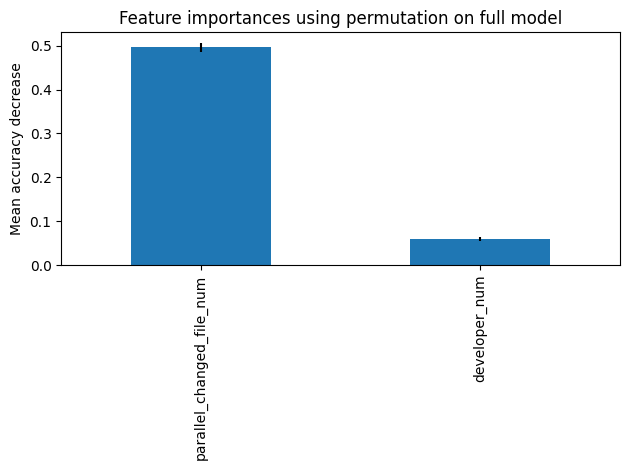

In [ ]:
permu = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

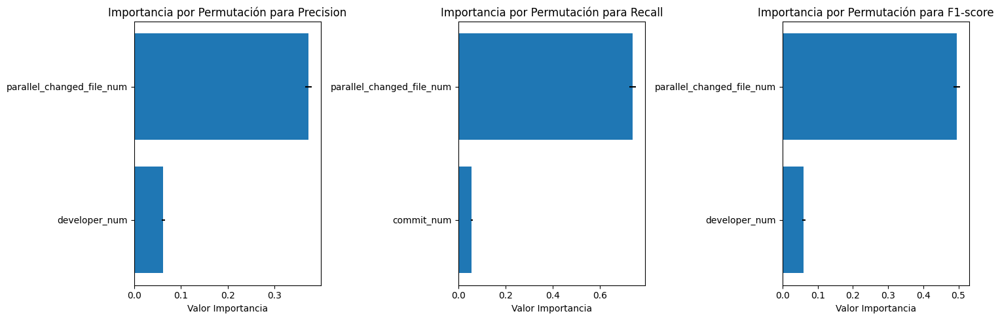

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_rf = {}

permu_score = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_rf[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_rf['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.372826,0.006945
1,developer_num,0.062000,0.003750


In [ ]:
results_global_rf['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.739755,0.014185
1,commit_num,0.056651,0.004675


In [ ]:
results_global_rf['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.496039,0.009316
1,developer_num,0.059939,0.004766


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_rf, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 18689 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 18689 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x79995e3f7d00> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.165, max = 0.992
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.97, mean = -0.0831, max = 0.722
  -> model_info        : package sklearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

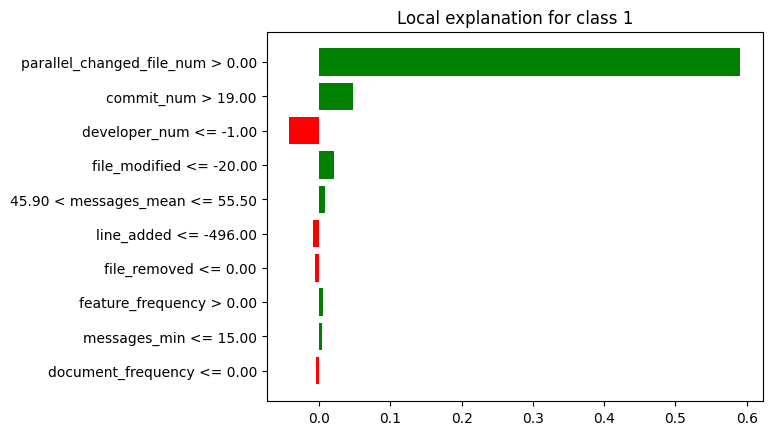

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)
lime_vp_df_max.at[4, "Variable"] = "messages_mean"

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 line_added        3  Positivo
3              file_modified        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3               line_removed        4  Positivo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3              file_modified        4  Positivo
4              messages_mean        5  Positivo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'line_added', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'file_added', 'line_removed', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'messages_mean']
['commit_num', 'messages_mean', 'line_removed', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1              messages_mean         -         -       -         -       5   
2               line_removed         -         -       4  Positivo       -   
3              developer_num         5  Positivo       -         -       3   
4  parallel_changed_file_num         1  Positivo       1  Positivo       1   
5              file_modified         4  Negativo       5  Positivo       4   
6                 line_added         3  Positivo       -         -       -   
7                 file_added         -         -       3  Positivo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Negativo  
4  Positivo  
5  Positivo  
6         -  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_added", "file_modified", "developer_num", "file_added", "line_removed", "messages_mean"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
line_added                        3  Positivo       -         -       -   
file_modified                     4  Negativo       5  Positivo       4   
developer_num                     5  Positivo       -         -       3   
file_added                        -         -       3  Positivo       -   
line_removed                      -         -       4  Positivo       -   
messages_mean                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
line_added                        -  
file_modified              Positivo  
developer_num              Negativo  
file_added                        -  
line_removed                      -  
messages_mean              Positivo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

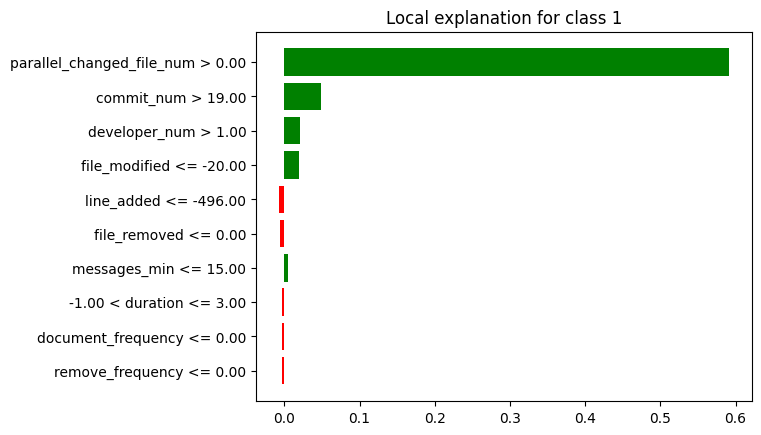

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3              developer_num        4  Positivo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3              file_modified        4  Positivo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3              file_modified        4  Positivo
4                 line_added        5  Negativo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'file_modified', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'line_added']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1              developer_num         4  Positivo       3  Positivo       3   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3              file_modified         3  Negativo       4  Positivo       4   
4                 line_added         -         -       5  Positivo       5   
5               file_removed         5  Positivo       -         -       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Positivo  
4  Negativo  
5         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "file_modified", "developer_num", "file_removed", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
file_modified                     3  Negativo       4  Positivo       4   
developer_num                     4  Positivo       3  Positivo       3   
file_removed                      5  Positivo       -         -       -   
line_added                        -         -       5  Positivo       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
file_modified              Positivo  
developer_num              Positivo  
file_removed                      -  
line_added                 Negativo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

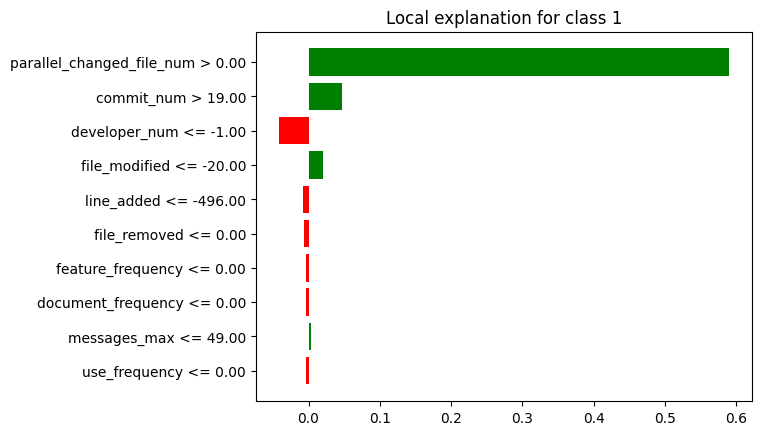

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 file_added        4  Positivo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3               file_removed        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3              file_modified        4  Positivo
4                 line_added        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_added', 'duration']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_removed', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'line_added']
['commit_num', 'line_removed', 'duration', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Positivo       3  Positivo       2   
1               line_removed         -         -       5  Positivo       -   
2                   duration         5  Negativo       -         -       -   
3              developer_num         2  Negativo       2  Negativo       3   
4              file_modified         -         -       -         -       4   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6                 line_added         -         -       -         -       5   
7                 file_added         4  Positivo       -         -       -   
8               file_removed         -         -       4  Positivo       -   

             
      Signo  
0  Positivo  
1         -  
2         -  
3  Negativo  
4  Positivo  
5  Positivo  
6  Negativo  
7         -  
8         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "file_added", "duration", "file_removed", "line_removed", "file_modified", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       3   
commit_num                        3  Positivo       3  Positivo       2   
file_added                        4  Positivo       -         -       -   
duration                          5  Negativo       -         -       -   
file_removed                      -         -       4  Positivo       -   
line_removed                      -         -       5  Positivo       -   
file_modified                     -         -       -         -       4   
line_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                 Positivo  
file_added                        -  
duration                          -  
file_removed                      -  
line_removed                      -  
file_modified              Positivo  
line_added                 Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_added', 3), ('file_modified', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 3), ('developer_num', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('file_added', 4), ('duration', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 5), ('file_added', 3), ('line_removed', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 4), ('developer_num', 3), ('line_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('file_removed', 4), ('line_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 4), ('developer_num', 3), ('messages_mean', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 4), ('developer_num', 3), ('line_added', 5), ('parallel_changed_file_num', 1), 

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        5.0      1           4.0      1   
file_added                          4.0      1           3.0      1   
line_added                          3.0      1           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       3.5      2           4.5      2   
developer_num                  3.666667      3           2.5      2   
duration                            5.0      1             -      -   
line_removed                          -      -           4.5      2   
messages_mean                         -      -             -      -   
commit_num                     2.333333      3      2.333333      3   

                                   Lime         
                          Ranking Medio Conteo  
file_removed                          -      -  
file_added                            -      -  
line_added                          5.0      2  
parallel_changed_file_num           1.0      3  
file_modified                       4.0      3  
developer_num                       3.0      3  
duration                              -      -  
line_removed                          -      -  
messages_mean                       5.0      1  
commit_num                          2.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_vp[("General", "Ranking")] = df_resumen_rf_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_vp[("General", "Conteo Total")] = df_resumen_rf_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        5.0      1           4.0      1   
file_added                          4.0      1           3.0      1   
line_added                          3.0      1           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       3.5      2           4.5      2   
developer_num                  3.666667      3           2.5      2   
duration                            5.0      1             -      -   
line_removed                          -      -           4.5      2   
messages_mean                         -      -             -      -   
commit_num                     2.333333      3      2.333333      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_removed                          -      -  4.500000            2  
file_added                            -      -  3.500000            2  
line_added                          5.0      2  4.333333            4  
parallel_changed_file_num           1.0      3  1.000000            9  
file_modified                       4.0      3  4.000000            7  
developer_num                       3.0      3  3.055556            8  
duration                              -      -  5.000000            1  
line_removed                          -      -  4.500000            2  
messages_mean                       5.0      1  5.000000            1  
commit_num                          2.0      3  2.222222            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_vp[("General", "Peso Rango")] = 1 - ((df_resumen_rf_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_vp[("General", "Peso Conteo")] = df_resumen_rf_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_vp[("General", "Puntaje")] = df_resumen_rf_vp[("General", "Peso Rango")] + df_resumen_rf_vp[("General", "Peso Conteo")]
df_resumen_rf_vp[("General", "Ranking")] = df_resumen_rf_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        5.0      1           4.0      1   
file_added                          4.0      1           3.0      1   
line_added                          3.0      1           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       3.5      2           4.5      2   
developer_num                  3.666667      3           2.5      2   
duration                            5.0      1             -      -   
line_removed                          -      -           4.5      2   
messages_mean                         -      -             -      -   
commit_num                     2.333333      3      2.333333      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_removed                          -      -     7.0            2  
file_added                            -      -     5.0            2  
line_added                          5.0      2     5.0            4  
parallel_changed_file_num           1.0      3     1.0            9  
file_modified                       4.0      3     4.0            7  
developer_num                       3.0      3     3.0            8  
duration                              -      -     9.0            1  
line_removed                          -      -     7.0            2  
messages_mean                       5.0      1     9.0            1  
commit_num                          2.0      3     2.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_vp = df_resumen_rf_vp[new_columns]

In [ ]:
df_resumen_rf_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_vp[(tech, "Ranking Medio")] = df_resumen_rf_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.33      3   
developer_num                 3.0            8          3.67      3   
file_modified                 4.0            7          3.50      2   
file_added                    5.0            2          4.00      1   
line_added                    5.0            4          3.00      1   
file_removed                  7.0            2          5.00      1   
line_removed                  7.0            2             -      -   
duration                      9.0            1          5.00      1   
messages_mean                 9.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.33      3          2.00      3  
developer_num                      2.50      2          3.00      3  
file_modified                      4.50      2          4.00      3  
file_added                         3.00      1             -      -  
line_added                         5.00      1          5.00      2  
file_removed                       4.00      1             -      -  
line_removed                       4.50      2             -      -  
duration                              -      -             -      -  
messages_mean                         -      -          5.00      1

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

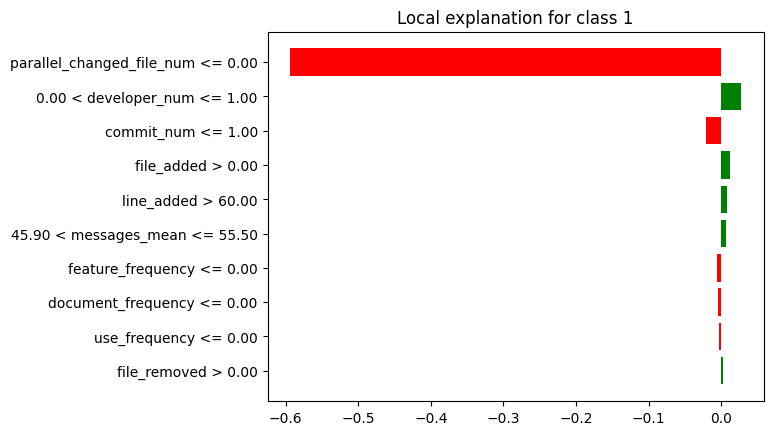

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)
lime_vn_df_max.at[1, 'Variable'] = 'developer_num'

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3              fix_frequency        4  Negativo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3                 file_added        4  Positivo
4                 line_added        5  Positivo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'fix_frequency', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'file_removed']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_added', 'line_added']
['commit_num', 'fix_frequency', 'line_removed', 'developer_num', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Negativo       2  Negativo       3   
1              fix_frequency         4  Negativo       -         -       -   
2               line_removed         -         -       4  Negativo       -   
3              developer_num         3  Positivo       3  Positivo       2   
4  parallel_changed_file_num         1  Negativo       1  Negativo       1   
5                 line_added         5  Positivo       -         -       5   
6                 file_added         -         -       -         -       4   
7               file_removed         -         -       5  Negativo       -   

             
      Signo  
0  Negativo  
1         -  
2         -  
3  Positivo  
4  Negativo  
5  Positivo  
6  Positivo  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "fix_frequency", "line_added", "line_removed", "file_removed", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       3   
developer_num                     3  Positivo       3  Positivo       2   
fix_frequency                     4  Negativo       -         -       -   
line_added                        5  Positivo       -         -       5   
line_removed                      -         -       4  Negativo       -   
file_removed                      -         -       5  Negativo       -   
file_added                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num              Positivo  
fix_frequency                     -  
line_added                 Positivo  
line_removed                      -  
file_removed                      -  
file_added                 Positivo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

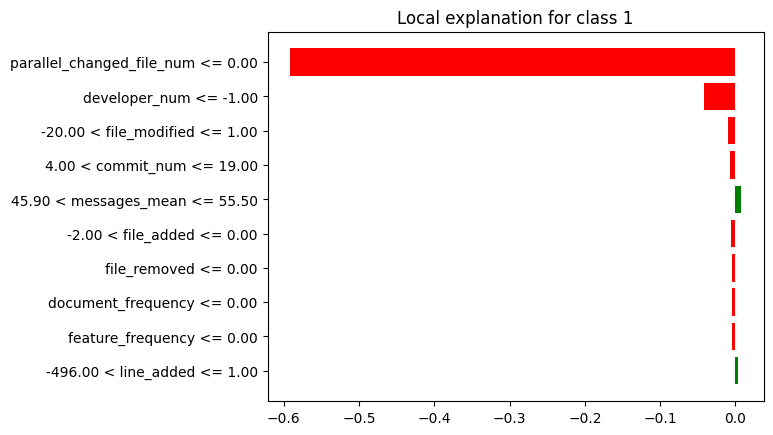

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[2, 'Variable'] = 'file_modified'
lime_vn_df_mediana.at[3, 'Variable'] = 'commit_num'
lime_vn_df_mediana.at[4, 'Variable'] = 'file_added'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3                 line_added        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3              file_modified        4  Negativo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2              file_modified        3  Negativo
3                 commit_num        4  Negativo
4                 file_added        5  Positivo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_modified', 'line_added']
['parallel_changed_file_num', 'developer_num', 'file_modified', 'commit_num', 'file_added']
['commit_num', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Negativo       3  Negativo       4   
1              developer_num         2  Negativo       2  Negativo       2   
2              file_modified         -         -       4  Negativo       3   
3  parallel_changed_file_num         1  Negativo       1  Negativo       1   
4                 line_added         4  Positivo       5  Positivo       -   
5                 file_added         5  Negativo       -         -       5   

             
      Signo  
0  Negativo  
1  Negativo  
2  Negativo  
3  Negativo  
4         -  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "file_added", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
developer_num                     2  Negativo       2  Negativo       2   
commit_num                        3  Negativo       3  Negativo       4   
line_added                        4  Positivo       5  Positivo       -   
file_added                        5  Negativo       -         -       5   
file_modified                     -         -       4  Negativo       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
developer_num              Negativo  
commit_num                 Negativo  
line_added                        -  
file_added                 Positivo  
file_modified              Negativo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

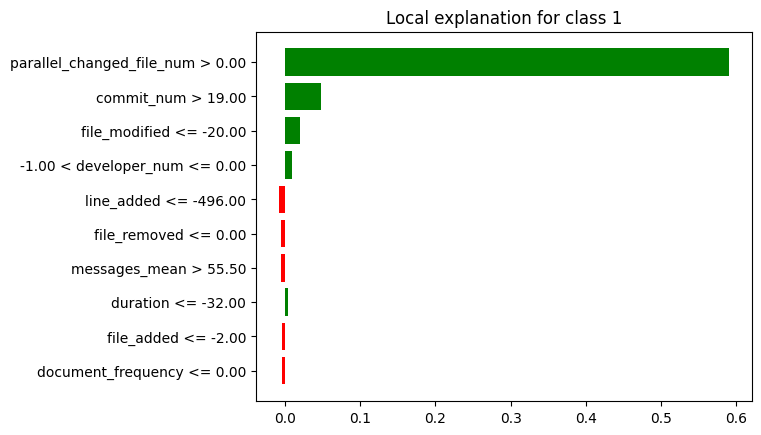

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)
lime_vn_df_min.at[3,  'Variable'] = 'developer_num'

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              file_modified        2  Negativo
2                 commit_num        3  Positivo
3                   duration        4  Negativo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Negativo
3               file_removed        4  Negativo
4             commit_density        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Positivo
3              developer_num        4  Positivo
4                 line_added        5  Negativo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'file_modified', 'commit_num', 'duration', 'line_added']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_removed', 'commit_density']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'developer_num', 'line_added']
['commit_num', 'commit_density', 'line_removed', 'duration', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Positivo       2  Positivo       2   
1             commit_density         -         -       5  Negativo       -   
2               line_removed         -         -       3  Negativo       -   
3                   duration         4  Negativo       -         -       -   
4              developer_num         -         -       -         -       4   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6              file_modified         2  Negativo       -         -       3   
7                 line_added         5  Positivo       -         -       5   
8               file_removed         -         -       4  Negativo       -   

             
      Signo  
0  Positivo  
1         -  
2         -  
3         -  
4  Positivo  
5  Positivo  
6  Positivo  
7  Negativo  
8         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_modified", "commit_num", "duration", "line_added", "line_removed", "file_removed", "commit_density", "developer_num"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_modified                     2  Negativo       -         -       3   
commit_num                        3  Positivo       2  Positivo       2   
duration                          4  Negativo       -         -       -   
line_added                        5  Positivo       -         -       5   
line_removed                      -         -       3  Negativo       -   
file_removed                      -         -       4  Negativo       -   
commit_density                    -         -       5  Negativo       -   
developer_num                     -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_modified              Positivo  
commit_num                 Positivo  
duration                          -  
line_added                 Negativo  
line_removed                      -  
file_removed                      -  
commit_density                    -  
developer_num              Positivo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('fix_frequency', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('file_modified', 2), ('commit_num', 3), ('duration', 4), ('line_added', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 5), ('file_modified', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('file_removed', 4), ('commit_density', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 3), ('developer_num', 2), ('line_added', 5), ('file_added', 4), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 4), ('file_added', 5), ('file_modified', 3), ('parallel_changed_file_num', 1), ('file_m

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                          -      -           4.5      2   
file_added                          5.0      1             -      -   
line_added                     4.666667      3           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       2.0      1           4.0      1   
developer_num                       2.5      2           2.5      2   
duration                            4.0      1             -      -   
line_removed                          -      -           3.5      2   
commit_density                        -      -           5.0      1   
fix_frequency                       4.0      1             -      -   
commit_num                     2.666667      3      2.333333      3   

                                   Lime         
                          Ranking Medio Conteo  
file_removed                          -      -  
file_added                          4.5      2  
line_added                          5.0      2  
parallel_changed_file_num           1.0      3  
file_modified                       3.0      2  
developer_num                  2.666667      3  
duration                              -      -  
line_removed                          -      -  
commit_density                        -      -  
fix_frequency                         -      -  
commit_num                          3.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_vn[("General", "Ranking")] = df_resumen_rf_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_vn[("General", "Conteo Total")] = df_resumen_rf_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                          -      -           4.5      2   
file_added                          5.0      1             -      -   
line_added                     4.666667      3           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       2.0      1           4.0      1   
developer_num                       2.5      2           2.5      2   
duration                            4.0      1             -      -   
line_removed                          -      -           3.5      2   
commit_density                        -      -           5.0      1   
fix_frequency                       4.0      1             -      -   
commit_num                     2.666667      3      2.333333      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_removed                          -      -  4.500000            2  
file_added                          4.5      2  4.750000            3  
line_added                          5.0      2  4.888889            6  
parallel_changed_file_num           1.0      3  1.000000            9  
file_modified                       3.0      2  3.000000            4  
developer_num                  2.666667      3  2.555556            7  
duration                              -      -  4.000000            1  
line_removed                          -      -  3.500000            2  
commit_density                        -      -  5.000000            1  
fix_frequency                         -      -  4.000000            1  
commit_num                          3.0      3  2.666667            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_vn[("General", "Peso Rango")] = 1 - ((df_resumen_rf_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_vn[("General", "Peso Conteo")] = df_resumen_rf_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_vn[("General", "Puntaje")] = df_resumen_rf_vn[("General", "Peso Rango")] + df_resumen_rf_vn[("General", "Peso Conteo")]
df_resumen_rf_vn[("General", "Ranking")] = df_resumen_rf_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                          -      -           4.5      2   
file_added                          5.0      1             -      -   
line_added                     4.666667      3           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       2.0      1           4.0      1   
developer_num                       2.5      2           2.5      2   
duration                            4.0      1             -      -   
line_removed                          -      -           3.5      2   
commit_density                        -      -           5.0      1   
fix_frequency                       4.0      1             -      -   
commit_num                     2.666667      3      2.333333      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_removed                          -      -     8.0            2  
file_added                          4.5      2     7.0            3  
line_added                          5.0      2     6.0            6  
parallel_changed_file_num           1.0      3     1.0            9  
file_modified                       3.0      2     4.0            4  
developer_num                  2.666667      3     3.0            7  
duration                              -      -     9.0            1  
line_removed                          -      -     5.0            2  
commit_density                        -      -    11.0            1  
fix_frequency                         -      -     9.0            1  
commit_num                          3.0      3     2.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_vn = df_resumen_rf_vn[new_columns]

In [ ]:
df_resumen_rf_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_vn[(tech, "Ranking Medio")] = df_resumen_rf_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.67      3   
developer_num                 3.0            7          2.50      2   
file_modified                 4.0            4          2.00      1   
line_removed                  5.0            2             -      -   
line_added                    6.0            6          4.67      3   
file_added                    7.0            3          5.00      1   
file_removed                  8.0            2             -      -   
duration                      9.0            1          4.00      1   
fix_frequency                 9.0            1          4.00      1   
commit_density               11.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.33      3          3.00      3  
developer_num                      2.50      2          2.67      3  
file_modified                      4.00      1          3.00      2  
line_removed                       3.50      2             -      -  
line_added                         5.00      1          5.00      2  
file_added                            -      -          4.50      2  
file_removed                       4.50      2             -      -  
duration                              -      -             -      -  
fix_frequency                         -      -             -      -  
commit_density                     5.00      1             -      -

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

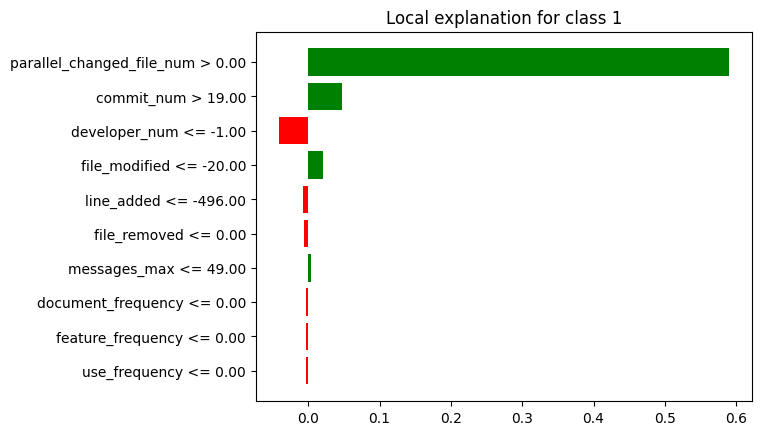

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 commit_num        3  Positivo
3                 line_added        4  Positivo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3               line_removed        4  Positivo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3              file_modified        4  Positivo
4                 line_added        5  Negativo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'file_added', 'line_removed', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'line_added']
['commit_num', 'line_removed', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Positivo       2  Positivo       2   
1               line_removed         -         -       4  Positivo       -   
2              developer_num         2  Positivo       -         -       3   
3              file_modified         -         -       5  Positivo       4   
4  parallel_changed_file_num         1  Positivo       1  Positivo       1   
5                 line_added         4  Positivo       -         -       5   
6                 file_added         -         -       3  Positivo       -   
7               file_removed         5  Positivo       -         -       -   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3  Positivo  
4  Positivo  
5  Negativo  
6         -  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "file_removed", "file_added", "line_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       -         -       3   
commit_num                        3  Positivo       2  Positivo       2   
line_added                        4  Positivo       -         -       5   
file_removed                      5  Positivo       -         -       -   
file_added                        -         -       3  Positivo       -   
line_removed                      -         -       4  Positivo       -   
file_modified                     -         -       5  Positivo       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                 Positivo  
line_added                 Negativo  
file_removed                      -  
file_added                        -  
line_removed                      -  
file_modified              Positivo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

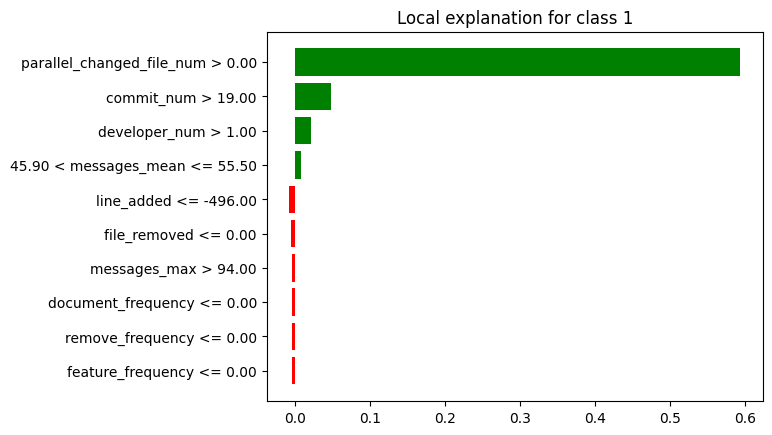

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)
lime_fp_df_mediana.at[3, 'Variable'] = 'messages_mean'

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3              file_modified        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               file_removed        4  Positivo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3              messages_mean        4  Positivo
4                 line_added        5  Negativo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'messages_mean', 'line_added']
['commit_num', 'messages_mean', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1              messages_mean         -         -       -         -       4   
2              developer_num         3  Positivo       3  Positivo       3   
3  parallel_changed_file_num         1  Positivo       1  Positivo       1   
4              file_modified         4  Positivo       -         -       -   
5                 line_added         -         -       -         -       5   
6                 file_added         5  Negativo       5  Positivo       -   
7               file_removed         -         -       4  Positivo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Positivo  
4         -  
5  Negativo  
6         -  
7         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_modified", "file_added", "file_removed", "messages_mean", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       3   
file_modified                     4  Positivo       -         -       -   
file_added                        5  Negativo       5  Positivo       -   
file_removed                      -         -       4  Positivo       -   
messages_mean                     -         -       -         -       4   
line_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Positivo  
file_modified                     -  
file_added                        -  
file_removed                      -  
messages_mean              Positivo  
line_added                 Negativo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

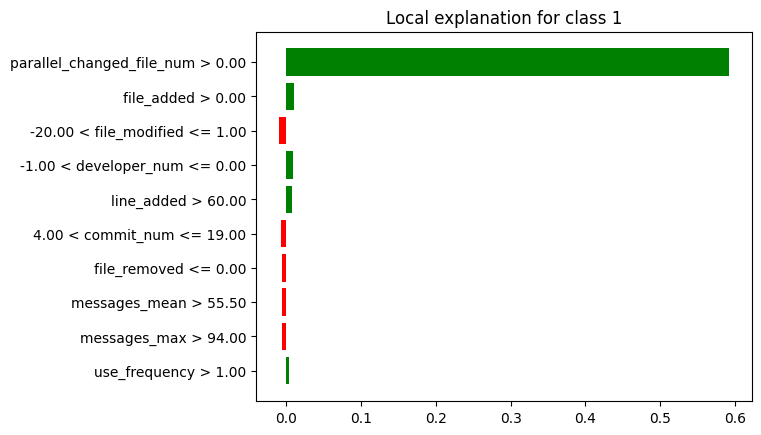

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)
lime_fp_df_min.at[2, 'Variable'] = 'file_modified'
lime_fp_df_min.at[3, 'Variable'] = 'developer_num'

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2              messages_mean        3  Negativo
3                   duration        4  Positivo
4                 commit_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2              messages_mean        3  Negativo
3                 commit_num        4  Negativo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 file_added        2  Positivo
2              file_modified        3  Negativo
3              developer_num        4  Positivo
4                 line_added        5  Positivo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'messages_mean', 'duration', 'commit_num']
['parallel_changed_file_num', 'developer_num', 'messages_mean', 'commit_num', 'file_modified']
['parallel_changed_file_num', 'file_added', 'file_modified', 'developer_num', 'line_added']
['commit_num', 'messages_mean', 'duration', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         5  Negativo       4  Negativo       -   
1              messages_mean         3  Negativo       3  Negativo       -   
2                   duration         4  Positivo       -         -       -   
3              developer_num         2  Positivo       2  Positivo       4   
4              file_modified         -         -       5  Negativo       3   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6                 line_added         -         -       -         -       5   
7                 file_added         -         -       -         -       2   

             
      Signo  
0         -  
1         -  
2         -  
3  Positivo  
4  Negativo  
5  Positivo  
6  Positivo  
7  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "messages_mean", "duration", "commit_num", "file_modified", "file_added", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       4   
messages_mean                     3  Negativo       3  Negativo       -   
duration                          4  Positivo       -         -       -   
commit_num                        5  Negativo       4  Negativo       -   
file_modified                     -         -       5  Negativo       3   
file_added                        -         -       -         -       2   
line_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
messages_mean                     -  
duration                          -  
commit_num                        -  
file_modified              Negativo  
file_added                 Positivo  
line_added                 Positivo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_modified', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('messages_mean', 3), ('duration', 4), ('commit_num', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 3), ('line_removed', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 5), ('file_removed', 4), ('parallel_changed_file_num', 1), ('developer_num', 2), ('messages_mean', 3), ('commit_num', 4), ('file_modified', 5)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 3), ('commit_num', 2), ('line_added', 5), ('file_modified', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('messages_mean', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        5.0      1           4.0      1   
file_added                          5.0      1           4.0      2   
line_added                          4.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       4.0      1           5.0      2   
developer_num                  2.333333      3           2.5      2   
duration                            4.0      1             -      -   
line_removed                          -      -           4.0      1   
messages_mean                       3.0      1           3.0      1   
commit_num                     3.333333      3      2.666667      3   

                                   Lime         
                          Ranking Medio Conteo  
file_removed                          -      -  
file_added                          2.0      1  
line_added                          5.0      3  
parallel_changed_file_num           1.0      3  
file_modified                       3.5      2  
developer_num                  3.333333      3  
duration                              -      -  
line_removed                          -      -  
messages_mean                       4.0      1  
commit_num                          2.0      2

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_fp[("General", "Ranking")] = df_resumen_rf_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_fp[("General", "Conteo Total")] = df_resumen_rf_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        5.0      1           4.0      1   
file_added                          5.0      1           4.0      2   
line_added                          4.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       4.0      1           5.0      2   
developer_num                  2.333333      3           2.5      2   
duration                            4.0      1             -      -   
line_removed                          -      -           4.0      1   
messages_mean                       3.0      1           3.0      1   
commit_num                     3.333333      3      2.666667      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_removed                          -      -  4.500000            2  
file_added                          2.0      1  3.666667            4  
line_added                          5.0      3  4.500000            4  
parallel_changed_file_num           1.0      3  1.000000            9  
file_modified                       3.5      2  4.166667            5  
developer_num                  3.333333      3  2.722222            8  
duration                              -      -  4.000000            1  
line_removed                          -      -  4.000000            1  
messages_mean                       4.0      1  3.333333            3  
commit_num                          2.0      2  2.666667            8

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_fp[("General", "Peso Rango")] = 1 - ((df_resumen_rf_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_fp[("General", "Peso Conteo")] = df_resumen_rf_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_fp[("General", "Puntaje")] = df_resumen_rf_fp[("General", "Peso Rango")] + df_resumen_rf_fp[("General", "Peso Conteo")]
df_resumen_rf_fp[("General", "Ranking")] = df_resumen_rf_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        5.0      1           4.0      1   
file_added                          5.0      1           4.0      2   
line_added                          4.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       4.0      1           5.0      2   
developer_num                  2.333333      3           2.5      2   
duration                            4.0      1             -      -   
line_removed                          -      -           4.0      1   
messages_mean                       3.0      1           3.0      1   
commit_num                     3.333333      3      2.666667      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_removed                          -      -    10.0            2  
file_added                          2.0      1     4.0            4  
line_added                          5.0      3     7.0            4  
parallel_changed_file_num           1.0      3     1.0            9  
file_modified                       3.5      2     6.0            5  
developer_num                  3.333333      3     3.0            8  
duration                              -      -     8.0            1  
line_removed                          -      -     8.0            1  
messages_mean                       4.0      1     5.0            3  
commit_num                          2.0      2     2.0            8

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_fp = df_resumen_rf_fp[new_columns]

In [ ]:
df_resumen_rf_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_fp[(tech, "Ranking Medio")] = df_resumen_rf_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            8          3.33      3   
developer_num                 3.0            8          2.33      3   
file_added                    4.0            4          5.00      1   
messages_mean                 5.0            3          3.00      1   
file_modified                 6.0            5          4.00      1   
line_added                    7.0            4          4.00      1   
duration                      8.0            1          4.00      1   
line_removed                  8.0            1             -      -   
file_removed                 10.0            2          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.67      3          2.00      2  
developer_num                      2.50      2          3.33      3  
file_added                         4.00      2          2.00      1  
messages_mean                      3.00      1          4.00      1  
file_modified                      5.00      2          3.50      2  
line_added                            -      -          5.00      3  
duration                              -      -             -      -  
line_removed                       4.00      1             -      -  
file_removed                       4.00      1             -      -

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

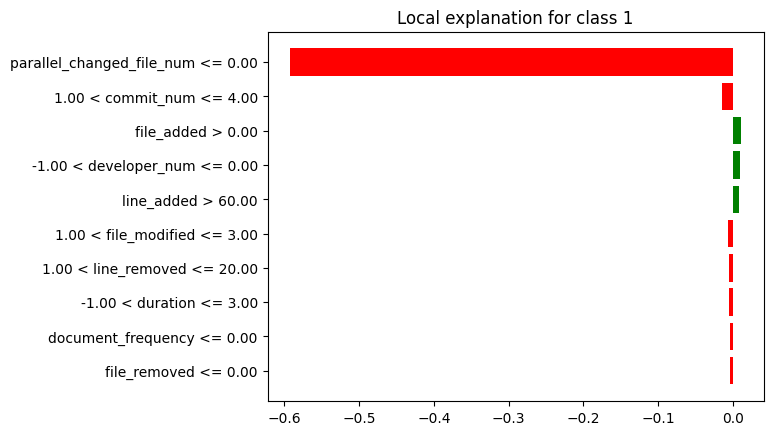

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[1, 'Variable'] = 'commit_num'
lime_fn_df_max.at[3, 'Variable'] = 'developer_num'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 line_added        3  Negativo
3                 file_added        4  Negativo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3                 file_added        4  Negativo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2                 file_added        3  Positivo
3              developer_num        4  Positivo
4                 line_added        5  Positivo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'developer_num', 'line_added', 'file_added', 'line_removed']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_added', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'file_added', 'developer_num', 'line_added']
['commit_num', 'line_removed', 'developer_num', 'parallel_changed_file_num', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         -         -       3  Negativo       2   
1               line_removed         5  Positivo       5  Negativo       -   
2              developer_num         2  Positivo       2  Positivo       4   
3  parallel_changed_file_num         1  Negativo       1  Negativo       1   
4                 line_added         3  Negativo       -         -       5   
5                 file_added         4  Negativo       4  Negativo       3   

             
      Signo  
0  Negativo  
1         -  
2  Positivo  
3  Negativo  
4  Positivo  
5  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "line_added", "file_added", "line_removed", "commit_num"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
developer_num                     2  Positivo       2  Positivo       4   
line_added                        3  Negativo       -         -       5   
file_added                        4  Negativo       4  Negativo       3   
line_removed                      5  Positivo       5  Negativo       -   
commit_num                        -         -       3  Negativo       2   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
developer_num              Positivo  
line_added                 Positivo  
file_added                 Positivo  
line_removed                      -  
commit_num                 Negativo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

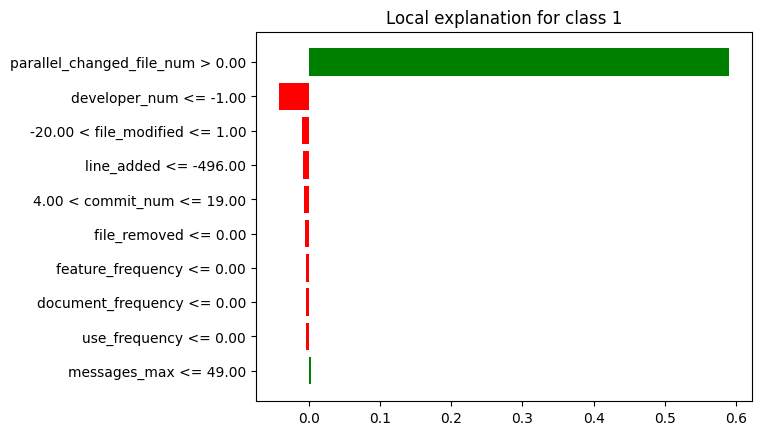

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[2, 'Variable'] = 'file_modified'
lime_fn_df_mediana.at[4, 'Variable'] = 'commit_num'

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                   duration        3  Negativo
3               line_removed        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Positivo
3                   duration        4  Negativo
4             commit_density        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2              file_modified        3  Negativo
3                 line_added        4  Negativo
4                 commit_num        5  Negativo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'duration', 'line_removed', 'file_added']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'duration', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'file_modified', 'line_added', 'commit_num']
['commit_num', 'commit_density', 'line_removed', 'duration', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         -         -       -         -       5   
1             commit_density         -         -       5  Negativo       -   
2               line_removed         4  Negativo       -         -       -   
3                   duration         3  Negativo       4  Negativo       -   
4              developer_num         2  Negativo       2  Negativo       2   
5              file_modified         -         -       -         -       3   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7                 line_added         -         -       -         -       4   
8                 file_added         5  Negativo       -         -       -   
9               file_removed         -         -       3  Positivo       -   

             
      Signo  
0  Negativo  
1         -  
2         -  
3         -  
4  Negativo  
5  Negativo  
6  Positivo  
7  Negativo  
8         -  
9         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "duration", "line_removed", "file_added", "file_removed", "commit_density", "file_modified", "line_added", "commit_num"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
duration                          3  Negativo       4  Negativo       -   
line_removed                      4  Negativo       -         -       -   
file_added                        5  Negativo       -         -       -   
file_removed                      -         -       3  Positivo       -   
commit_density                    -         -       5  Negativo       -   
file_modified                     -         -       -         -       3   
line_added                        -         -       -         -       4   
commit_num                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
duration                          -  
line_removed                      -  
file_added                        -  
file_removed                      -  
commit_density                    -  
file_modified              Negativo  
line_added                 Negativo  
commit_num                 Negativo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

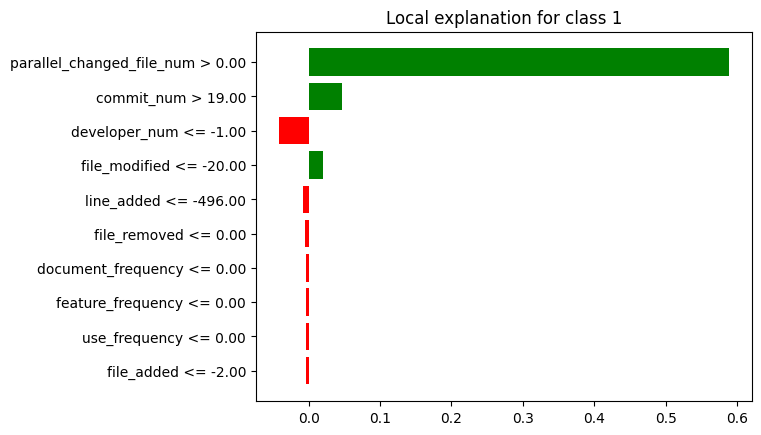

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                   duration        3  Negativo
3              developer_num        4  Negativo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                   duration        4  Negativo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3              file_modified        4  Positivo
4                 line_added        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'duration', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'duration', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'line_added']
['commit_num', 'duration', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       3  Positivo       2   
1                   duration         3  Negativo       4  Negativo       -   
2              developer_num         4  Negativo       2  Negativo       3   
3              file_modified         -         -       -         -       4   
4  parallel_changed_file_num         1  Positivo       1  Positivo       1   
5                 line_added         -         -       -         -       5   
6               file_removed         5  Negativo       5  Positivo       -   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3  Positivo  
4  Positivo  
5  Negativo  
6         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "duration", "developer_num", "file_removed", "file_modified", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       3  Positivo       2   
duration                          3  Negativo       4  Negativo       -   
developer_num                     4  Negativo       2  Negativo       3   
file_removed                      5  Negativo       5  Positivo       -   
file_modified                     -         -       -         -       4   
line_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
duration                          -  
developer_num              Negativo  
file_removed                      -  
file_modified              Positivo  
line_added                 Negativo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('developer_num', 2), ('line_added', 3), ('file_added', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('line_removed', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('duration', 3), ('developer_num', 4), ('file_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('developer_num', 2), ('file_added', 4), ('line_removed', 5), ('commit_num', 3), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 4), ('file_removed', 3), ('commit_density', 5), ('parallel_changed_file_num', 1), ('commit_num', 3), ('duration', 4), ('developer_num', 2), ('file_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 4), ('line_added', 5), ('file_added', 3), ('commit_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_modified', 3), ('line_added', 4), ('commit_num', 5), ('parallel_changed_file_num', 1), ('commit_num'

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        5.0      1           4.0      2   
file_added                          4.5      2           4.0      1   
line_added                          3.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                         -      -             -      -   
developer_num                  2.666667      3           2.0      3   
duration                            3.0      2           4.0      2   
line_removed                        4.5      2           5.0      1   
commit_density                        -      -           5.0      1   
commit_num                          2.0      1           3.0      2   

                                   Lime         
                          Ranking Medio Conteo  
file_removed                          -      -  
file_added                          3.0      1  
line_added                     4.666667      3  
parallel_changed_file_num           1.0      3  
file_modified                       3.5      2  
developer_num                       3.0      3  
duration                              -      -  
line_removed                          -      -  
commit_density                        -      -  
commit_num                          3.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_fn[("General", "Ranking")] = df_resumen_rf_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_fn[("General", "Conteo Total")] = df_resumen_rf_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        5.0      1           4.0      2   
file_added                          4.5      2           4.0      1   
line_added                          3.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                         -      -             -      -   
developer_num                  2.666667      3           2.0      3   
duration                            3.0      2           4.0      2   
line_removed                        4.5      2           5.0      1   
commit_density                        -      -           5.0      1   
commit_num                          2.0      1           3.0      2   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_removed                          -      -  4.500000            3  
file_added                          3.0      1  3.833333            4  
line_added                     4.666667      3  3.833333            4  
parallel_changed_file_num           1.0      3  1.000000            9  
file_modified                       3.5      2  3.500000            2  
developer_num                       3.0      3  2.555556            9  
duration                              -      -  3.500000            4  
line_removed                          -      -  4.750000            3  
commit_density                        -      -  5.000000            1  
commit_num                          3.0      3  2.666667            6

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_fn[("General", "Peso Rango")] = 1 - ((df_resumen_rf_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_fn[("General", "Peso Conteo")] = df_resumen_rf_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_fn[("General", "Puntaje")] = df_resumen_rf_fn[("General", "Peso Rango")] + df_resumen_rf_fn[("General", "Peso Conteo")]
df_resumen_rf_fn[("General", "Ranking")] = df_resumen_rf_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        5.0      1           4.0      2   
file_added                          4.5      2           4.0      1   
line_added                          3.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                         -      -             -      -   
developer_num                  2.666667      3           2.0      3   
duration                            3.0      2           4.0      2   
line_removed                        4.5      2           5.0      1   
commit_density                        -      -           5.0      1   
commit_num                          2.0      1           3.0      2   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_removed                          -      -     8.0            3  
file_added                          3.0      1     5.0            4  
line_added                     4.666667      3     5.0            4  
parallel_changed_file_num           1.0      3     1.0            9  
file_modified                       3.5      2     7.0            2  
developer_num                       3.0      3     2.0            9  
duration                              -      -     4.0            4  
line_removed                          -      -     9.0            3  
commit_density                        -      -    10.0            1  
commit_num                          3.0      3     3.0            6

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_fn = df_resumen_rf_fn[new_columns]

In [ ]:
df_resumen_rf_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_fn[(tech, "Ranking Medio")] = df_resumen_rf_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            9          2.67      3   
commit_num                    3.0            6          2.00      1   
duration                      4.0            4          3.00      2   
file_added                    5.0            4          4.50      2   
line_added                    5.0            4          3.00      1   
file_modified                 7.0            2             -      -   
file_removed                  8.0            3          5.00      1   
line_removed                  9.0            3          4.50      2   
commit_density               10.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.00      3          3.00      3  
commit_num                         3.00      2          3.00      3  
duration                           4.00      2             -      -  
file_added                         4.00      1          3.00      1  
line_added                            -      -          4.67      3  
file_modified                         -      -          3.50      2  
file_removed                       4.00      2             -      -  
line_removed                       5.00      1             -      -  
commit_density                     5.00      1             -      -

## **BalancedRandomForest:**

**FEATURE IMPORTANCE**

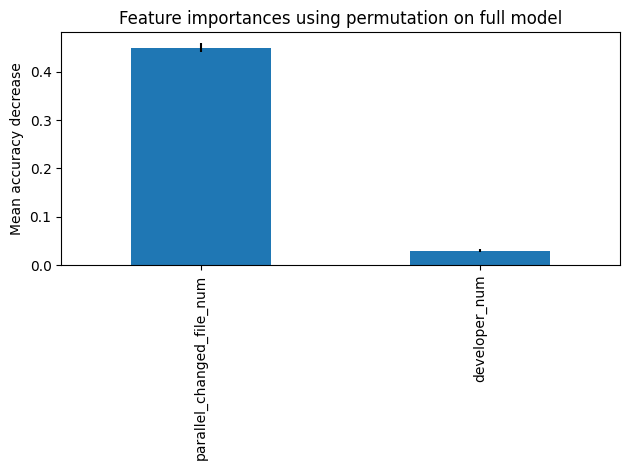

In [ ]:
permu = permutation_importance(modelo_brf, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(2), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

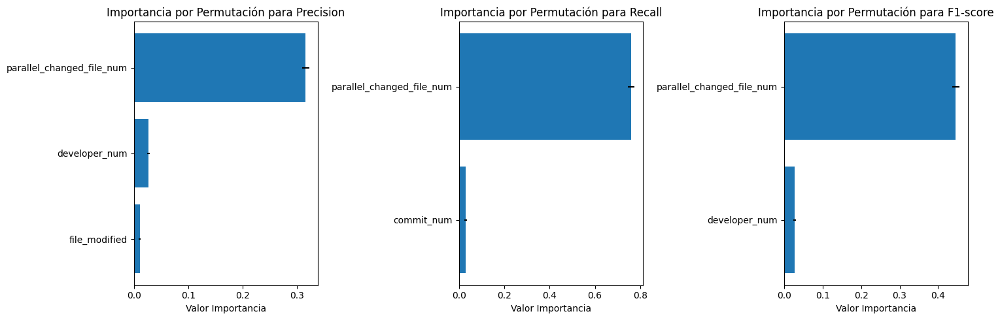

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_brf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_brf = {}

permu_score = permutation_importance(modelo_brf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_brf[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_brf['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.315703,0.006332
2,developer_num,0.026480,0.002195
1,file_modified,0.010390,0.001690


In [ ]:
results_global_brf['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.758792,0.014609
1,commit_num,0.028899,0.005637


In [ ]:
results_global_brf['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.445916,0.008825
1,developer_num,0.027530,0.002969


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_brf, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 18689 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 18689 values
  -> model_class       : imblearn.ensemble._forest.BalancedRandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x79995e3f7d00> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.194, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -1.0, mean = -0.112, max = 0.537
  -> model_info        : package imblearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

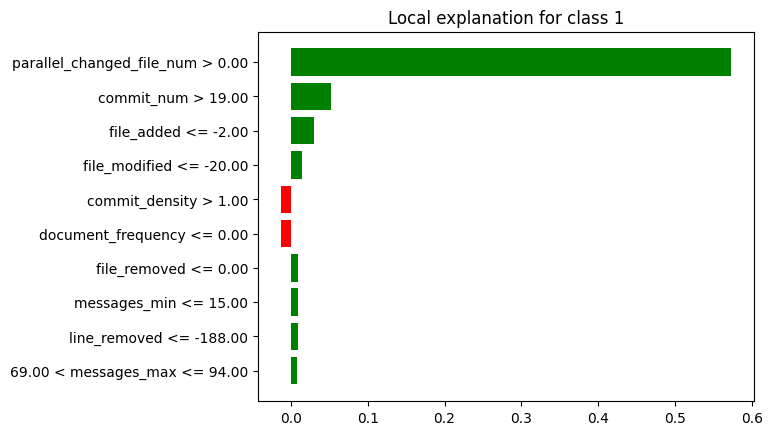

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2               line_removed        3  Positivo
3                 commit_num        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3              file_modified        4  Positivo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3              file_modified        4  Positivo
4             commit_density        5  Negativo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'file_removed', 'line_removed', 'commit_num', 'line_added']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_modified', 'file_added']
['parallel_changed_file_num', 'commit_num', 'file_added', 'file_modified', 'commit_density']
['commit_num', 'commit_density', 'line_removed', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         4  Positivo       2  Positivo       2   
1             commit_density         -         -       -         -       5   
2               line_removed         3  Positivo       3  Positivo       -   
3              file_modified         -         -       4  Positivo       4   
4  parallel_changed_file_num         1  Positivo       1  Positivo       1   
5                 line_added         5  Negativo       -         -       -   
6                 file_added         -         -       5  Positivo       3   
7               file_removed         2  Positivo       -         -       -   

             
      Signo  
0  Positivo  
1  Negativo  
2         -  
3  Positivo  
4  Positivo  
5         -  
6  Positivo  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "line_removed", "commit_num", "line_added", "file_modified", "file_added", "commit_density"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      2  Positivo       -         -       -   
line_removed                      3  Positivo       3  Positivo       -   
commit_num                        4  Positivo       2  Positivo       2   
line_added                        5  Negativo       -         -       -   
file_modified                     -         -       4  Positivo       4   
file_added                        -         -       5  Positivo       3   
commit_density                    -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed                      -  
line_removed                      -  
commit_num                 Positivo  
line_added                        -  
file_modified              Positivo  
file_added                 Positivo  
commit_density             Negativo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

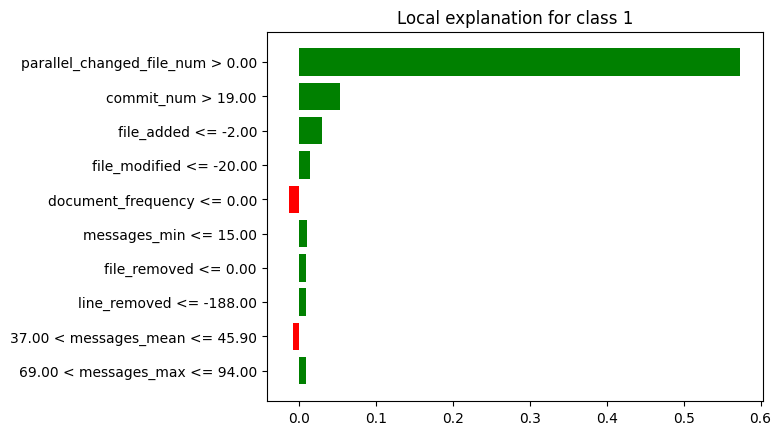

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2              file_modified        3  Negativo
3               line_removed        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3               line_removed        4  Positivo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3              file_modified        4  Positivo
4         document_frequency        5  Negativo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'file_removed', 'file_modified', 'line_removed', 'commit_num']
['parallel_changed_file_num', 'commit_num', 'file_added', 'line_removed', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'file_added', 'file_modified', 'document_frequency']
['commit_num', 'line_removed', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'file_added', 'file_removed', 'document_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         5  Positivo       2  Positivo       2   
1               line_removed         4  Positivo       4  Positivo       -   
2              developer_num         -         -       5  Positivo       -   
3  parallel_changed_file_num         1  Positivo       1  Positivo       1   
4              file_modified         3  Negativo       -         -       4   
5                 file_added         -         -       3  Positivo       3   
6               file_removed         2  Positivo       -         -       -   
7         document_frequency         -         -       -         -       5   

             
      Signo  
0  Positivo  
1         -  
2         -  
3  Positivo  
4  Positivo  
5  Positivo  
6         -  
7  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "file_modified", "line_removed", "commit_num", "file_added", "developer_num", "document_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      2  Positivo       -         -       -   
file_modified                     3  Negativo       -         -       4   
line_removed                      4  Positivo       4  Positivo       -   
commit_num                        5  Positivo       2  Positivo       2   
file_added                        -         -       3  Positivo       3   
developer_num                     -         -       5  Positivo       -   
document_frequency                -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed                      -  
file_modified              Positivo  
line_removed                      -  
commit_num                 Positivo  
file_added                 Positivo  
developer_num                     -  
document_frequency         Negativo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

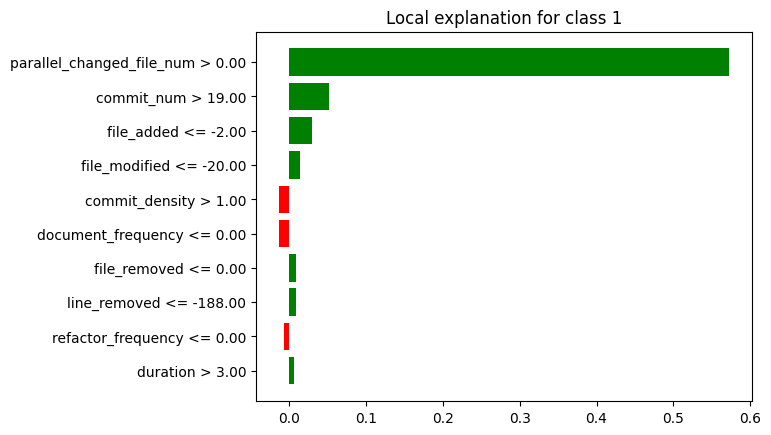

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3              fix_frequency        4  Negativo
4           update_frequency        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 file_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Negativo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3              file_modified        4  Positivo
4             commit_density        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'developer_num', 'fix_frequency', 'update_frequency']
['parallel_changed_file_num', 'file_added', 'commit_num', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'file_added', 'file_modified', 'commit_density']
['commit_num', 'fix_frequency', 'commit_density', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'update_frequency', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       3  Positivo       2   
1              fix_frequency         4  Negativo       -         -       -   
2             commit_density         -         -       -         -       5   
3              developer_num         3  Negativo       4  Negativo       -   
4              file_modified         -         -       -         -       4   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6           update_frequency         5  Negativo       -         -       -   
7                 file_added         -         -       2  Positivo       3   
8               file_removed         -         -       5  Negativo       -   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3         -  
4  Positivo  
5  Positivo  
6         -  
7  Positivo  
8         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "fix_frequency", "update_frequency", "file_added", "file_removed", "file_modified", "commit_density"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       3  Positivo       2   
developer_num                     3  Negativo       4  Negativo       -   
fix_frequency                     4  Negativo       -         -       -   
update_frequency                  5  Negativo       -         -       -   
file_added                        -         -       2  Positivo       3   
file_removed                      -         -       5  Negativo       -   
file_modified                     -         -       -         -       4   
commit_density                    -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num                     -  
fix_frequency                     -  
update_frequency                  -  
file_added                 Positivo  
file_removed                      -  
file_modified              Positivo  
commit_density             Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('file_removed', 2), ('line_removed', 3), ('commit_num', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('file_modified', 3), ('line_removed', 4), ('commit_num', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('fix_frequency', 4), ('update_frequency', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('line_removed', 3), ('commit_num', 2), ('file_modified', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('line_removed', 4), ('commit_num', 2), ('file_added', 3), ('developer_num', 5), ('parallel_changed_file_num', 1), ('commit_num', 3), ('developer_num', 4), ('file_added', 2), ('file_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 4), ('file_added', 3), ('commit_density', 5), ('parallel_changed_file_num', 1), ('file_modified', 4), ('commit_num', 2), ('file_added', 3), ('document_frequency', 5), ('parallel_changed_file_nu

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
document_frequency                    -      -             -      -   
file_removed                        2.0      2           5.0      1   
file_added                            -      -      3.333333      3   
line_added                          5.0      1             -      -   
update_frequency                    5.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       3.0      1           4.0      1   
developer_num                       3.0      1           4.5      2   
line_removed                        3.5      2           3.5      2   
commit_density                        -      -             -      -   
fix_frequency                       4.0      1             -      -   
commit_num                     3.666667      3      2.333333      3   

                                   Lime         
                          Ranking Medio Conteo  
document_frequency                  5.0      1  
file_removed                          -      -  
file_added                          3.0      3  
line_added                            -      -  
update_frequency                      -      -  
parallel_changed_file_num           1.0      3  
file_modified                       4.0      3  
developer_num                         -      -  
line_removed                          -      -  
commit_density                      5.0      2  
fix_frequency                         -      -  
commit_num                          2.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_vp[("General", "Ranking")] = df_resumen_brf_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_vp[("General", "Conteo Total")] = df_resumen_brf_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
document_frequency                    -      -             -      -   
file_removed                        2.0      2           5.0      1   
file_added                            -      -      3.333333      3   
line_added                          5.0      1             -      -   
update_frequency                    5.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       3.0      1           4.0      1   
developer_num                       3.0      1           4.5      2   
line_removed                        3.5      2           3.5      2   
commit_density                        -      -             -      -   
fix_frequency                       4.0      1             -      -   
commit_num                     3.666667      3      2.333333      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
document_frequency                  5.0      1  5.000000            1  
file_removed                          -      -  3.500000            3  
file_added                          3.0      3  3.166667            6  
line_added                            -      -  5.000000            1  
update_frequency                      -      -  5.000000            1  
parallel_changed_file_num           1.0      3  1.000000            9  
file_modified                       4.0      3  3.666667            5  
developer_num                         -      -  3.750000            3  
line_removed                          -      -  3.500000            4  
commit_density                      5.0      2  5.000000            2  
fix_frequency                         -      -  4.000000            1  
commit_num                          2.0      3  2.666667            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_vp[("General", "Peso Rango")] = 1 - ((df_resumen_brf_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_vp[("General", "Peso Conteo")] = df_resumen_brf_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_vp[("General", "Puntaje")] = df_resumen_brf_vp[("General", "Peso Rango")] + df_resumen_brf_vp[("General", "Peso Conteo")]
df_resumen_brf_vp[("General", "Ranking")] = df_resumen_brf_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
document_frequency                    -      -             -      -   
file_removed                        2.0      2           5.0      1   
file_added                            -      -      3.333333      3   
line_added                          5.0      1             -      -   
update_frequency                    5.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       3.0      1           4.0      1   
developer_num                       3.0      1           4.5      2   
line_removed                        3.5      2           3.5      2   
commit_density                        -      -             -      -   
fix_frequency                       4.0      1             -      -   
commit_num                     3.666667      3      2.333333      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
document_frequency                  5.0      1    10.0            1  
file_removed                          -      -     6.0            3  
file_added                          3.0      3     3.0            6  
line_added                            -      -    10.0            1  
update_frequency                      -      -    10.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
file_modified                       4.0      3     5.0            5  
developer_num                         -      -     7.0            3  
line_removed                          -      -     4.0            4  
commit_density                      5.0      2     8.0            2  
fix_frequency                         -      -     8.0            1  
commit_num                          2.0      3     2.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_vp = df_resumen_brf_vp[new_columns]

In [ ]:
df_resumen_brf_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_vp[(tech, "Ranking Medio")] = df_resumen_brf_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          3.67      3   
file_added                    3.0            6             -      -   
line_removed                  4.0            4          3.50      2   
file_modified                 5.0            5          3.00      1   
file_removed                  6.0            3          2.00      2   
developer_num                 7.0            3          3.00      1   
commit_density                8.0            2             -      -   
fix_frequency                 8.0            1          4.00      1   
document_frequency           10.0            1             -      -   
line_added                   10.0            1          5.00      1   
update_frequency             10.0            1          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.33      3          2.00      3  
file_added                         3.33      3          3.00      3  
line_removed                       3.50      2             -      -  
file_modified                      4.00      1          4.00      3  
file_removed                       5.00      1             -      -  
developer_num                      4.50      2             -      -  
commit_density                        -      -          5.00      2  
fix_frequency                         -      -             -      -  
document_frequency                    -      -          5.00      1  
line_added                            -      -             -      -  
update_frequency                      -      -             -      -

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

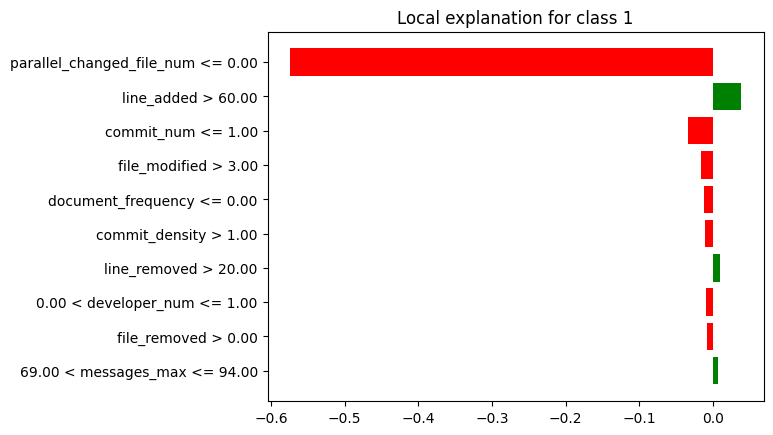

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              fix_frequency        2  Negativo
2                 commit_num        3  Negativo
3              developer_num        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              fix_frequency        3  Negativo
3                 file_added        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 line_added        2  Positivo
2                 commit_num        3  Negativo
3              file_modified        4  Negativo
4         document_frequency        5  Negativo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'fix_frequency', 'commit_num', 'developer_num', 'duration']
['parallel_changed_file_num', 'commit_num', 'fix_frequency', 'file_added', 'line_added']
['parallel_changed_file_num', 'line_added', 'commit_num', 'file_modified', 'document_frequency']
['commit_num', 'fix_frequency', 'duration', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added', 'document_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Negativo       2  Negativo       3   
1              fix_frequency         2  Negativo       3  Negativo       -   
2                   duration         5  Positivo       -         -       -   
3              developer_num         4  Positivo       -         -       -   
4              file_modified         -         -       -         -       4   
5  parallel_changed_file_num         1  Negativo       1  Negativo       1   
6                 line_added         -         -       5  Negativo       2   
7                 file_added         -         -       4  Negativo       -   
8         document_frequency         -         -       -         -       5   

             
      Signo  
0  Negativo  
1         -  
2         -  
3         -  
4  Negativo  
5  Negativo  
6  Positivo  
7         -  
8  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "fix_frequency", "commit_num", "developer_num", "duration", "file_added", "line_added", "file_modified", "document_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
fix_frequency                     2  Negativo       3  Negativo       -   
commit_num                        3  Negativo       2  Negativo       3   
developer_num                     4  Positivo       -         -       -   
duration                          5  Positivo       -         -       -   
file_added                        -         -       4  Negativo       -   
line_added                        -         -       5  Negativo       2   
file_modified                     -         -       -         -       4   
document_frequency                -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
fix_frequency                     -  
commit_num                 Negativo  
developer_num                     -  
duration                          -  
file_added                        -  
line_added                 Positivo  
file_modified              Negativo  
document_frequency         Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

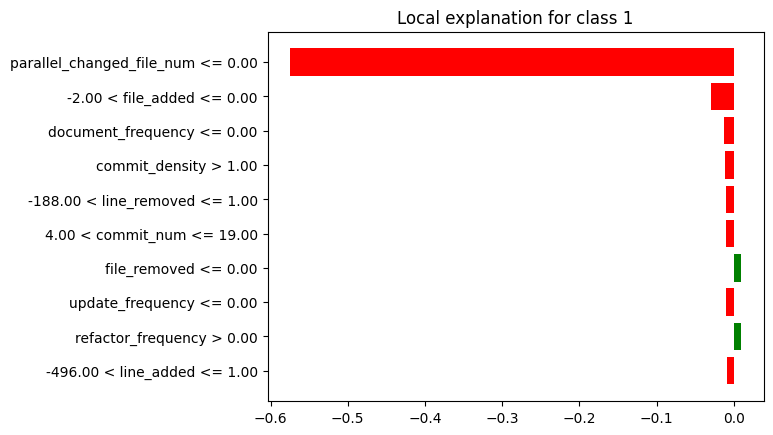

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[1, 'Variable'] = 'file_added'
lime_vn_df_mediana.at[4, 'Variable'] = 'line_removed'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              messages_mean        3  Positivo
3               messages_min        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Negativo
3                   duration        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 file_added        2  Negativo
2         document_frequency        3  Negativo
3             commit_density        4  Negativo
4               line_removed        5  Negativo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'messages_mean', 'messages_min', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'duration', 'file_added']
['parallel_changed_file_num', 'file_added', 'document_frequency', 'commit_density', 'line_removed']
['commit_num', 'messages_mean', 'commit_density', 'line_removed', 'duration', 'developer_num', 'messages_min', 'parallel_changed_file_num', 'file_modified', 'file_added', 'document_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0                  commit_num         2  Negativo       2  Negativo       -   
1               messages_mean         3  Positivo       -         -       -   
2              commit_density         -         -       -         -       4   
3                line_removed         -         -       -         -       5   
4                    duration         -         -       4  Positivo       -   
5               developer_num         -         -       3  Negativo       -   
6                messages_min         4  Negativo       -         -       -   
7   parallel_changed_file_num         1  Negativo       1  Negativo       1   
8               file_modified         5  Positivo       -         -       -   
9                  file_added         -         -       5  Negativo       2   
10         document_frequency         -         -       -         -       3   

              
       Signo  
0          -  
1          -  
2   Negativo  
3   Negativo  
4          -  
5          -  
6          -  
7   Negativo  
8          -  
9   Negativo  
10  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "messages_mean", "messages_min", "file_modified", "developer_num", "duration", "file_added", "document_frequency", "commit_density", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       -   
messages_mean                     3  Positivo       -         -       -   
messages_min                      4  Negativo       -         -       -   
file_modified                     5  Positivo       -         -       -   
developer_num                     -         -       3  Negativo       -   
duration                          -         -       4  Positivo       -   
file_added                        -         -       5  Negativo       2   
document_frequency                -         -       -         -       3   
commit_density                    -         -       -         -       4   
line_removed                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                        -  
messages_mean                     -  
messages_min                      -  
file_modified                     -  
developer_num                     -  
duration                          -  
file_added                 Negativo  
document_frequency         Negativo  
commit_density             Negativo  
line_removed               Negativo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

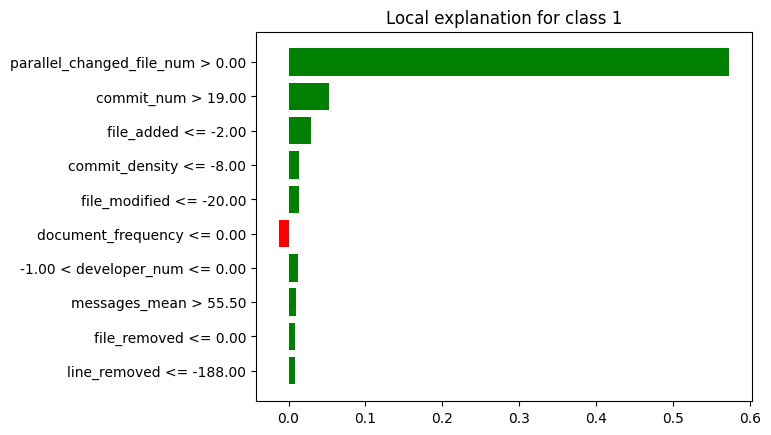

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Negativo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Negativo
3                 line_added        4  Negativo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3             commit_density        4  Positivo
4              file_modified        5  Positivo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'line_removed', 'commit_num', 'line_added', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'line_added', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'file_added', 'commit_density', 'file_modified']
['commit_num', 'commit_density', 'line_removed', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Positivo       2  Positivo       2   
1             commit_density         -         -       -         -       4   
2               line_removed         2  Negativo       3  Negativo       -   
3              file_modified         -         -       5  Negativo       5   
4  parallel_changed_file_num         1  Positivo       1  Positivo       1   
5                 line_added         4  Negativo       4  Negativo       -   
6                 file_added         -         -       -         -       3   
7               file_removed         5  Negativo       -         -       -   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Positivo  
4  Positivo  
5         -  
6  Positivo  
7         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_removed", "commit_num", "line_added", "file_removed", "file_modified", "file_added", "commit_density"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
line_removed                      2  Negativo       3  Negativo       -   
commit_num                        3  Positivo       2  Positivo       2   
line_added                        4  Negativo       4  Negativo       -   
file_removed                      5  Negativo       -         -       -   
file_modified                     -         -       5  Negativo       5   
file_added                        -         -       -         -       3   
commit_density                    -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
line_removed                      -  
commit_num                 Positivo  
line_added                        -  
file_removed                      -  
file_modified              Positivo  
file_added                 Positivo  
commit_density             Positivo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('fix_frequency', 2), ('commit_num', 3), ('developer_num', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('messages_mean', 3), ('messages_min', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('line_removed', 2), ('commit_num', 3), ('line_added', 4), ('file_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('fix_frequency', 3), ('commit_num', 2), ('file_added', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('duration', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('line_removed', 3), ('commit_num', 2), ('line_added', 4), ('file_modified', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 3), ('line_added', 2), ('file_modified', 4), ('document_frequency', 5), ('parallel_changed_file_num', 1), ('file_added', 2), ('document_frequency', 3), ('commit_density', 4), ('line_removed', 5), ('parallel_changed_file_num', 1)

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
document_frequency                    -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       5.0      1           5.0      1   
messages_min                        4.0      1             -      -   
line_removed                        2.0      1           3.0      1   
commit_density                        -      -             -      -   
messages_mean                       3.0      1             -      -   
fix_frequency                       2.0      1           3.0      1   
commit_num                     2.666667      3           2.0      3   
file_removed                        5.0      1             -      -   
file_added                            -      -           4.5      2   
line_added                          4.0      1           4.5      2   
developer_num                       4.0      1           3.0      1   
duration                            5.0      1           4.0      1   

                                   Lime         
                          Ranking Medio Conteo  
document_frequency                  4.0      2  
parallel_changed_file_num           1.0      3  
file_modified                       4.5      2  
messages_min                          -      -  
line_removed                        5.0      1  
commit_density                      4.0      2  
messages_mean                         -      -  
fix_frequency                         -      -  
commit_num                          2.5      2  
file_removed                          -      -  
file_added                          2.5      2  
line_added                          2.0      1  
developer_num                         -      -  
duration                              -      -

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_vn[("General", "Ranking")] = df_resumen_brf_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_vn[("General", "Conteo Total")] = df_resumen_brf_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
document_frequency                    -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       5.0      1           5.0      1   
messages_min                        4.0      1             -      -   
line_removed                        2.0      1           3.0      1   
commit_density                        -      -             -      -   
messages_mean                       3.0      1             -      -   
fix_frequency                       2.0      1           3.0      1   
commit_num                     2.666667      3           2.0      3   
file_removed                        5.0      1             -      -   
file_added                            -      -           4.5      2   
line_added                          4.0      1           4.5      2   
developer_num                       4.0      1           3.0      1   
duration                            5.0      1           4.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
document_frequency                  4.0      2  4.000000            2  
parallel_changed_file_num           1.0      3  1.000000            9  
file_modified                       4.5      2  4.833333            4  
messages_min                          -      -  4.000000            1  
line_removed                        5.0      1  3.333333            3  
commit_density                      4.0      2  4.000000            2  
messages_mean                         -      -  3.000000            1  
fix_frequency                         -      -  2.500000            2  
commit_num                          2.5      2  2.388889            8  
file_removed                          -      -  5.000000            1  
file_added                          2.5      2  3.500000            4  
line_added                          2.0      1  3.500000            4  
developer_num                         -      -  3.500000            2  
duration                              -      -  4.500000            2

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_vn[("General", "Peso Rango")] = 1 - ((df_resumen_brf_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_vn[("General", "Peso Conteo")] = df_resumen_brf_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_vn[("General", "Puntaje")] = df_resumen_brf_vn[("General", "Peso Rango")] + df_resumen_brf_vn[("General", "Peso Conteo")]
df_resumen_brf_vn[("General", "Ranking")] = df_resumen_brf_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
document_frequency                    -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       5.0      1           5.0      1   
messages_min                        4.0      1             -      -   
line_removed                        2.0      1           3.0      1   
commit_density                        -      -             -      -   
messages_mean                       3.0      1             -      -   
fix_frequency                       2.0      1           3.0      1   
commit_num                     2.666667      3           2.0      3   
file_removed                        5.0      1             -      -   
file_added                            -      -           4.5      2   
line_added                          4.0      1           4.5      2   
developer_num                       4.0      1           3.0      1   
duration                            5.0      1           4.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
document_frequency                  4.0      2    10.0            2  
parallel_changed_file_num           1.0      3     1.0            9  
file_modified                       4.5      2     8.0            4  
messages_min                          -      -    13.0            1  
line_removed                        5.0      1     3.0            3  
commit_density                      4.0      2    10.0            2  
messages_mean                         -      -     8.0            1  
fix_frequency                         -      -     6.0            2  
commit_num                          2.5      2     2.0            8  
file_removed                          -      -    14.0            1  
file_added                          2.5      2     3.0            4  
line_added                          2.0      1     3.0            4  
developer_num                         -      -     7.0            2  
duration                              -      -    12.0            2

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_vn = df_resumen_brf_vn[new_columns]

In [ ]:
df_resumen_brf_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_vn[(tech, "Ranking Medio")] = df_resumen_brf_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            8          2.67      3   
line_removed                  3.0            3          2.00      1   
file_added                    3.0            4             -      -   
line_added                    3.0            4          4.00      1   
fix_frequency                 6.0            2          2.00      1   
developer_num                 7.0            2          4.00      1   
file_modified                 8.0            4          5.00      1   
messages_mean                 8.0            1          3.00      1   
document_frequency           10.0            2             -      -   
commit_density               10.0            2             -      -   
duration                     12.0            2          5.00      1   
messages_min                 13.0            1          4.00      1   
file_removed                 14.0            1          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.00      3          2.50      2  
line_removed                       3.00      1          5.00      1  
file_added                         4.50      2          2.50      2  
line_added                         4.50      2          2.00      1  
fix_frequency                      3.00      1             -      -  
developer_num                      3.00      1             -      -  
file_modified                      5.00      1          4.50      2  
messages_mean                         -      -             -      -  
document_frequency                    -      -          4.00      2  
commit_density                        -      -          4.00      2  
duration                           4.00      1             -      -  
messages_min                          -      -             -      -  
file_removed                          -      -             -      -

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

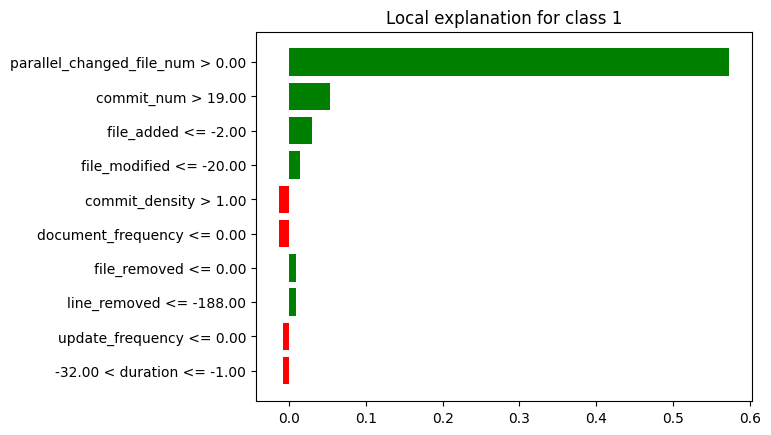

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                 commit_num        3  Positivo
3               line_removed        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Positivo
3               file_removed        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3              file_modified        4  Positivo
4             commit_density        5  Negativo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'file_removed', 'commit_num', 'line_removed', 'line_added']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_removed', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'file_added', 'file_modified', 'commit_density']
['commit_num', 'commit_density', 'line_removed', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Positivo       2  Positivo       2   
1             commit_density         -         -       -         -       5   
2               line_removed         4  Positivo       5  Positivo       -   
3              file_modified         -         -       3  Positivo       4   
4  parallel_changed_file_num         1  Positivo       1  Positivo       1   
5                 line_added         5  Negativo       -         -       -   
6                 file_added         -         -       -         -       3   
7               file_removed         2  Positivo       4  Positivo       -   

             
      Signo  
0  Positivo  
1  Negativo  
2         -  
3  Positivo  
4  Positivo  
5         -  
6  Positivo  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "commit_num", "line_removed", "line_added", "file_modified", "file_added", "commit_density"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      2  Positivo       4  Positivo       -   
commit_num                        3  Positivo       2  Positivo       2   
line_removed                      4  Positivo       5  Positivo       -   
line_added                        5  Negativo       -         -       -   
file_modified                     -         -       3  Positivo       4   
file_added                        -         -       -         -       3   
commit_density                    -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed                      -  
commit_num                 Positivo  
line_removed                      -  
line_added                        -  
file_modified              Positivo  
file_added                 Positivo  
commit_density             Negativo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

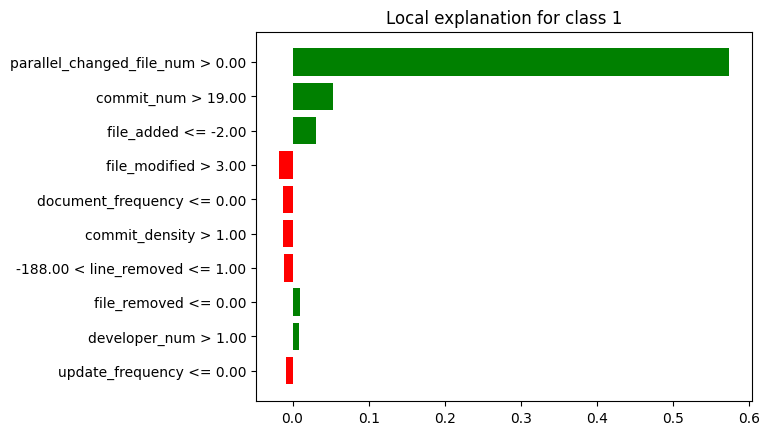

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Negativo
3              developer_num        4  Positivo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 file_added        3  Positivo
3              file_modified        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3              file_modified        4  Negativo
4         document_frequency        5  Negativo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'file_removed', 'developer_num', 'file_added']
['parallel_changed_file_num', 'developer_num', 'file_added', 'file_modified', 'commit_num']
['parallel_changed_file_num', 'commit_num', 'file_added', 'file_modified', 'document_frequency']
['commit_num', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'file_added', 'file_removed', 'document_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       5  Positivo       2   
1              developer_num         4  Positivo       2  Positivo       -   
2              file_modified         -         -       4  Positivo       4   
3  parallel_changed_file_num         1  Positivo       1  Positivo       1   
4                 file_added         5  Positivo       3  Positivo       3   
5               file_removed         3  Negativo       -         -       -   
6         document_frequency         -         -       -         -       5   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3  Positivo  
4  Positivo  
5         -  
6  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "file_removed", "developer_num", "file_added", "file_modified", "document_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       5  Positivo       2   
file_removed                      3  Negativo       -         -       -   
developer_num                     4  Positivo       2  Positivo       -   
file_added                        5  Positivo       3  Positivo       3   
file_modified                     -         -       4  Positivo       4   
document_frequency                -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
file_removed                      -  
developer_num                     -  
file_added                 Positivo  
file_modified              Negativo  
document_frequency         Negativo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

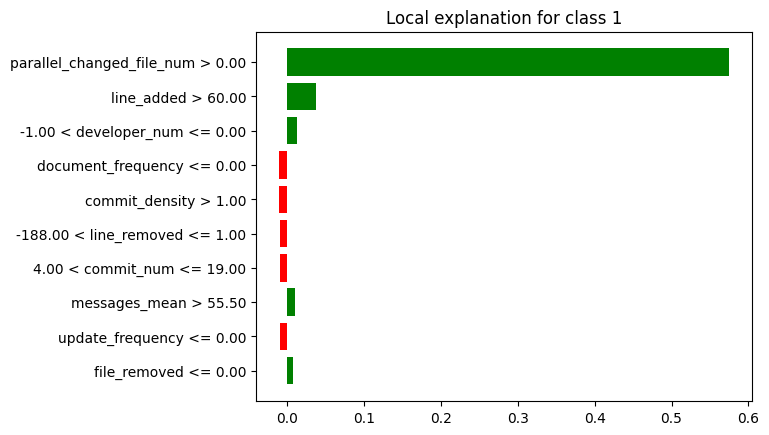

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)
lime_fp_df_min.at[2, 'Variable'] = 'developer_num'

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_min        2  Negativo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4              use_frequency        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_min        2  Negativo
2              messages_mean        3  Positivo
3                 commit_num        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2              developer_num        3  Positivo
3         document_frequency        4  Negativo
4             commit_density        5  Negativo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'messages_min', 'commit_num', 'developer_num', 'use_frequency']
['parallel_changed_file_num', 'messages_min', 'messages_mean', 'commit_num', 'line_removed']
['parallel_changed_file_num', 'line_added', 'developer_num', 'document_frequency', 'commit_density']
['commit_num', 'messages_mean', 'commit_density', 'line_removed', 'developer_num', 'messages_min', 'parallel_changed_file_num', 'line_added', 'use_frequency', 'document_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Positivo       4  Positivo       -   
1              messages_mean         -         -       3  Positivo       -   
2             commit_density         -         -       -         -       5   
3               line_removed         -         -       5  Positivo       -   
4              developer_num         4  Positivo       -         -       3   
5               messages_min         2  Negativo       2  Negativo       -   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7                 line_added         -         -       -         -       2   
8              use_frequency         5  Negativo       -         -       -   
9         document_frequency         -         -       -         -       4   

             
      Signo  
0         -  
1         -  
2  Negativo  
3         -  
4  Positivo  
5         -  
6  Positivo  
7  Positivo  
8         -  
9  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "messages_min", "commit_num", "developer_num", "use_frequency", "messages_mean", "line_removed", "line_added", "document_frequency", "commit_density"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
messages_min                      2  Negativo       2  Negativo       -   
commit_num                        3  Positivo       4  Positivo       -   
developer_num                     4  Positivo       -         -       3   
use_frequency                     5  Negativo       -         -       -   
messages_mean                     -         -       3  Positivo       -   
line_removed                      -         -       5  Positivo       -   
line_added                        -         -       -         -       2   
document_frequency                -         -       -         -       4   
commit_density                    -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
messages_min                      -  
commit_num                        -  
developer_num              Positivo  
use_frequency                     -  
messages_mean                     -  
line_removed                      -  
line_added                 Positivo  
document_frequency         Negativo  
commit_density             Negativo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('file_removed', 2), ('commit_num', 3), ('line_removed', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_removed', 3), ('developer_num', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('messages_min', 2), ('commit_num', 3), ('developer_num', 4), ('use_frequency', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('file_removed', 4), ('commit_num', 2), ('line_removed', 5), ('file_modified', 3), ('parallel_changed_file_num', 1), ('commit_num', 5), ('developer_num', 2), ('file_added', 3), ('file_modified', 4), ('parallel_changed_file_num', 1), ('messages_min', 2), ('commit_num', 4), ('messages_mean', 3), ('line_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 4), ('file_added', 3), ('commit_density', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 3), ('file_modified', 4), ('document_frequency', 5), ('parallel_changed_file_num

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
document_frequency                    -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                         -      -           3.5      2   
messages_min                        2.0      1           2.0      1   
line_removed                        4.0      1           5.0      2   
commit_density                        -      -             -      -   
messages_mean                         -      -           3.0      1   
commit_num                     2.666667      3      3.666667      3   
file_removed                        2.5      2           4.0      1   
use_frequency                       5.0      1             -      -   
file_added                          5.0      1           3.0      1   
line_added                          5.0      1             -      -   
developer_num                       4.0      2           2.0      1   

                                   Lime         
                          Ranking Medio Conteo  
document_frequency                  4.5      2  
parallel_changed_file_num           1.0      3  
file_modified                       4.0      2  
messages_min                          -      -  
line_removed                          -      -  
commit_density                      5.0      2  
messages_mean                         -      -  
commit_num                          2.0      2  
file_removed                          -      -  
use_frequency                         -      -  
file_added                          3.0      2  
line_added                          2.0      1  
developer_num                       3.0      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_fp[("General", "Ranking")] = df_resumen_brf_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_fp[("General", "Conteo Total")] = df_resumen_brf_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
document_frequency                    -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                         -      -           3.5      2   
messages_min                        2.0      1           2.0      1   
line_removed                        4.0      1           5.0      2   
commit_density                        -      -             -      -   
messages_mean                         -      -           3.0      1   
commit_num                     2.666667      3      3.666667      3   
file_removed                        2.5      2           4.0      1   
use_frequency                       5.0      1             -      -   
file_added                          5.0      1           3.0      1   
line_added                          5.0      1             -      -   
developer_num                       4.0      2           2.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
document_frequency                  4.5      2  4.500000            2  
parallel_changed_file_num           1.0      3  1.000000            9  
file_modified                       4.0      2  3.750000            4  
messages_min                          -      -  2.000000            2  
line_removed                          -      -  4.500000            3  
commit_density                      5.0      2  5.000000            2  
messages_mean                         -      -  3.000000            1  
commit_num                          2.0      2  2.777778            8  
file_removed                          -      -  3.250000            3  
use_frequency                         -      -  5.000000            1  
file_added                          3.0      2  3.666667            4  
line_added                          2.0      1  3.500000            2  
developer_num                       3.0      1  3.000000            4

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_fp[("General", "Peso Rango")] = 1 - ((df_resumen_brf_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_fp[("General", "Peso Conteo")] = df_resumen_brf_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_fp[("General", "Puntaje")] = df_resumen_brf_fp[("General", "Peso Rango")] + df_resumen_brf_fp[("General", "Peso Conteo")]
df_resumen_brf_fp[("General", "Ranking")] = df_resumen_brf_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
document_frequency                    -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                         -      -           3.5      2   
messages_min                        2.0      1           2.0      1   
line_removed                        4.0      1           5.0      2   
commit_density                        -      -             -      -   
messages_mean                         -      -           3.0      1   
commit_num                     2.666667      3      3.666667      3   
file_removed                        2.5      2           4.0      1   
use_frequency                       5.0      1             -      -   
file_added                          5.0      1           3.0      1   
line_added                          5.0      1             -      -   
developer_num                       4.0      2           2.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
document_frequency                  4.5      2    11.0            2  
parallel_changed_file_num           1.0      3     1.0            9  
file_modified                       4.0      2     7.0            4  
messages_min                          -      -     4.0            2  
line_removed                          -      -    10.0            3  
commit_density                      5.0      2    12.0            2  
messages_mean                         -      -     9.0            1  
commit_num                          2.0      2     2.0            8  
file_removed                          -      -     6.0            3  
use_frequency                         -      -    13.0            1  
file_added                          3.0      2     5.0            4  
line_added                          2.0      1     8.0            2  
developer_num                       3.0      1     3.0            4

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_fp = df_resumen_brf_fp[new_columns]

In [ ]:
df_resumen_brf_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_fp[(tech, "Ranking Medio")] = df_resumen_brf_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            8          2.67      3   
developer_num                 3.0            4          4.00      2   
messages_min                  4.0            2          2.00      1   
file_added                    5.0            4          5.00      1   
file_removed                  6.0            3          2.50      2   
file_modified                 7.0            4             -      -   
line_added                    8.0            2          5.00      1   
messages_mean                 9.0            1             -      -   
line_removed                 10.0            3          4.00      1   
document_frequency           11.0            2             -      -   
commit_density               12.0            2             -      -   
use_frequency                13.0            1          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         3.67      3          2.00      2  
developer_num                      2.00      1          3.00      1  
messages_min                       2.00      1             -      -  
file_added                         3.00      1          3.00      2  
file_removed                       4.00      1             -      -  
file_modified                      3.50      2          4.00      2  
line_added                            -      -          2.00      1  
messages_mean                      3.00      1             -      -  
line_removed                       5.00      2             -      -  
document_frequency                    -      -          4.50      2  
commit_density                        -      -          5.00      2  
use_frequency                         -      -             -      -

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

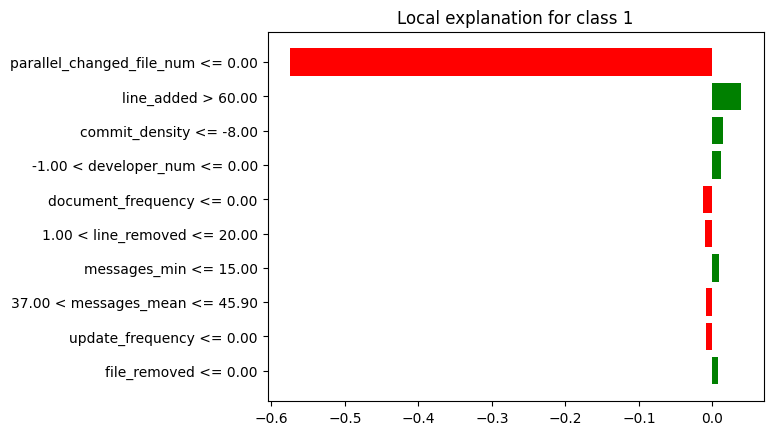

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[3, 'Variable'] = 'developer_num'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 file_added        2  Negativo
2              developer_num        3  Positivo
3                 commit_num        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 file_added        3  Negativo
3              file_modified        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 line_added        2  Positivo
2             commit_density        3  Positivo
3              developer_num        4  Positivo
4         document_frequency        5  Negativo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'file_added', 'developer_num', 'commit_num', 'line_added']
['parallel_changed_file_num', 'developer_num', 'file_added', 'file_modified', 'line_added']
['parallel_changed_file_num', 'line_added', 'commit_density', 'developer_num', 'document_frequency']
['commit_num', 'commit_density', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added', 'document_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         4  Negativo       -         -       -   
1             commit_density         -         -       -         -       3   
2              developer_num         3  Positivo       2  Positivo       4   
3              file_modified         -         -       4  Negativo       -   
4  parallel_changed_file_num         1  Negativo       1  Negativo       1   
5                 line_added         5  Negativo       5  Negativo       2   
6                 file_added         2  Negativo       3  Negativo       -   
7         document_frequency         -         -       -         -       5   

             
      Signo  
0         -  
1  Positivo  
2  Positivo  
3         -  
4  Negativo  
5  Positivo  
6         -  
7  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_added", "developer_num", "commit_num", "line_added", "file_modified", "commit_density", "document_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
file_added                        2  Negativo       3  Negativo       -   
developer_num                     3  Positivo       2  Positivo       4   
commit_num                        4  Negativo       -         -       -   
line_added                        5  Negativo       5  Negativo       2   
file_modified                     -         -       4  Negativo       -   
commit_density                    -         -       -         -       3   
document_frequency                -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
file_added                        -  
developer_num              Positivo  
commit_num                        -  
line_added                 Positivo  
file_modified                     -  
commit_density             Positivo  
document_frequency         Negativo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

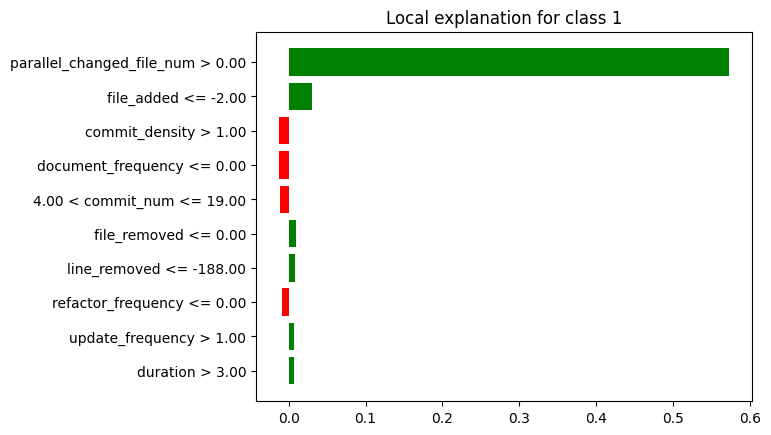

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[4, 'Variable'] = 'commit_num'

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3               messages_max        4  Negativo
4             commit_density        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                   duration        3  Negativo
3               messages_max        4  Negativo
4             commit_density        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 file_added        2  Positivo
2             commit_density        3  Negativo
3         document_frequency        4  Negativo
4                 commit_num        5  Negativo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_num', 'messages_max', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'duration', 'messages_max', 'commit_density']
['parallel_changed_file_num', 'file_added', 'commit_density', 'document_frequency', 'commit_num']
['commit_num', 'commit_density', 'duration', 'developer_num', 'parallel_changed_file_num', 'file_added', 'messages_max', 'document_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Negativo       -         -       5   
1             commit_density         5  Positivo       5  Positivo       3   
2                   duration         -         -       3  Negativo       -   
3              developer_num         2  Negativo       2  Negativo       -   
4  parallel_changed_file_num         1  Positivo       1  Positivo       1   
5                 file_added         -         -       -         -       2   
6               messages_max         4  Negativo       4  Negativo       -   
7         document_frequency         -         -       -         -       4   

             
      Signo  
0  Negativo  
1  Negativo  
2         -  
3         -  
4  Positivo  
5  Positivo  
6         -  
7  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "messages_max", "commit_density", "duration", "file_added", "document_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       -   
commit_num                        3  Negativo       -         -       5   
messages_max                      4  Negativo       4  Negativo       -   
commit_density                    5  Positivo       5  Positivo       3   
duration                          -         -       3  Negativo       -   
file_added                        -         -       -         -       2   
document_frequency                -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num                     -  
commit_num                 Negativo  
messages_max                      -  
commit_density             Negativo  
duration                          -  
file_added                 Positivo  
document_frequency         Negativo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

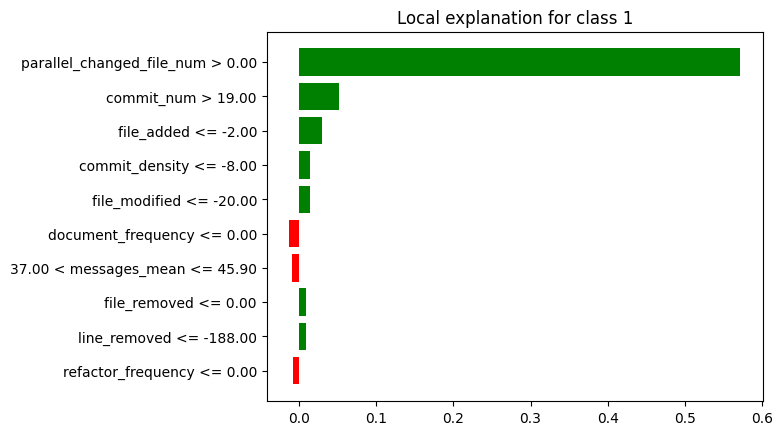

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                   duration        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Negativo
2                 commit_num        3  Positivo
3              developer_num        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3             commit_density        4  Positivo
4              file_modified        5  Positivo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'duration', 'line_added']
['parallel_changed_file_num', 'line_removed', 'commit_num', 'developer_num', 'file_added']
['parallel_changed_file_num', 'commit_num', 'file_added', 'commit_density', 'file_modified']
['commit_num', 'commit_density', 'line_removed', 'duration', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Positivo       3  Positivo       2   
1             commit_density         -         -       -         -       4   
2               line_removed         -         -       2  Negativo       -   
3                   duration         4  Negativo       -         -       -   
4              developer_num         2  Negativo       4  Negativo       -   
5              file_modified         -         -       -         -       5   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7                 line_added         5  Negativo       -         -       -   
8                 file_added         -         -       5  Negativo       3   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3         -  
4         -  
5  Positivo  
6  Positivo  
7         -  
8  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "duration", "line_added", "file_added", "commit_density", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       4  Negativo       -   
commit_num                        3  Positivo       3  Positivo       2   
duration                          4  Negativo       -         -       -   
line_added                        5  Negativo       -         -       -   
file_added                        -         -       5  Negativo       3   
commit_density                    -         -       -         -       4   
file_modified                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num                     -  
commit_num                 Positivo  
duration                          -  
line_added                        -  
file_added                 Positivo  
commit_density             Positivo  
file_modified              Positivo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('file_added', 2), ('developer_num', 3), ('commit_num', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('messages_max', 4), ('commit_density', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('duration', 4), ('line_added', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('file_added', 3), ('developer_num', 2), ('line_added', 5), ('file_modified', 4), ('parallel_changed_file_num', 1), ('developer_num', 2), ('messages_max', 4), ('commit_density', 5), ('duration', 3), ('parallel_changed_file_num', 1), ('developer_num', 4), ('commit_num', 3), ('file_added', 5)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 4), ('line_added', 2), ('commit_density', 3), ('document_frequency', 5), ('parallel_changed_file_num', 1), ('commit_num', 5), ('commit_density', 3), ('file_added', 2), ('document_frequency', 4), ('parallel_changed_file_num', 1), ('commit_nu

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
document_frequency                    -      -             -      -   
messages_max                        4.0      1           4.0      1   
file_added                          2.0      1           4.0      2   
line_added                          5.0      2           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                         -      -           4.0      1   
developer_num                  2.333333      3      2.666667      3   
duration                            4.0      1           3.0      1   
commit_density                      5.0      1           5.0      1   
commit_num                     3.333333      3           3.0      1   

                                   Lime         
                          Ranking Medio Conteo  
document_frequency                  4.5      2  
messages_max                          -      -  
file_added                          2.5      2  
line_added                          2.0      1  
parallel_changed_file_num           1.0      3  
file_modified                       5.0      1  
developer_num                       4.0      1  
duration                              -      -  
commit_density                 3.333333      3  
commit_num                          3.5      2

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_fn[("General", "Ranking")] = df_resumen_brf_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_fn[("General", "Conteo Total")] = df_resumen_brf_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
document_frequency                    -      -             -      -   
messages_max                        4.0      1           4.0      1   
file_added                          2.0      1           4.0      2   
line_added                          5.0      2           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                         -      -           4.0      1   
developer_num                  2.333333      3      2.666667      3   
duration                            4.0      1           3.0      1   
commit_density                      5.0      1           5.0      1   
commit_num                     3.333333      3           3.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
document_frequency                  4.5      2  4.500000            2  
messages_max                          -      -  4.000000            2  
file_added                          2.5      2  2.833333            5  
line_added                          2.0      1  4.000000            4  
parallel_changed_file_num           1.0      3  1.000000            9  
file_modified                       5.0      1  4.500000            2  
developer_num                       4.0      1  3.000000            7  
duration                              -      -  3.500000            2  
commit_density                 3.333333      3  4.444444            5  
commit_num                          3.5      2  3.277778            6

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_fn[("General", "Peso Rango")] = 1 - ((df_resumen_brf_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_fn[("General", "Peso Conteo")] = df_resumen_brf_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_fn[("General", "Puntaje")] = df_resumen_brf_fn[("General", "Peso Rango")] + df_resumen_brf_fn[("General", "Peso Conteo")]
df_resumen_brf_fn[("General", "Ranking")] = df_resumen_brf_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
document_frequency                    -      -             -      -   
messages_max                        4.0      1           4.0      1   
file_added                          2.0      1           4.0      2   
line_added                          5.0      2           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                         -      -           4.0      1   
developer_num                  2.333333      3      2.666667      3   
duration                            4.0      1           3.0      1   
commit_density                      5.0      1           5.0      1   
commit_num                     3.333333      3           3.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
document_frequency                  4.5      2     9.0            2  
messages_max                          -      -     8.0            2  
file_added                          2.5      2     3.0            5  
line_added                          2.0      1     6.0            4  
parallel_changed_file_num           1.0      3     1.0            9  
file_modified                       5.0      1     9.0            2  
developer_num                       4.0      1     2.0            7  
duration                              -      -     7.0            2  
commit_density                 3.333333      3     5.0            5  
commit_num                          3.5      2     4.0            6

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_fn = df_resumen_brf_fn[new_columns]

In [ ]:
df_resumen_brf_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_fn[(tech, "Ranking Medio")] = df_resumen_brf_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            7          2.33      3   
file_added                    3.0            5          2.00      1   
commit_num                    4.0            6          3.33      3   
commit_density                5.0            5          5.00      1   
line_added                    6.0            4          5.00      2   
duration                      7.0            2          4.00      1   
messages_max                  8.0            2          4.00      1   
document_frequency            9.0            2             -      -   
file_modified                 9.0            2             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.67      3          4.00      1  
file_added                         4.00      2          2.50      2  
commit_num                         3.00      1          3.50      2  
commit_density                     5.00      1          3.33      3  
line_added                         5.00      1          2.00      1  
duration                           3.00      1             -      -  
messages_max                       4.00      1             -      -  
document_frequency                    -      -          4.50      2  
file_modified                      4.00      1          5.00      1

## **GradientBoosting:**

**FEATURE IMPORTANCE**

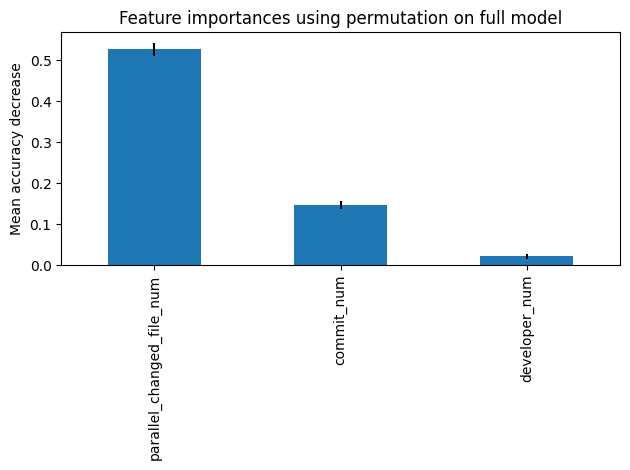

In [ ]:
permu = permutation_importance(modelo_gb, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

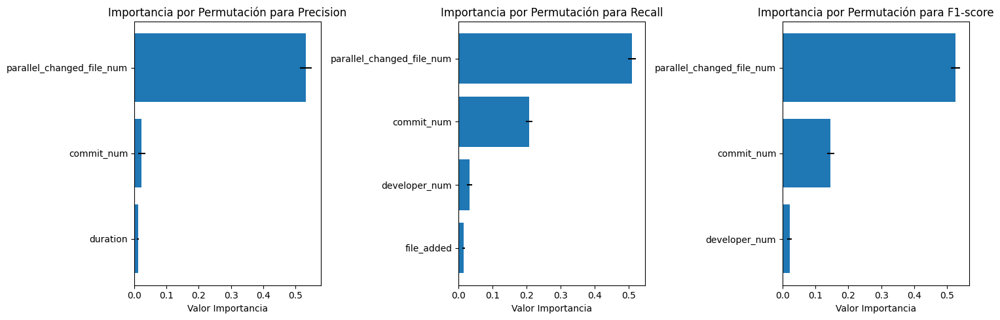

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_gb, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_gb = {}

permu_score = permutation_importance(modelo_gb, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_gb[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_gb['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.532560,0.018867
1,commit_num,0.023194,0.010434
2,duration,0.011599,0.003469


In [ ]:
results_global_gb['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.510245,0.012166
1,commit_num,0.207875,0.010274
3,developer_num,0.032645,0.007756
2,file_added,0.015826,0.004278


In [ ]:
results_global_gb['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.525535,0.014747
1,commit_num,0.146059,0.010317
2,developer_num,0.021297,0.007035


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_gb, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 18689 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 18689 values
  -> model_class       : sklearn.ensemble._gb.GradientBoostingClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x79995e3f7d00> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.000426, mean = 0.0817, max = 0.992
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.872, mean = -2.77e-06, max = 0.984
  -> model_info        : package sklearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

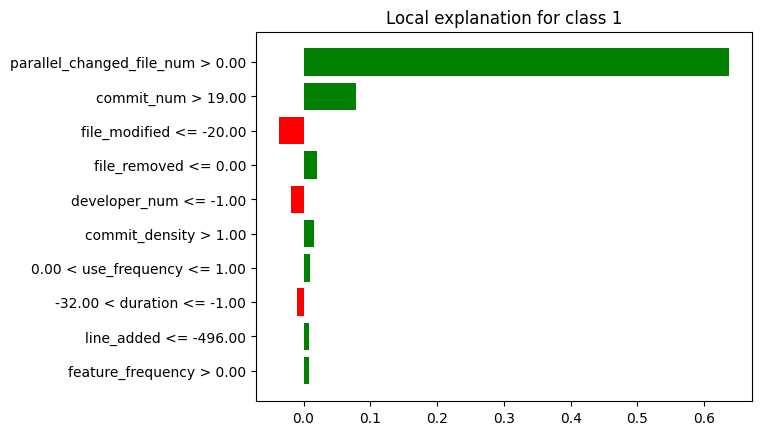

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3             commit_density        4  Positivo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3              file_modified        4  Negativo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3               file_removed        4  Positivo
4              developer_num        5  Negativo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'file_added', 'commit_density', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'file_added']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_removed', 'developer_num']
['commit_num', 'commit_density', 'line_removed', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1             commit_density         4  Positivo       -         -       -   
2               line_removed         5  Negativo       -         -       -   
3              developer_num         -         -       3  Negativo       5   
4              file_modified         -         -       4  Negativo       3   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6                 file_added         3  Positivo       5  Positivo       -   
7               file_removed         -         -       -         -       4   

             
      Signo  
0  Positivo  
1         -  
2         -  
3  Negativo  
4  Negativo  
5  Positivo  
6         -  
7  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "file_added", "commit_density", "line_removed", "developer_num", "file_modified", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
file_added                        3  Positivo       5  Positivo       -   
commit_density                    4  Positivo       -         -       -   
line_removed                      5  Negativo       -         -       -   
developer_num                     -         -       3  Negativo       5   
file_modified                     -         -       4  Negativo       3   
file_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
file_added                        -  
commit_density                    -  
line_removed                      -  
developer_num              Negativo  
file_modified              Negativo  
file_removed               Positivo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

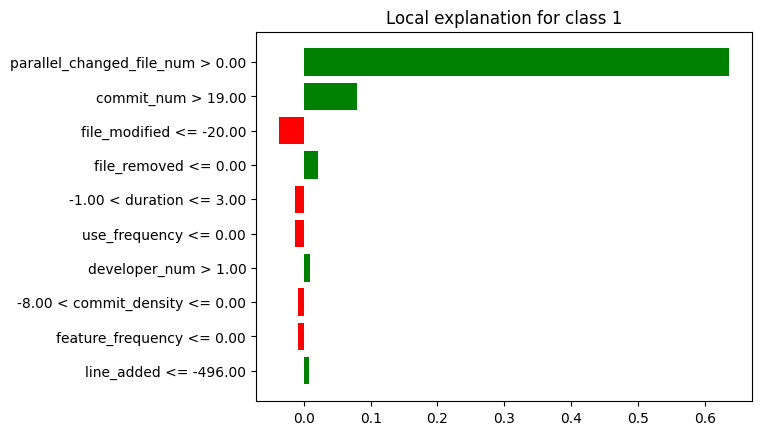

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)
lime_vp_df_mediana.at[4, 'Variable'] = 'duration'

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3               file_removed        4  Negativo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3                 file_added        4  Positivo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3               file_removed        4  Positivo
4                   duration        5  Negativo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_removed', 'file_added']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_added', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_removed', 'duration']
['commit_num', 'duration', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1                   duration         -         -       -         -       5   
2              developer_num         -         -       5  Positivo       -   
3  parallel_changed_file_num         1  Positivo       1  Positivo       1   
4              file_modified         3  Negativo       3  Negativo       3   
5                 file_added         5  Positivo       4  Positivo       -   
6               file_removed         4  Negativo       -         -       4   

             
      Signo  
0  Positivo  
1  Negativo  
2         -  
3  Positivo  
4  Negativo  
5         -  
6  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "file_modified", "file_removed", "file_added", "developer_num", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
file_modified                     3  Negativo       3  Negativo       3   
file_removed                      4  Negativo       -         -       4   
file_added                        5  Positivo       4  Positivo       -   
developer_num                     -         -       5  Positivo       -   
duration                          -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
file_modified              Negativo  
file_removed               Positivo  
file_added                        -  
developer_num                     -  
duration                   Negativo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

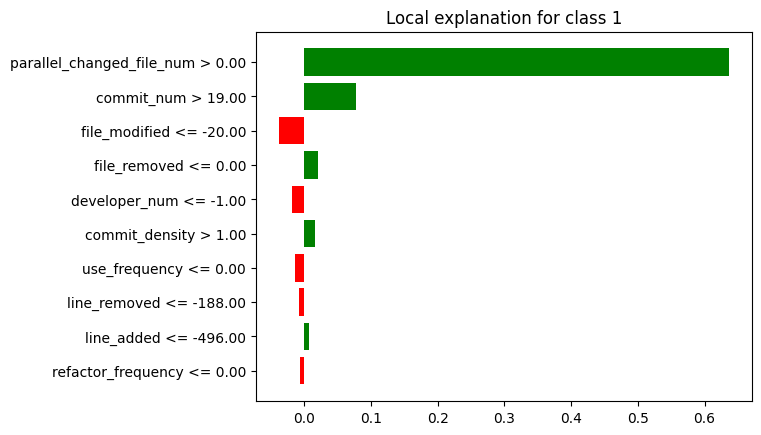

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2              file_modified        3  Negativo
3                 commit_num        4  Positivo
4             commit_density        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3              file_modified        4  Negativo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3               file_removed        4  Positivo
4              developer_num        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'file_modified', 'commit_num', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_modified', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_removed', 'developer_num']
['commit_num', 'commit_density', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         4  Positivo       3  Positivo       2   
1             commit_density         5  Positivo       -         -       -   
2              developer_num         2  Negativo       2  Negativo       5   
3  parallel_changed_file_num         1  Positivo       1  Positivo       1   
4              file_modified         3  Negativo       4  Negativo       3   
5               file_removed         -         -       5  Positivo       4   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3  Positivo  
4  Negativo  
5  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_modified", "commit_num", "commit_density", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       5   
file_modified                     3  Negativo       4  Negativo       3   
commit_num                        4  Positivo       3  Positivo       2   
commit_density                    5  Positivo       -         -       -   
file_removed                      -         -       5  Positivo       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
file_modified              Negativo  
commit_num                 Positivo  
commit_density                    -  
file_removed               Positivo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 3), ('commit_density', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 3), ('file_removed', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_modified', 3), ('commit_num', 4), ('commit_density', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 5), ('developer_num', 3), ('file_modified', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 3), ('file_added', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_modified', 4), ('commit_num', 3), ('file_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 5), ('file_modified', 3), ('file_removed', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 3), ('file_removed', 4), ('duration', 5), ('parallel_changed_file_num', 

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        4.0      1           5.0      1   
file_added                          4.0      2           4.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       3.0      2      3.666667      3   
developer_num                       2.0      1      3.333333      3   
duration                              -      -             -      -   
line_removed                        5.0      1             -      -   
commit_density                      4.5      2             -      -   
commit_num                     2.666667      3      2.333333      3   

                                   Lime         
                          Ranking Medio Conteo  
file_removed                        4.0      3  
file_added                            -      -  
parallel_changed_file_num           1.0      3  
file_modified                       3.0      3  
developer_num                       5.0      2  
duration                            5.0      1  
line_removed                          -      -  
commit_density                        -      -  
commit_num                          2.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_vp[("General", "Ranking")] = df_resumen_gb_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_vp[("General", "Conteo Total")] = df_resumen_gb_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        4.0      1           5.0      1   
file_added                          4.0      2           4.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       3.0      2      3.666667      3   
developer_num                       2.0      1      3.333333      3   
duration                              -      -             -      -   
line_removed                        5.0      1             -      -   
commit_density                      4.5      2             -      -   
commit_num                     2.666667      3      2.333333      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_removed                        4.0      3  4.333333            5  
file_added                            -      -  4.250000            4  
parallel_changed_file_num           1.0      3  1.000000            9  
file_modified                       3.0      3  3.222222            8  
developer_num                       5.0      2  3.444444            6  
duration                            5.0      1  5.000000            1  
line_removed                          -      -  5.000000            1  
commit_density                        -      -  4.500000            2  
commit_num                          2.0      3  2.333333            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_vp[("General", "Peso Rango")] = 1 - ((df_resumen_gb_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_vp[("General", "Peso Conteo")] = df_resumen_gb_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_vp[("General", "Puntaje")] = df_resumen_gb_vp[("General", "Peso Rango")] + df_resumen_gb_vp[("General", "Peso Conteo")]
df_resumen_gb_vp[("General", "Ranking")] = df_resumen_gb_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        4.0      1           5.0      1   
file_added                          4.0      2           4.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       3.0      2      3.666667      3   
developer_num                       2.0      1      3.333333      3   
duration                              -      -             -      -   
line_removed                        5.0      1             -      -   
commit_density                      4.5      2             -      -   
commit_num                     2.666667      3      2.333333      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_removed                        4.0      3     5.0            5  
file_added                            -      -     5.0            4  
parallel_changed_file_num           1.0      3     1.0            9  
file_modified                       3.0      3     3.0            8  
developer_num                       5.0      2     4.0            6  
duration                            5.0      1     8.0            1  
line_removed                          -      -     8.0            1  
commit_density                        -      -     7.0            2  
commit_num                          2.0      3     2.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_vp = df_resumen_gb_vp[new_columns]

In [ ]:
df_resumen_gb_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_vp[(tech, "Ranking Medio")] = df_resumen_gb_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.67      3   
file_modified                 3.0            8          3.00      2   
developer_num                 4.0            6          2.00      1   
file_removed                  5.0            5          4.00      1   
file_added                    5.0            4          4.00      2   
commit_density                7.0            2          4.50      2   
duration                      8.0            1             -      -   
line_removed                  8.0            1          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.33      3          2.00      3  
file_modified                      3.67      3          3.00      3  
developer_num                      3.33      3          5.00      2  
file_removed                       5.00      1          4.00      3  
file_added                         4.50      2             -      -  
commit_density                        -      -             -      -  
duration                              -      -          5.00      1  
line_removed                          -      -             -      -

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

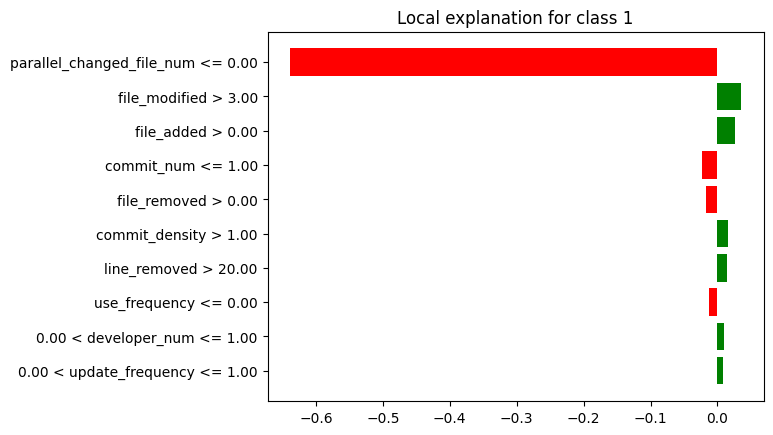

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              fix_frequency        2  Negativo
2                 line_added        3  Positivo
3                 commit_num        4  Negativo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2              fix_frequency        3  Negativo
3                 commit_num        4  Negativo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              file_modified        2  Positivo
2                 file_added        3  Positivo
3                 commit_num        4  Negativo
4               file_removed        5  Negativo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'fix_frequency', 'line_added', 'commit_num', 'line_removed']
['parallel_changed_file_num', 'developer_num', 'fix_frequency', 'commit_num', 'line_removed']
['parallel_changed_file_num', 'file_modified', 'file_added', 'commit_num', 'file_removed']
['commit_num', 'fix_frequency', 'line_removed', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         4  Negativo       4  Negativo       4   
1              fix_frequency         2  Negativo       3  Negativo       -   
2               line_removed         5  Positivo       5  Positivo       -   
3              developer_num         -         -       2  Positivo       -   
4              file_modified         -         -       -         -       2   
5  parallel_changed_file_num         1  Negativo       1  Negativo       1   
6                 line_added         3  Positivo       -         -       -   
7                 file_added         -         -       -         -       3   
8               file_removed         -         -       -         -       5   

             
      Signo  
0  Negativo  
1         -  
2         -  
3         -  
4  Positivo  
5  Negativo  
6         -  
7  Positivo  
8  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "fix_frequency", "line_added", "commit_num", "line_removed", "developer_num", "file_modified", "file_added", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
fix_frequency                     2  Negativo       3  Negativo       -   
line_added                        3  Positivo       -         -       -   
commit_num                        4  Negativo       4  Negativo       4   
line_removed                      5  Positivo       5  Positivo       -   
developer_num                     -         -       2  Positivo       -   
file_modified                     -         -       -         -       2   
file_added                        -         -       -         -       3   
file_removed                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
fix_frequency                     -  
line_added                        -  
commit_num                 Negativo  
line_removed                      -  
developer_num                     -  
file_modified              Positivo  
file_added                 Positivo  
file_removed               Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

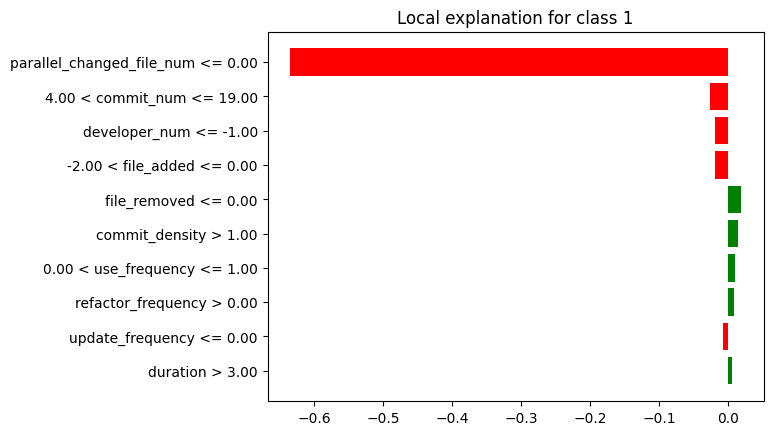

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[1, 'Variable'] = 'commit_num'
lime_vn_df_mediana.at[3, 'Variable'] = 'file_added'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0                 commit_num        1  Negativo
1  parallel_changed_file_num        2  Negativo
2                 file_added        3  Negativo
3              developer_num        4  Negativo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Negativo
3                 line_added        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Negativo
3                 file_added        4  Negativo
4               file_removed        5  Positivo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['commit_num', 'parallel_changed_file_num', 'file_added', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'file_removed']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         1  Negativo       2  Negativo       2   
1              developer_num         4  Negativo       3  Negativo       3   
2  parallel_changed_file_num         2  Negativo       1  Negativo       1   
3                 line_added         -         -       4  Positivo       -   
4                 file_added         3  Negativo       5  Negativo       4   
5               file_removed         5  Negativo       -         -       5   

             
      Signo  
0  Negativo  
1  Negativo  
2  Negativo  
3         -  
4  Negativo  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["commit_num", "parallel_changed_file_num", "file_added", "developer_num", "file_removed", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
commit_num                        1  Negativo       2  Negativo       2   
parallel_changed_file_num         2  Negativo       1  Negativo       1   
file_added                        3  Negativo       5  Negativo       4   
developer_num                     4  Negativo       3  Negativo       3   
file_removed                      5  Negativo       -         -       5   
line_added                        -         -       4  Positivo       -   

                                     
                              Signo  
Variable                             
commit_num                 Negativo  
parallel_changed_file_num  Negativo  
file_added                 Negativo  
developer_num              Negativo  
file_removed               Positivo  
line_added                        -

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

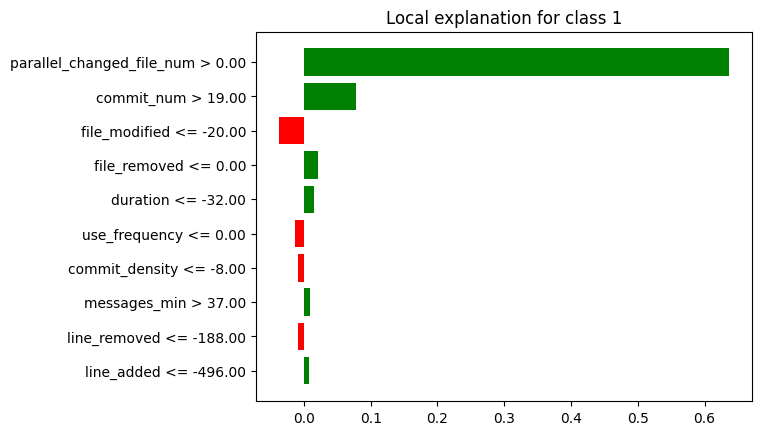

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Negativo
2                 file_added        3  Positivo
3                 commit_num        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Negativo
2                 file_added        3  Positivo
3              developer_num        4  Positivo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3               file_removed        4  Positivo
4                   duration        5  Positivo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'file_removed', 'file_added', 'commit_num', 'line_added']
['parallel_changed_file_num', 'line_removed', 'file_added', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_removed', 'duration']
['commit_num', 'line_removed', 'duration', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         4  Positivo       -         -       2   
1               line_removed         -         -       2  Negativo       -   
2                   duration         -         -       -         -       5   
3              developer_num         -         -       4  Positivo       -   
4              file_modified         -         -       -         -       3   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6                 line_added         5  Negativo       -         -       -   
7                 file_added         3  Positivo       3  Positivo       -   
8               file_removed         2  Negativo       5  Negativo       4   

             
      Signo  
0  Positivo  
1         -  
2  Positivo  
3         -  
4  Negativo  
5  Positivo  
6         -  
7         -  
8  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "file_added","commit_num", "line_added", "line_removed", "developer_num", "file_modified", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      2  Negativo       5  Negativo       4   
file_added                        3  Positivo       3  Positivo       -   
commit_num                        4  Positivo       -         -       2   
line_added                        5  Negativo       -         -       -   
line_removed                      -         -       2  Negativo       -   
developer_num                     -         -       4  Positivo       -   
file_modified                     -         -       -         -       3   
duration                          -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Positivo  
file_added                        -  
commit_num                 Positivo  
line_added                        -  
line_removed                      -  
developer_num                     -  
file_modified              Negativo  
duration                   Positivo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('fix_frequency', 2), ('line_added', 3), ('commit_num', 4), ('line_removed', 5), ('commit_num', 1), ('parallel_changed_file_num', 2), ('file_added', 3), ('developer_num', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('file_added', 3), ('commit_num', 4), ('line_added', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('fix_frequency', 3), ('commit_num', 4), ('line_removed', 5), ('developer_num', 2), ('commit_num', 2), ('parallel_changed_file_num', 1), ('file_added', 5), ('developer_num', 3), ('line_added', 4), ('parallel_changed_file_num', 1), ('file_removed', 5), ('file_added', 3), ('line_removed', 2), ('developer_num', 4)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 4), ('file_modified', 2), ('file_added', 3), ('file_removed', 5), ('commit_num', 2), ('parallel_changed_file_num', 1), ('file_added', 4), ('developer_num', 3), ('file_removed', 5), ('parallel_changed_file_num', 1), ('file_r

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        3.5      2           5.0      1   
file_added                          3.0      2           4.0      2   
line_added                          4.0      2           4.0      1   
parallel_changed_file_num      1.333333      3           1.0      3   
file_modified                         -      -             -      -   
developer_num                       4.0      1           3.0      3   
duration                              -      -             -      -   
line_removed                        5.0      1           3.5      2   
fix_frequency                       2.0      1           3.0      1   
commit_num                          3.0      3           3.0      2   

                                   Lime         
                          Ranking Medio Conteo  
file_removed                   4.666667      3  
file_added                          3.5      2  
line_added                            -      -  
parallel_changed_file_num           1.0      3  
file_modified                       2.5      2  
developer_num                       3.0      1  
duration                            5.0      1  
line_removed                          -      -  
fix_frequency                         -      -  
commit_num                     2.666667      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_vn[("General", "Ranking")] = df_resumen_gb_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_vn[("General", "Conteo Total")] = df_resumen_gb_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        3.5      2           5.0      1   
file_added                          3.0      2           4.0      2   
line_added                          4.0      2           4.0      1   
parallel_changed_file_num      1.333333      3           1.0      3   
file_modified                         -      -             -      -   
developer_num                       4.0      1           3.0      3   
duration                              -      -             -      -   
line_removed                        5.0      1           3.5      2   
fix_frequency                       2.0      1           3.0      1   
commit_num                          3.0      3           3.0      2   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_removed                   4.666667      3  4.388889            6  
file_added                          3.5      2  3.500000            6  
line_added                            -      -  4.000000            3  
parallel_changed_file_num           1.0      3  1.111111            9  
file_modified                       2.5      2  2.500000            2  
developer_num                       3.0      1  3.333333            5  
duration                            5.0      1  5.000000            1  
line_removed                          -      -  4.250000            3  
fix_frequency                         -      -  2.500000            2  
commit_num                     2.666667      3  2.888889            8

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_vn[("General", "Peso Rango")] = 1 - ((df_resumen_gb_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_vn[("General", "Peso Conteo")] = df_resumen_gb_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_vn[("General", "Puntaje")] = df_resumen_gb_vn[("General", "Peso Rango")] + df_resumen_gb_vn[("General", "Peso Conteo")]
df_resumen_gb_vn[("General", "Ranking")] = df_resumen_gb_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        3.5      2           5.0      1   
file_added                          3.0      2           4.0      2   
line_added                          4.0      2           4.0      1   
parallel_changed_file_num      1.333333      3           1.0      3   
file_modified                         -      -             -      -   
developer_num                       4.0      1           3.0      3   
duration                              -      -             -      -   
line_removed                        5.0      1           3.5      2   
fix_frequency                       2.0      1           3.0      1   
commit_num                          3.0      3           3.0      2   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_removed                   4.666667      3     7.0            6  
file_added                          3.5      2     3.0            6  
line_added                            -      -     8.0            3  
parallel_changed_file_num           1.0      3     1.0            9  
file_modified                       2.5      2     5.0            2  
developer_num                       3.0      1     4.0            5  
duration                            5.0      1    10.0            1  
line_removed                          -      -     9.0            3  
fix_frequency                         -      -     5.0            2  
commit_num                     2.666667      3     2.0            8

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_vn = df_resumen_gb_vn[new_columns]

In [ ]:
df_resumen_gb_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_vn[(tech, "Ranking Medio")] = df_resumen_gb_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.33      3   
commit_num                    2.0            8          3.00      3   
file_added                    3.0            6          3.00      2   
developer_num                 4.0            5          4.00      1   
file_modified                 5.0            2             -      -   
fix_frequency                 5.0            2          2.00      1   
file_removed                  7.0            6          3.50      2   
line_added                    8.0            3          4.00      2   
line_removed                  9.0            3          5.00      1   
duration                     10.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         3.00      2          2.67      3  
file_added                         4.00      2          3.50      2  
developer_num                      3.00      3          3.00      1  
file_modified                         -      -          2.50      2  
fix_frequency                      3.00      1             -      -  
file_removed                       5.00      1          4.67      3  
line_added                         4.00      1             -      -  
line_removed                       3.50      2             -      -  
duration                              -      -          5.00      1

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

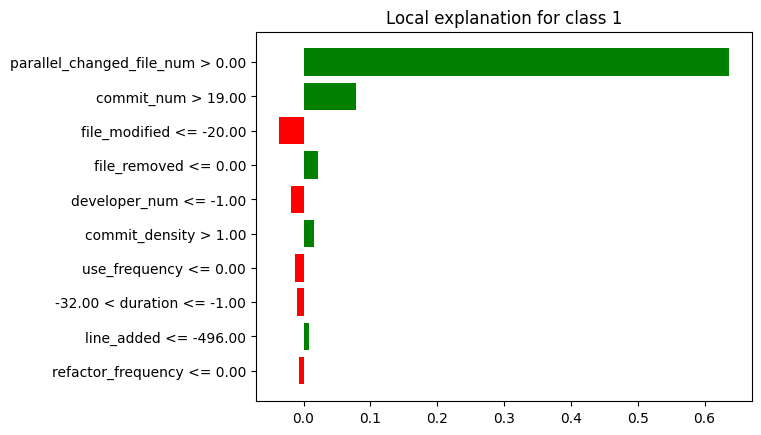

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0                 commit_num        1  Positivo
1  parallel_changed_file_num        2  Positivo
2                 file_added        3  Positivo
3               file_removed        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3               line_removed        4  Positivo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3               file_removed        4  Positivo
4              developer_num        5  Negativo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['commit_num', 'parallel_changed_file_num', 'file_added', 'file_removed', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'file_added', 'line_removed', 'line_added']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_removed', 'developer_num']
['commit_num', 'line_removed', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         1  Positivo       2  Positivo       2   
1               line_removed         -         -       4  Positivo       -   
2              developer_num         5  Positivo       -         -       5   
3              file_modified         -         -       -         -       3   
4  parallel_changed_file_num         2  Positivo       1  Positivo       1   
5                 line_added         -         -       5  Positivo       -   
6                 file_added         3  Positivo       3  Positivo       -   
7               file_removed         4  Negativo       -         -       4   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3  Negativo  
4  Positivo  
5         -  
6         -  
7  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["commit_num", "parallel_changed_file_num", "file_added","file_removed", "developer_num", "line_removed", "line_added", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
commit_num                        1  Positivo       2  Positivo       2   
parallel_changed_file_num         2  Positivo       1  Positivo       1   
file_added                        3  Positivo       3  Positivo       -   
file_removed                      4  Negativo       -         -       4   
developer_num                     5  Positivo       -         -       5   
line_removed                      -         -       4  Positivo       -   
line_added                        -         -       5  Positivo       -   
file_modified                     -         -       -         -       3   

                                     
                              Signo  
Variable                             
commit_num                 Positivo  
parallel_changed_file_num  Positivo  
file_added                        -  
file_removed               Positivo  
developer_num              Negativo  
line_removed                      -  
line_added                        -  
file_modified              Negativo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

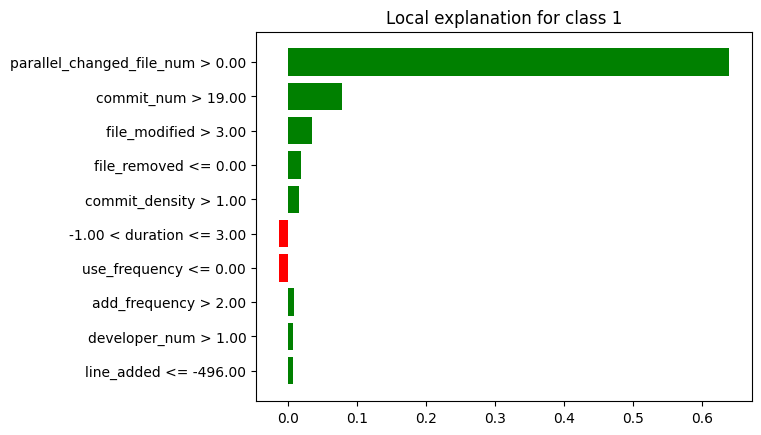

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2             commit_density        3  Positivo
3                 commit_num        4  Positivo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 file_added        3  Positivo
3                 commit_num        4  Positivo
4             commit_density        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Positivo
3               file_removed        4  Positivo
4             commit_density        5  Positivo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_density', 'commit_num', 'line_added']
['parallel_changed_file_num', 'developer_num', 'file_added', 'commit_num', 'commit_density']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_removed', 'commit_density']
['commit_num', 'commit_density', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         4  Positivo       4  Positivo       2   
1             commit_density         3  Positivo       5  Positivo       5   
2              developer_num         2  Positivo       2  Positivo       -   
3              file_modified         -         -       -         -       3   
4  parallel_changed_file_num         1  Positivo       1  Positivo       1   
5                 line_added         5  Positivo       -         -       -   
6                 file_added         -         -       3  Positivo       -   
7               file_removed         -         -       -         -       4   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Positivo  
4  Positivo  
5         -  
6         -  
7  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_density", "commit_num", "line_added", "file_added", "file_modified", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       -   
commit_density                    3  Positivo       5  Positivo       5   
commit_num                        4  Positivo       4  Positivo       2   
line_added                        5  Positivo       -         -       -   
file_added                        -         -       3  Positivo       -   
file_modified                     -         -       -         -       3   
file_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num                     -  
commit_density             Positivo  
commit_num                 Positivo  
line_added                        -  
file_added                        -  
file_modified              Positivo  
file_removed               Positivo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

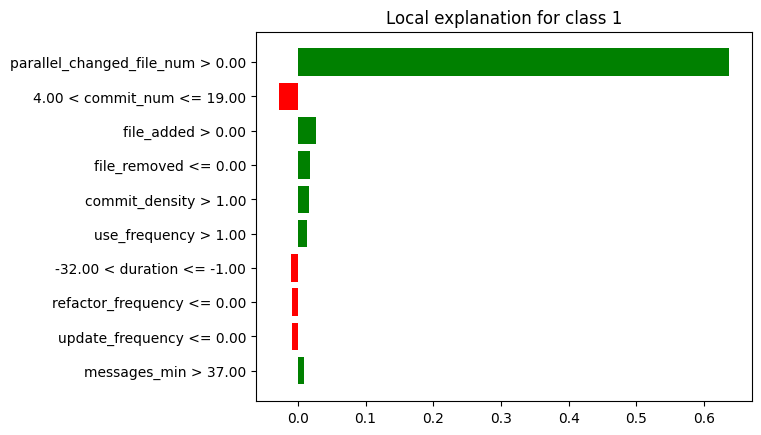

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)
lime_fp_df_min.at[1, 'Variable'] = 'commit_num'

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3             commit_density        4  Positivo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3             commit_density        4  Positivo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Negativo
2                 file_added        3  Positivo
3               file_removed        4  Positivo
4             commit_density        5  Positivo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'developer_num', 'commit_density', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'commit_density', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed', 'commit_density']
['commit_num', 'commit_density', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Negativo       2  Negativo       2   
1             commit_density         4  Positivo       4  Positivo       5   
2              developer_num         3  Positivo       3  Positivo       -   
3  parallel_changed_file_num         1  Positivo       1  Positivo       1   
4              file_modified         5  Negativo       5  Negativo       -   
5                 file_added         -         -       -         -       3   
6               file_removed         -         -       -         -       4   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Positivo  
4         -  
5  Positivo  
6  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "commit_density", "file_modified", "file_added", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Negativo       2  Negativo       2   
developer_num                     3  Positivo       3  Positivo       -   
commit_density                    4  Positivo       4  Positivo       5   
file_modified                     5  Negativo       5  Negativo       -   
file_added                        -         -       -         -       3   
file_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Negativo  
developer_num                     -  
commit_density             Positivo  
file_modified                     -  
file_added                 Positivo  
file_removed               Positivo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('commit_num', 1), ('parallel_changed_file_num', 2), ('file_added', 3), ('file_removed', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_density', 3), ('commit_num', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('commit_density', 4), ('file_modified', 5)], 'Shapley': [('commit_num', 2), ('parallel_changed_file_num', 1), ('file_added', 3), ('line_removed', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_density', 5), ('commit_num', 4), ('file_added', 3), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('commit_density', 4), ('file_modified', 5)], 'Lime': [('commit_num', 2), ('parallel_changed_file_num', 1), ('file_removed', 4), ('developer_num', 5), ('file_modified', 3), ('parallel_changed_file_num', 1), ('commit_density', 5), ('commit_num', 2), ('file_modified', 3), ('file_removed', 4), ('parallel_changed_file_

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        4.0      1             -      -   
file_added                          3.0      1           3.0      2   
line_added                          5.0      1           5.0      1   
parallel_changed_file_num      1.333333      3           1.0      3   
file_modified                       5.0      1           5.0      1   
developer_num                  3.333333      3           2.5      2   
line_removed                          -      -           4.0      1   
commit_density                      3.5      2           4.5      2   
commit_num                     2.333333      3      2.666667      3   

                                   Lime         
                          Ranking Medio Conteo  
file_removed                        4.0      3  
file_added                          3.0      1  
line_added                            -      -  
parallel_changed_file_num           1.0      3  
file_modified                       3.0      2  
developer_num                       5.0      1  
line_removed                          -      -  
commit_density                      5.0      2  
commit_num                          2.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_fp[("General", "Ranking")] = df_resumen_gb_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_fp[("General", "Conteo Total")] = df_resumen_gb_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        4.0      1             -      -   
file_added                          3.0      1           3.0      2   
line_added                          5.0      1           5.0      1   
parallel_changed_file_num      1.333333      3           1.0      3   
file_modified                       5.0      1           5.0      1   
developer_num                  3.333333      3           2.5      2   
line_removed                          -      -           4.0      1   
commit_density                      3.5      2           4.5      2   
commit_num                     2.333333      3      2.666667      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_removed                        4.0      3  4.000000            4  
file_added                          3.0      1  3.000000            4  
line_added                            -      -  5.000000            2  
parallel_changed_file_num           1.0      3  1.111111            9  
file_modified                       3.0      2  4.333333            4  
developer_num                       5.0      1  3.611111            6  
line_removed                          -      -  4.000000            1  
commit_density                      5.0      2  4.333333            6  
commit_num                          2.0      3  2.333333            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_fp[("General", "Peso Rango")] = 1 - ((df_resumen_gb_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_fp[("General", "Peso Conteo")] = df_resumen_gb_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_fp[("General", "Puntaje")] = df_resumen_gb_fp[("General", "Peso Rango")] + df_resumen_gb_fp[("General", "Peso Conteo")]
df_resumen_gb_fp[("General", "Ranking")] = df_resumen_gb_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        4.0      1             -      -   
file_added                          3.0      1           3.0      2   
line_added                          5.0      1           5.0      1   
parallel_changed_file_num      1.333333      3           1.0      3   
file_modified                       5.0      1           5.0      1   
developer_num                  3.333333      3           2.5      2   
line_removed                          -      -           4.0      1   
commit_density                      3.5      2           4.5      2   
commit_num                     2.333333      3      2.666667      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_removed                        4.0      3     6.0            4  
file_added                          3.0      1     4.0            4  
line_added                            -      -     9.0            2  
parallel_changed_file_num           1.0      3     1.0            9  
file_modified                       3.0      2     7.0            4  
developer_num                       5.0      1     3.0            6  
line_removed                          -      -     8.0            1  
commit_density                      5.0      2     5.0            6  
commit_num                          2.0      3     2.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_fp = df_resumen_gb_fp[new_columns]

In [ ]:
df_resumen_gb_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_fp[(tech, "Ranking Medio")] = df_resumen_gb_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.33      3   
commit_num                    2.0            9          2.33      3   
developer_num                 3.0            6          3.33      3   
file_added                    4.0            4          3.00      1   
commit_density                5.0            6          3.50      2   
file_removed                  6.0            4          4.00      1   
file_modified                 7.0            4          5.00      1   
line_removed                  8.0            1             -      -   
line_added                    9.0            2          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.67      3          2.00      3  
developer_num                      2.50      2          5.00      1  
file_added                         3.00      2          3.00      1  
commit_density                     4.50      2          5.00      2  
file_removed                          -      -          4.00      3  
file_modified                      5.00      1          3.00      2  
line_removed                       4.00      1             -      -  
line_added                         5.00      1             -      -

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

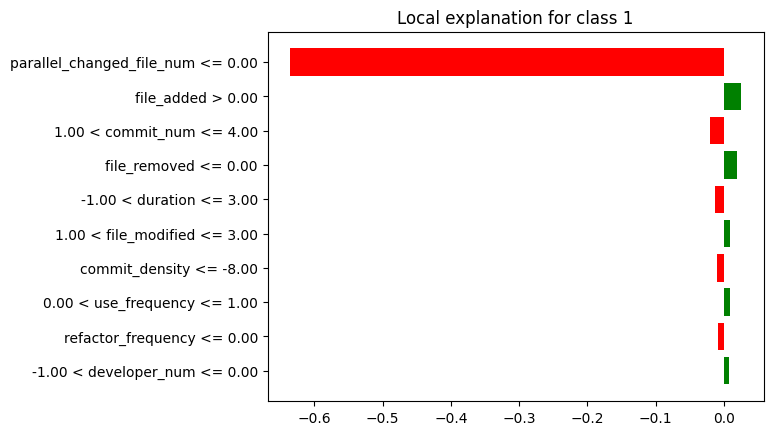

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[2, 'Variable'] = 'commit_num'
lime_fn_df_max.at[4, 'Variable'] = 'duration'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                 file_added        4  Negativo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3              file_modified        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 file_added        2  Positivo
2                 commit_num        3  Negativo
3               file_removed        4  Positivo
4                   duration        5  Negativo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'file_added']
['parallel_changed_file_num', 'file_added', 'commit_num', 'file_removed', 'duration']
['commit_num', 'duration', 'developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Negativo       2  Negativo       3   
1                   duration         -         -       -         -       5   
2              developer_num         3  Positivo       3  Positivo       -   
3              file_modified         -         -       4  Positivo       -   
4  parallel_changed_file_num         1  Negativo       1  Negativo       1   
5                 line_added         5  Positivo       -         -       -   
6                 file_added         4  Negativo       5  Negativo       2   
7               file_removed         -         -       -         -       4   

             
      Signo  
0  Negativo  
1  Negativo  
2         -  
3         -  
4  Negativo  
5         -  
6  Positivo  
7  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_added", "line_added", "file_modified", "file_removed", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       3   
developer_num                     3  Positivo       3  Positivo       -   
file_added                        4  Negativo       5  Negativo       2   
line_added                        5  Positivo       -         -       -   
file_modified                     -         -       4  Positivo       -   
file_removed                      -         -       -         -       4   
duration                          -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num                     -  
file_added                 Positivo  
line_added                        -  
file_modified                     -  
file_removed               Positivo  
duration                   Negativo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

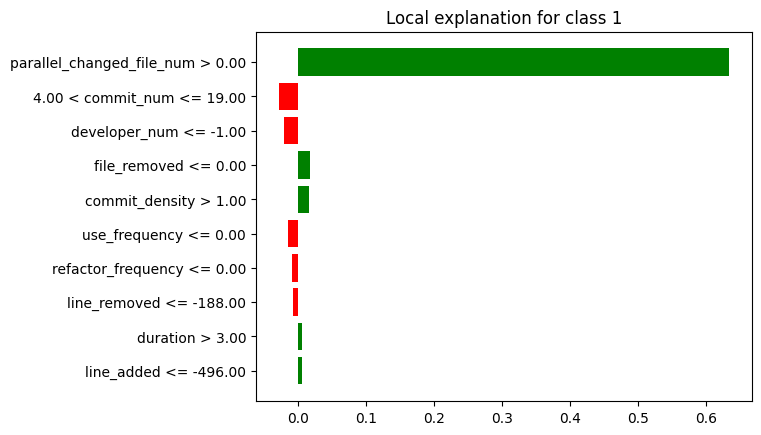

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[1, 'Variable'] = 'commit_num'

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2              file_modified        3  Negativo
3             commit_density        4  Positivo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2              file_modified        3  Negativo
3                 commit_num        4  Negativo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Negativo
2              developer_num        3  Negativo
3               file_removed        4  Positivo
4             commit_density        5  Positivo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'file_modified', 'commit_density', 'line_added']
['parallel_changed_file_num', 'developer_num', 'file_modified', 'commit_num', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'commit_density']
['commit_num', 'commit_density', 'line_removed', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         -         -       4  Negativo       2   
1             commit_density         4  Positivo       -         -       5   
2               line_removed         -         -       5  Negativo       -   
3              developer_num         2  Negativo       2  Negativo       3   
4  parallel_changed_file_num         1  Positivo       1  Positivo       1   
5              file_modified         3  Negativo       3  Negativo       -   
6                 line_added         5  Positivo       -         -       -   
7               file_removed         -         -       -         -       4   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Negativo  
4  Positivo  
5         -  
6         -  
7  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_modified", "commit_density", "line_added", "commit_num", "line_removed", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       3   
file_modified                     3  Negativo       3  Negativo       -   
commit_density                    4  Positivo       -         -       5   
line_added                        5  Positivo       -         -       -   
commit_num                        -         -       4  Negativo       2   
line_removed                      -         -       5  Negativo       -   
file_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
file_modified                     -  
commit_density             Positivo  
line_added                        -  
commit_num                 Negativo  
line_removed                      -  
file_removed               Positivo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

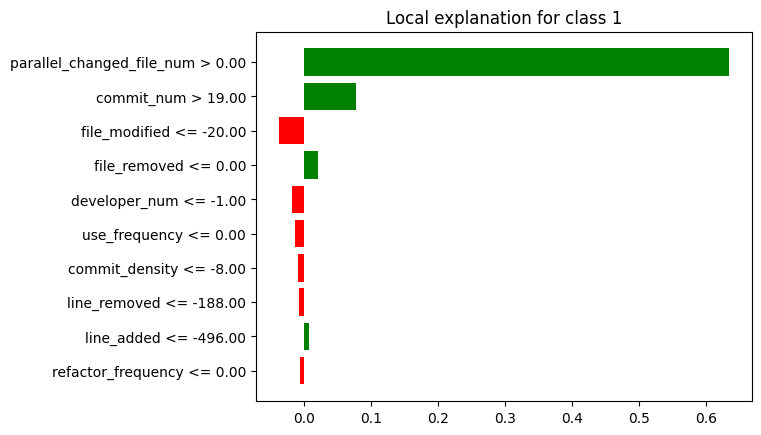

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Negativo
2              developer_num        3  Negativo
3          improve_frequency        4  Negativo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2              file_modified        3  Negativo
3                 line_added        4  Negativo
4          improve_frequency        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3               file_removed        4  Positivo
4              developer_num        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'developer_num', 'improve_frequency', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'file_modified', 'line_added', 'improve_frequency']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_removed', 'developer_num']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'improve_frequency', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Negativo       -         -       2   
1              developer_num         3  Negativo       2  Negativo       5   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3              file_modified         5  Negativo       3  Negativo       3   
4                 line_added         -         -       4  Negativo       -   
5          improve_frequency         4  Negativo       5  Negativo       -   
6               file_removed         -         -       -         -       4   

             
      Signo  
0  Positivo  
1  Negativo  
2  Positivo  
3  Negativo  
4         -  
5         -  
6  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "improve_frequency", "file_modified", "line_added", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Negativo       -         -       2   
developer_num                     3  Negativo       2  Negativo       5   
improve_frequency                 4  Negativo       5  Negativo       -   
file_modified                     5  Negativo       3  Negativo       3   
line_added                        -         -       4  Negativo       -   
file_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Negativo  
improve_frequency                 -  
file_modified              Negativo  
line_added                        -  
file_removed               Positivo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_modified', 3), ('commit_density', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('improve_frequency', 4), ('file_modified', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 5), ('file_modified', 4), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_modified', 3), ('commit_num', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('improve_frequency', 5), ('file_modified', 3), ('line_added', 4)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 3), ('file_added', 2), ('file_removed', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('developer_num', 3), ('commit_density', 5), ('commit_num', 2), ('file_removed', 4), ('parallel_changed_f

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                          -      -             -      -   
file_added                          4.0      1           5.0      1   
improve_frequency                   4.0      1           5.0      1   
line_added                          5.0      2           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       4.0      2      3.333333      3   
developer_num                  2.666667      3      2.333333      3   
duration                              -      -             -      -   
line_removed                          -      -           5.0      1   
commit_density                      4.0      1             -      -   
commit_num                          2.0      2           3.0      2   

                                   Lime         
                          Ranking Medio Conteo  
file_removed                        4.0      3  
file_added                          2.0      1  
improve_frequency                     -      -  
line_added                            -      -  
parallel_changed_file_num           1.0      3  
file_modified                       3.0      1  
developer_num                       4.0      2  
duration                            5.0      1  
line_removed                          -      -  
commit_density                      5.0      1  
commit_num                     2.333333      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_fn[("General", "Ranking")] = df_resumen_gb_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_fn[("General", "Conteo Total")] = df_resumen_gb_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                          -      -             -      -   
file_added                          4.0      1           5.0      1   
improve_frequency                   4.0      1           5.0      1   
line_added                          5.0      2           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       4.0      2      3.333333      3   
developer_num                  2.666667      3      2.333333      3   
duration                              -      -             -      -   
line_removed                          -      -           5.0      1   
commit_density                      4.0      1             -      -   
commit_num                          2.0      2           3.0      2   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_removed                        4.0      3  4.000000            3  
file_added                          2.0      1  3.666667            3  
improve_frequency                     -      -  4.500000            2  
line_added                            -      -  4.500000            3  
parallel_changed_file_num           1.0      3  1.000000            9  
file_modified                       3.0      1  3.444444            6  
developer_num                       4.0      2  3.000000            8  
duration                            5.0      1  5.000000            1  
line_removed                          -      -  5.000000            1  
commit_density                      5.0      1  4.500000            2  
commit_num                     2.333333      3  2.444444            7

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_fn[("General", "Peso Rango")] = 1 - ((df_resumen_gb_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_fn[("General", "Peso Conteo")] = df_resumen_gb_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_fn[("General", "Puntaje")] = df_resumen_gb_fn[("General", "Peso Rango")] + df_resumen_gb_fn[("General", "Peso Conteo")]
df_resumen_gb_fn[("General", "Ranking")] = df_resumen_gb_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                          -      -             -      -   
file_added                          4.0      1           5.0      1   
improve_frequency                   4.0      1           5.0      1   
line_added                          5.0      2           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       4.0      2      3.333333      3   
developer_num                  2.666667      3      2.333333      3   
duration                              -      -             -      -   
line_removed                          -      -           5.0      1   
commit_density                      4.0      1             -      -   
commit_num                          2.0      2           3.0      2   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_removed                        4.0      3     6.0            3  
file_added                          2.0      1     5.0            3  
improve_frequency                     -      -     8.0            2  
line_added                            -      -     7.0            3  
parallel_changed_file_num           1.0      3     1.0            9  
file_modified                       3.0      1     4.0            6  
developer_num                       4.0      2     3.0            8  
duration                            5.0      1    10.0            1  
line_removed                          -      -    10.0            1  
commit_density                      5.0      1     8.0            2  
commit_num                     2.333333      3     2.0            7

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_fn = df_resumen_gb_fn[new_columns]

In [ ]:
df_resumen_gb_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_fn[(tech, "Ranking Medio")] = df_resumen_gb_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            7          2.00      2   
developer_num                 3.0            8          2.67      3   
file_modified                 4.0            6          4.00      2   
file_added                    5.0            3          4.00      1   
file_removed                  6.0            3             -      -   
line_added                    7.0            3          5.00      2   
improve_frequency             8.0            2          4.00      1   
commit_density                8.0            2          4.00      1   
duration                     10.0            1             -      -   
line_removed                 10.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         3.00      2          2.33      3  
developer_num                      2.33      3          4.00      2  
file_modified                      3.33      3          3.00      1  
file_added                         5.00      1          2.00      1  
file_removed                          -      -          4.00      3  
line_added                         4.00      1             -      -  
improve_frequency                  5.00      1             -      -  
commit_density                        -      -          5.00      1  
duration                              -      -          5.00      1  
line_removed                       5.00      1             -      -

## **AdaBoosting:**

**FEATURE IMPORTANCE**

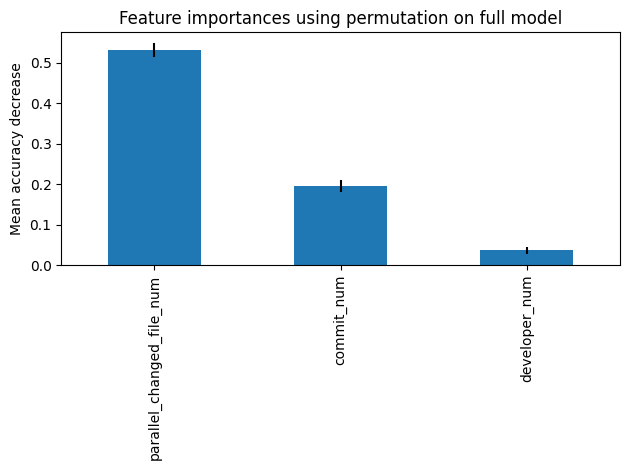

In [ ]:
permu = permutation_importance(modelo_ada, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

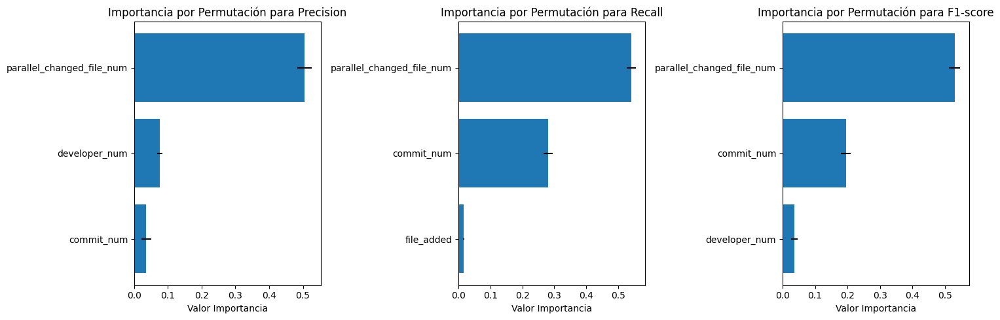

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_ada, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()

In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_ada = {}

permu_score = permutation_importance(modelo_ada, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_ada[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_ada['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.505155,0.021870
2,developer_num,0.075252,0.008157
1,commit_num,0.035444,0.014609


In [ ]:
results_global_ada['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.541972,0.014339
1,commit_num,0.280887,0.015245
2,file_added,0.016131,0.001638


In [ ]:
results_global_ada['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.530729,0.017216
1,commit_num,0.195014,0.015463
2,developer_num,0.036269,0.009458


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_ada, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 18689 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 18689 values
  -> model_class       : sklearn.ensemble._weight_boosting.AdaBoostClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x79995e3f7d00> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.251, mean = 0.354, max = 0.592
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.55, mean = -0.273, max = 0.653
  -> model_info        : package sklearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

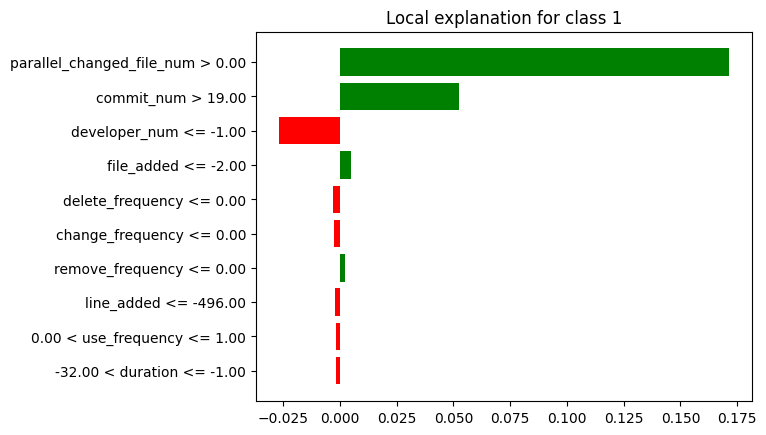

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4           delete_frequency        5  Negativo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'delete_frequency']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'delete_frequency', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1              developer_num         3  Negativo       3  Negativo       3   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3           delete_frequency         -         -       -         -       5   
4                 line_added         5  Negativo       5  Negativo       -   
5                 file_added         4  Positivo       4  Positivo       4   

             
      Signo  
0  Positivo  
1  Negativo  
2  Positivo  
3  Negativo  
4         -  
5  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_added", "line_added", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Negativo       3  Negativo       3   
file_added                        4  Positivo       4  Positivo       4   
line_added                        5  Negativo       5  Negativo       -   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Negativo  
file_added                 Positivo  
line_added                        -  
delete_frequency           Negativo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

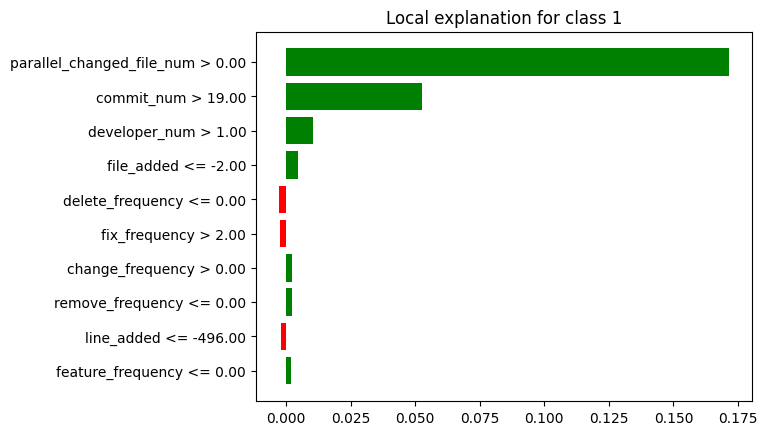

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 file_added        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 file_added        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 file_added        4  Positivo
4           delete_frequency        5  Negativo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'delete_frequency']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'delete_frequency', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1              developer_num         3  Positivo       3  Positivo       3   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3           delete_frequency         -         -       -         -       5   
4                 line_added         5  Negativo       5  Negativo       -   
5                 file_added         4  Positivo       4  Positivo       4   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Negativo  
4         -  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_added", "line_added", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       3   
file_added                        4  Positivo       4  Positivo       4   
line_added                        5  Negativo       5  Negativo       -   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Positivo  
file_added                 Positivo  
line_added                        -  
delete_frequency           Negativo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

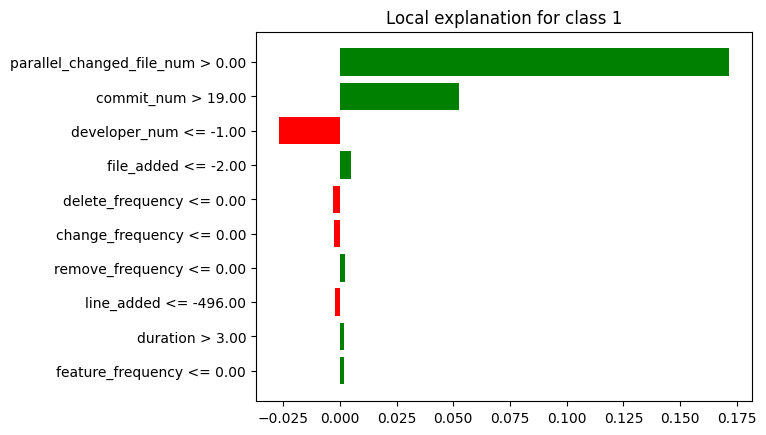

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4           delete_frequency        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'delete_frequency']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'delete_frequency', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1              developer_num         3  Negativo       3  Negativo       3   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3           delete_frequency         -         -       -         -       5   
4                 line_added         5  Negativo       5  Negativo       -   
5                 file_added         4  Positivo       4  Positivo       4   

             
      Signo  
0  Positivo  
1  Negativo  
2  Positivo  
3  Negativo  
4         -  
5  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_added", "line_added", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Negativo       3  Negativo       3   
file_added                        4  Positivo       4  Positivo       4   
line_added                        5  Negativo       5  Negativo       -   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Negativo  
file_added                 Positivo  
line_added                        -  
delete_frequency           Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('line_added', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('line_added', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('delete_frequency', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('delete_frequency', 5), ('parallel_changed_file_num', 1), ('commit_num

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                          4.0      3           4.0      3   
line_added                          5.0      3           5.0      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
developer_num                       3.0      3           3.0      3   
commit_num                          2.0      3           2.0      3   

                                   Lime         
                          Ranking Medio Conteo  
file_added                          4.0      3  
line_added                            -      -  
delete_frequency                    5.0      3  
parallel_changed_file_num           1.0      3  
developer_num                       3.0      3  
commit_num                          2.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_vp[("General", "Ranking")] = df_resumen_ada_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_vp[("General", "Conteo Total")] = df_resumen_ada_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                          4.0      3           4.0      3   
line_added                          5.0      3           5.0      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
developer_num                       3.0      3           3.0      3   
commit_num                          2.0      3           2.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_added                          4.0      3     4.0            9  
line_added                            -      -     5.0            6  
delete_frequency                    5.0      3     5.0            3  
parallel_changed_file_num           1.0      3     1.0            9  
developer_num                       3.0      3     3.0            9  
commit_num                          2.0      3     2.0            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_vp[("General", "Peso Rango")] = 1 - ((df_resumen_ada_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_vp[("General", "Peso Conteo")] = df_resumen_ada_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_vp[("General", "Puntaje")] = df_resumen_ada_vp[("General", "Peso Rango")] + df_resumen_ada_vp[("General", "Peso Conteo")]
df_resumen_ada_vp[("General", "Ranking")] = df_resumen_ada_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                          4.0      3           4.0      3   
line_added                          5.0      3           5.0      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
developer_num                       3.0      3           3.0      3   
commit_num                          2.0      3           2.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_added                          4.0      3     4.0            9  
line_added                            -      -     5.0            6  
delete_frequency                    5.0      3     6.0            3  
parallel_changed_file_num           1.0      3     1.0            9  
developer_num                       3.0      3     3.0            9  
commit_num                          2.0      3     2.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_vp = df_resumen_ada_vp[new_columns]

In [ ]:
df_resumen_ada_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_vp[(tech, "Ranking Medio")] = df_resumen_ada_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.00      3   
developer_num                 3.0            9          3.00      3   
file_added                    4.0            9          4.00      3   
line_added                    5.0            6          5.00      3   
delete_frequency              6.0            3             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.00      3          2.00      3  
developer_num                      3.00      3          3.00      3  
file_added                         4.00      3          4.00      3  
line_added                         5.00      3             -      -  
delete_frequency                      -      -          5.00      3

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

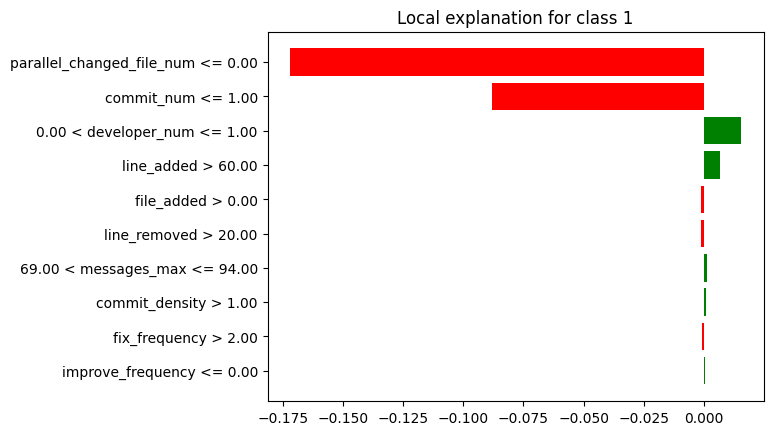

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)
lime_vn_df_max.at[2, 'Variable'] = 'developer_num'

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0                 commit_num        1  Negativo
1  parallel_changed_file_num        2  Negativo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0                 commit_num        1  Negativo
1  parallel_changed_file_num        2  Negativo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                 line_added        4  Positivo
4                 file_added        5  Negativo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['commit_num', 'parallel_changed_file_num', 'developer_num', 'line_added', 'file_added']
['commit_num', 'parallel_changed_file_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         1  Negativo       1  Negativo       2   
1              developer_num         3  Positivo       3  Positivo       3   
2  parallel_changed_file_num         2  Negativo       2  Negativo       1   
3                 line_added         4  Negativo       4  Negativo       4   
4                 file_added         5  Negativo       5  Negativo       5   

             
      Signo  
0  Negativo  
1  Positivo  
2  Negativo  
3  Positivo  
4  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["commit_num", "parallel_changed_file_num", "developer_num", "line_added", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
commit_num                        1  Negativo       1  Negativo       2   
parallel_changed_file_num         2  Negativo       2  Negativo       1   
developer_num                     3  Positivo       3  Positivo       3   
line_added                        4  Negativo       4  Negativo       4   
file_added                        5  Negativo       5  Negativo       5   

                                     
                              Signo  
Variable                             
commit_num                 Negativo  
parallel_changed_file_num  Negativo  
developer_num              Positivo  
line_added                 Positivo  
file_added                 Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

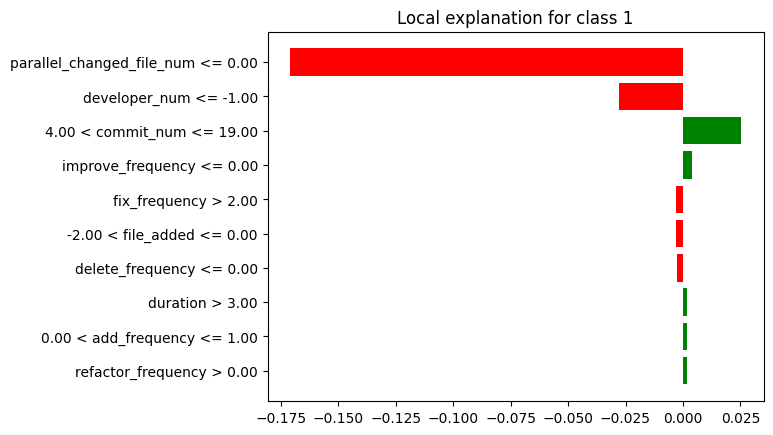

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[2, 'Variable'] = 'commit_num'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 line_added        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 line_added        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3          improve_frequency        4  Positivo
4              fix_frequency        5  Negativo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'improve_frequency', 'fix_frequency']
['commit_num', 'fix_frequency', 'developer_num', 'parallel_changed_file_num', 'line_added', 'improve_frequency', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       3   
1              fix_frequency         -         -       -         -       5   
2              developer_num         3  Negativo       3  Negativo       2   
3  parallel_changed_file_num         1  Negativo       1  Negativo       1   
4                 line_added         4  Negativo       4  Negativo       -   
5          improve_frequency         -         -       -         -       4   
6                 file_added         5  Negativo       5  Negativo       -   

             
      Signo  
0  Positivo  
1  Negativo  
2  Negativo  
3  Negativo  
4         -  
5  Positivo  
6         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "file_added", "improve_frequency", "fix_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Positivo       2  Positivo       3   
developer_num                     3  Negativo       3  Negativo       2   
line_added                        4  Negativo       4  Negativo       -   
file_added                        5  Negativo       5  Negativo       -   
improve_frequency                 -         -       -         -       4   
fix_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Positivo  
developer_num              Negativo  
line_added                        -  
file_added                        -  
improve_frequency          Positivo  
fix_frequency              Negativo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

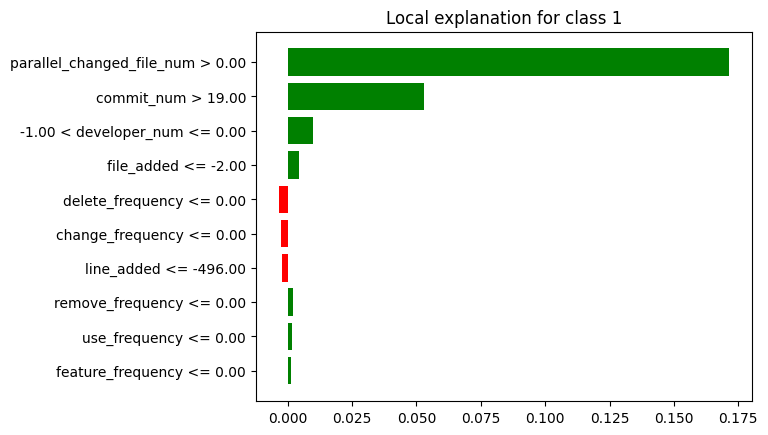

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)
lime_vn_df_min.at[2, 'Variable'] = 'developer_num'

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 file_added        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 file_added        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 file_added        4  Positivo
4           delete_frequency        5  Negativo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'delete_frequency']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'delete_frequency', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1              developer_num         3  Positivo       3  Positivo       3   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3           delete_frequency         -         -       -         -       5   
4                 line_added         5  Negativo       5  Negativo       -   
5                 file_added         4  Positivo       4  Positivo       4   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Negativo  
4         -  
5  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_added", "line_added", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       3   
file_added                        4  Positivo       4  Positivo       4   
line_added                        5  Negativo       5  Negativo       -   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Positivo  
file_added                 Positivo  
line_added                        -  
delete_frequency           Negativo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('commit_num', 1), ('parallel_changed_file_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('line_added', 5)], 'Shapley': [('commit_num', 1), ('parallel_changed_file_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('line_added', 5)], 'Lime': [('commit_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 3), ('developer_num', 2), ('improve_frequency', 4), ('fix_frequency', 5), ('parallel_changed_file_num', 1), ('commit_num',

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                     4.666667      3      4.666667      3   
improve_frequency                     -      -             -      -   
line_added                     4.333333      3      4.333333      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num      1.333333      3      1.333333      3   
developer_num                       3.0      3           3.0      3   
fix_frequency                         -      -             -      -   
commit_num                     1.666667      3      1.666667      3   

                                   Lime         
                          Ranking Medio Conteo  
file_added                     4.500000      2  
improve_frequency              4.000000      1  
line_added                     4.000000      1  
delete_frequency               5.000000      1  
parallel_changed_file_num      1.000000      3  
developer_num                  2.666667      3  
fix_frequency                  5.000000      1  
commit_num                     2.333333      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_vn[("General", "Ranking")] = df_resumen_ada_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_vn[("General", "Conteo Total")] = df_resumen_ada_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                     4.666667      3      4.666667      3   
improve_frequency                     -      -             -      -   
line_added                     4.333333      3      4.333333      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num      1.333333      3      1.333333      3   
developer_num                       3.0      3           3.0      3   
fix_frequency                         -      -             -      -   
commit_num                     1.666667      3      1.666667      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_added                     4.500000      2  4.611111            8  
improve_frequency              4.000000      1  4.000000            1  
line_added                     4.000000      1  4.222222            7  
delete_frequency               5.000000      1  5.000000            1  
parallel_changed_file_num      1.000000      3  1.222222            9  
developer_num                  2.666667      3  2.888889            9  
fix_frequency                  5.000000      1  5.000000            1  
commit_num                     2.333333      3  1.888889            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_vn[("General", "Peso Rango")] = 1 - ((df_resumen_ada_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_vn[("General", "Peso Conteo")] = df_resumen_ada_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_vn[("General", "Puntaje")] = df_resumen_ada_vn[("General", "Peso Rango")] + df_resumen_ada_vn[("General", "Peso Conteo")]
df_resumen_ada_vn[("General", "Ranking")] = df_resumen_ada_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                     4.666667      3      4.666667      3   
improve_frequency                     -      -             -      -   
line_added                     4.333333      3      4.333333      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num      1.333333      3      1.333333      3   
developer_num                       3.0      3           3.0      3   
fix_frequency                         -      -             -      -   
commit_num                     1.666667      3      1.666667      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_added                     4.500000      2     4.0            8  
improve_frequency              4.000000      1     6.0            1  
line_added                     4.000000      1     4.0            7  
delete_frequency               5.000000      1     7.0            1  
parallel_changed_file_num      1.000000      3     1.0            9  
developer_num                  2.666667      3     3.0            9  
fix_frequency                  5.000000      1     7.0            1  
commit_num                     2.333333      3     2.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_vn = df_resumen_ada_vn[new_columns]

In [ ]:
df_resumen_ada_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_vn[(tech, "Ranking Medio")] = df_resumen_ada_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.33      3   
commit_num                    2.0            9          1.67      3   
developer_num                 3.0            9          3.00      3   
file_added                    4.0            8          4.67      3   
line_added                    4.0            7          4.33      3   
improve_frequency             6.0            1             -      -   
delete_frequency              7.0            1             -      -   
fix_frequency                 7.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.33      3          1.00      3  
commit_num                         1.67      3          2.33      3  
developer_num                      3.00      3          2.67      3  
file_added                         4.67      3          4.50      2  
line_added                         4.33      3          4.00      1  
improve_frequency                     -      -          4.00      1  
delete_frequency                      -      -          5.00      1  
fix_frequency                         -      -          5.00      1

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

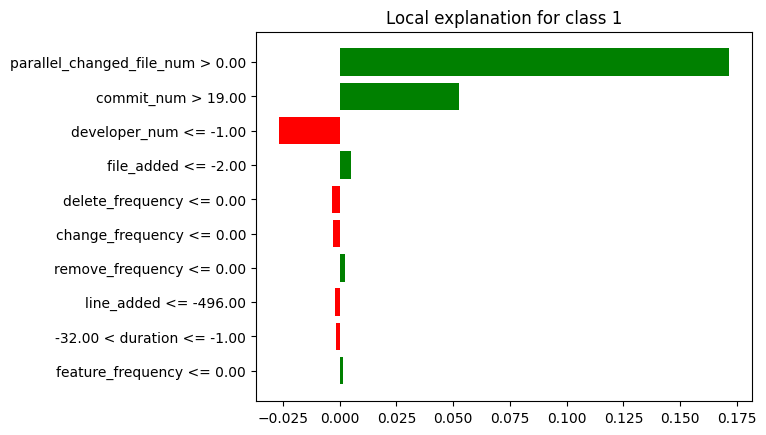

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4           delete_frequency        5  Negativo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'delete_frequency']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'delete_frequency', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1              developer_num         3  Negativo       3  Negativo       3   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3           delete_frequency         -         -       -         -       5   
4                 line_added         5  Negativo       5  Negativo       -   
5                 file_added         4  Positivo       4  Positivo       4   

             
      Signo  
0  Positivo  
1  Negativo  
2  Positivo  
3  Negativo  
4         -  
5  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_added", "line_added", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Negativo       3  Negativo       3   
file_added                        4  Positivo       4  Positivo       4   
line_added                        5  Negativo       5  Negativo       -   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Negativo  
file_added                 Positivo  
line_added                        -  
delete_frequency           Negativo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

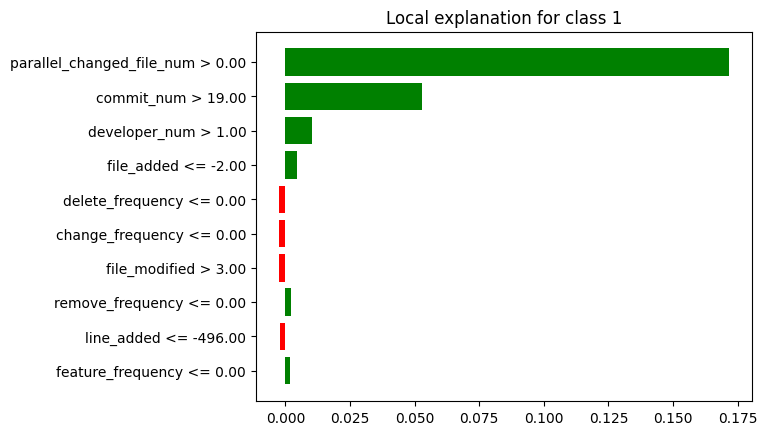

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 file_added        4  Positivo
4           delete_frequency        5  Negativo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'delete_frequency']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'delete_frequency', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1              developer_num         3  Positivo       3  Positivo       3   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3           delete_frequency         -         -       -         -       5   
4                 line_added         4  Negativo       4  Negativo       -   
5                 file_added         5  Negativo       5  Negativo       4   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Negativo  
4         -  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "file_added", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       3   
line_added                        4  Negativo       4  Negativo       -   
file_added                        5  Negativo       5  Negativo       4   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Positivo  
line_added                        -  
file_added                 Positivo  
delete_frequency           Negativo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

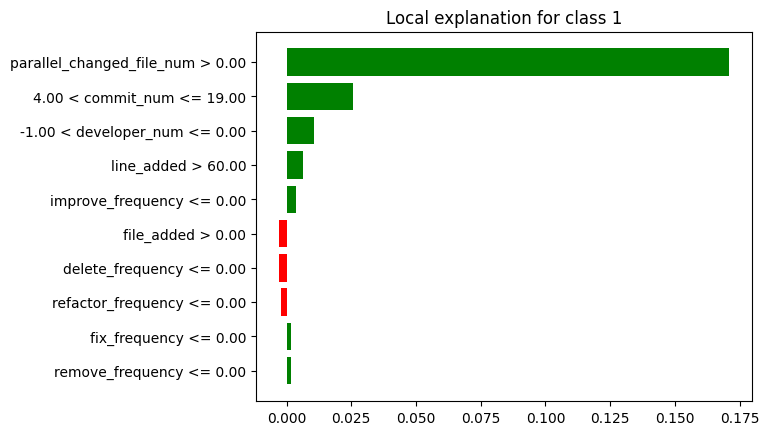

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)
lime_fp_df_min.at[1, 'Variable'] = 'commit_num'
lime_fp_df_min.at[2, 'Variable'] = 'developer_num'

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Positivo
4          improve_frequency        5  Positivo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'improve_frequency']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'line_added', 'improve_frequency', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1              developer_num         3  Positivo       3  Positivo       3   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3                 line_added         4  Positivo       4  Positivo       4   
4          improve_frequency         -         -       -         -       5   
5                 file_added         5  Negativo       5  Negativo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Positivo  
4  Positivo  
5         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "file_added", "improve_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       3   
line_added                        4  Positivo       4  Positivo       4   
file_added                        5  Negativo       5  Negativo       -   
improve_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Positivo  
line_added                 Positivo  
file_added                        -  
improve_frequency          Positivo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('delete_frequency', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('delete_frequency', 5), ('parallel_changed_file_num', 1), ('commit_num

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                     4.666667      3      4.666667      3   
improve_frequency                     -      -             -      -   
line_added                     4.333333      3      4.333333      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
developer_num                       3.0      3           3.0      3   
commit_num                          2.0      3           2.0      3   

                                   Lime         
                          Ranking Medio Conteo  
file_added                          4.0      2  
improve_frequency                   5.0      1  
line_added                          4.0      1  
delete_frequency                    5.0      2  
parallel_changed_file_num           1.0      3  
developer_num                       3.0      3  
commit_num                          2.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_fp[("General", "Ranking")] = df_resumen_ada_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_fp[("General", "Conteo Total")] = df_resumen_ada_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                     4.666667      3      4.666667      3   
improve_frequency                     -      -             -      -   
line_added                     4.333333      3      4.333333      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
developer_num                       3.0      3           3.0      3   
commit_num                          2.0      3           2.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_added                          4.0      2  4.444444            8  
improve_frequency                   5.0      1  5.000000            1  
line_added                          4.0      1  4.222222            7  
delete_frequency                    5.0      2  5.000000            2  
parallel_changed_file_num           1.0      3  1.000000            9  
developer_num                       3.0      3  3.000000            9  
commit_num                          2.0      3  2.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_fp[("General", "Peso Rango")] = 1 - ((df_resumen_ada_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_fp[("General", "Peso Conteo")] = df_resumen_ada_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_fp[("General", "Puntaje")] = df_resumen_ada_fp[("General", "Peso Rango")] + df_resumen_ada_fp[("General", "Peso Conteo")]
df_resumen_ada_fp[("General", "Ranking")] = df_resumen_ada_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                     4.666667      3      4.666667      3   
improve_frequency                     -      -             -      -   
line_added                     4.333333      3      4.333333      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
developer_num                       3.0      3           3.0      3   
commit_num                          2.0      3           2.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_added                          4.0      2     4.0            8  
improve_frequency                   5.0      1     7.0            1  
line_added                          4.0      1     4.0            7  
delete_frequency                    5.0      2     6.0            2  
parallel_changed_file_num           1.0      3     1.0            9  
developer_num                       3.0      3     3.0            9  
commit_num                          2.0      3     2.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_fp = df_resumen_ada_fp[new_columns]

In [ ]:
df_resumen_ada_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_fp[(tech, "Ranking Medio")] = df_resumen_ada_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.00      3   
developer_num                 3.0            9          3.00      3   
file_added                    4.0            8          4.67      3   
line_added                    4.0            7          4.33      3   
delete_frequency              6.0            2             -      -   
improve_frequency             7.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.00      3          2.00      3  
developer_num                      3.00      3          3.00      3  
file_added                         4.67      3          4.00      2  
line_added                         4.33      3          4.00      1  
delete_frequency                      -      -          5.00      2  
improve_frequency                     -      -          5.00      1

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

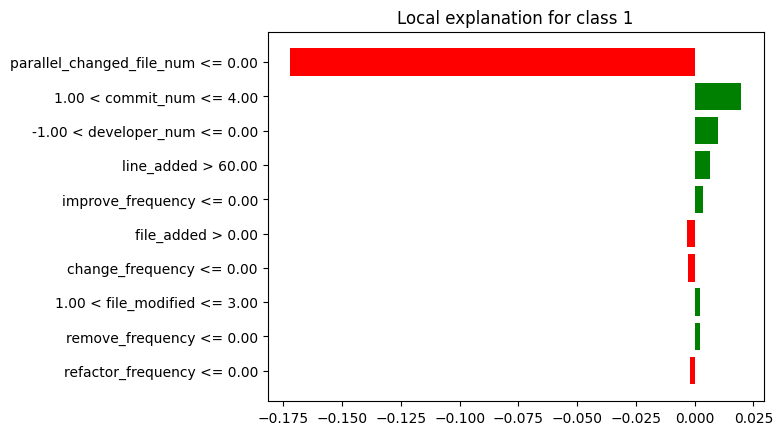

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[1, 'Variable'] = 'commit_num'
lime_fn_df_max.at[2, 'Variable'] = 'developer_num'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Positivo
4          improve_frequency        5  Positivo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'improve_frequency']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'line_added', 'improve_frequency', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1              developer_num         3  Positivo       3  Positivo       3   
2  parallel_changed_file_num         1  Negativo       1  Negativo       1   
3                 line_added         4  Negativo       4  Negativo       4   
4          improve_frequency         -         -       -         -       5   
5                 file_added         5  Negativo       5  Negativo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Negativo  
3  Positivo  
4  Positivo  
5         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "file_added", "improve_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       3   
line_added                        4  Negativo       4  Negativo       4   
file_added                        5  Negativo       5  Negativo       -   
improve_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Positivo  
developer_num              Positivo  
line_added                 Positivo  
file_added                        -  
improve_frequency          Positivo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

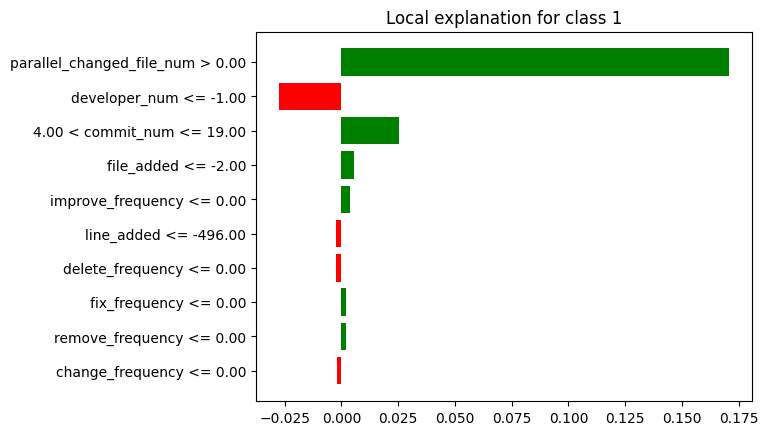

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[2, 'Variable'] = 'commit_num'

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 line_added        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 line_added        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 file_added        4  Positivo
4          improve_frequency        5  Positivo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_added', 'improve_frequency']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'line_added', 'improve_frequency', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       3   
1              developer_num         3  Negativo       3  Negativo       2   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3                 line_added         4  Negativo       4  Negativo       -   
4          improve_frequency         -         -       -         -       5   
5                 file_added         5  Negativo       5  Negativo       4   

             
      Signo  
0  Positivo  
1  Negativo  
2  Positivo  
3         -  
4  Positivo  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "file_added", "improve_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       3   
developer_num                     3  Negativo       3  Negativo       2   
line_added                        4  Negativo       4  Negativo       -   
file_added                        5  Negativo       5  Negativo       4   
improve_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Negativo  
line_added                        -  
file_added                 Positivo  
improve_frequency          Positivo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

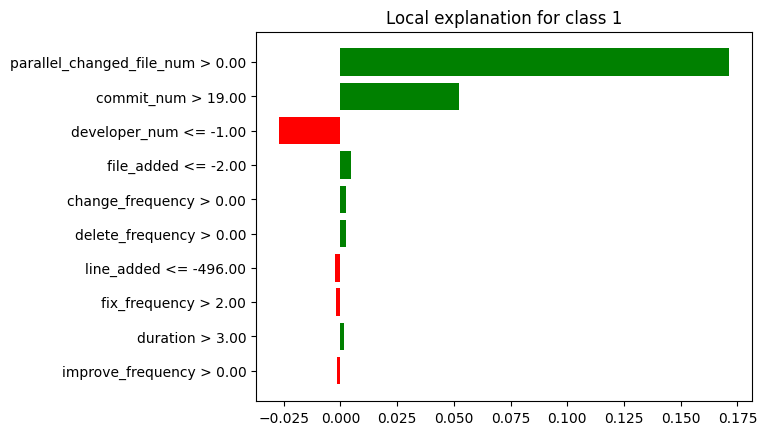

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 line_added        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 line_added        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4           change_frequency        5  Positivo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'change_frequency']
['commit_num', 'change_frequency', 'developer_num', 'parallel_changed_file_num', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       2   
1           change_frequency         -         -       -         -       5   
2              developer_num         3  Negativo       3  Negativo       3   
3  parallel_changed_file_num         1  Positivo       1  Positivo       1   
4                 line_added         4  Negativo       4  Negativo       -   
5                 file_added         5  Negativo       5  Negativo       4   

             
      Signo  
0  Positivo  
1  Positivo  
2  Negativo  
3  Positivo  
4         -  
5  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "file_added", "change_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Negativo       3  Negativo       3   
line_added                        4  Negativo       4  Negativo       -   
file_added                        5  Negativo       5  Negativo       4   
change_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Negativo  
line_added                        -  
file_added                 Positivo  
change_frequency           Positivo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_added', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('improve_frequency', 5), ('parallel_changed_file_num', 1), ('commit_num', 3), ('developer_num', 2), ('file_added', 4), ('improve_frequency', 5), ('parallel_changed_file_num', 1), ('commit_n

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                          5.0      3           5.0      3   
improve_frequency                     -      -             -      -   
line_added                          4.0      3           4.0      3   
parallel_changed_file_num           1.0      3           1.0      3   
developer_num                       3.0      3           3.0      3   
change_frequency                      -      -             -      -   
commit_num                          2.0      3           2.0      3   

                                   Lime         
                          Ranking Medio Conteo  
file_added                     4.000000      2  
improve_frequency              5.000000      2  
line_added                     4.000000      1  
parallel_changed_file_num      1.000000      3  
developer_num                  2.666667      3  
change_frequency               5.000000      1  
commit_num                     2.333333      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_fn[("General", "Ranking")] = df_resumen_ada_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_fn[("General", "Conteo Total")] = df_resumen_ada_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                          5.0      3           5.0      3   
improve_frequency                     -      -             -      -   
line_added                          4.0      3           4.0      3   
parallel_changed_file_num           1.0      3           1.0      3   
developer_num                       3.0      3           3.0      3   
change_frequency                      -      -             -      -   
commit_num                          2.0      3           2.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_added                     4.000000      2  4.666667            8  
improve_frequency              5.000000      2  5.000000            2  
line_added                     4.000000      1  4.000000            7  
parallel_changed_file_num      1.000000      3  1.000000            9  
developer_num                  2.666667      3  2.888889            9  
change_frequency               5.000000      1  5.000000            1  
commit_num                     2.333333      3  2.111111            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_fn[("General", "Peso Rango")] = 1 - ((df_resumen_ada_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_fn[("General", "Peso Conteo")] = df_resumen_ada_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_fn[("General", "Puntaje")] = df_resumen_ada_fn[("General", "Peso Rango")] + df_resumen_ada_fn[("General", "Peso Conteo")]
df_resumen_ada_fn[("General", "Ranking")] = df_resumen_ada_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                          5.0      3           5.0      3   
improve_frequency                     -      -             -      -   
line_added                          4.0      3           4.0      3   
parallel_changed_file_num           1.0      3           1.0      3   
developer_num                       3.0      3           3.0      3   
change_frequency                      -      -             -      -   
commit_num                          2.0      3           2.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_added                     4.000000      2     4.0            8  
improve_frequency              5.000000      2     6.0            2  
line_added                     4.000000      1     4.0            7  
parallel_changed_file_num      1.000000      3     1.0            9  
developer_num                  2.666667      3     3.0            9  
change_frequency               5.000000      1     7.0            1  
commit_num                     2.333333      3     2.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_fn = df_resumen_ada_fn[new_columns]

In [ ]:
df_resumen_ada_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_fn[(tech, "Ranking Medio")] = df_resumen_ada_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.00      3   
developer_num                 3.0            9          3.00      3   
file_added                    4.0            8          5.00      3   
line_added                    4.0            7          4.00      3   
improve_frequency             6.0            2             -      -   
change_frequency              7.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.00      3          2.33      3  
developer_num                      3.00      3          2.67      3  
file_added                         5.00      3          4.00      2  
line_added                         4.00      3          4.00      1  
improve_frequency                     -      -          5.00      2  
change_frequency                      -      -          5.00      1

## **RUSBoost:**

**FEATURE IMPORTANCE**

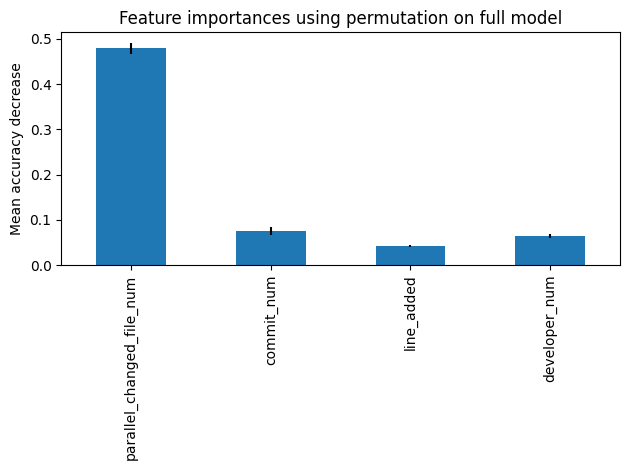

In [ ]:
permu = permutation_importance(modelo_rus, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

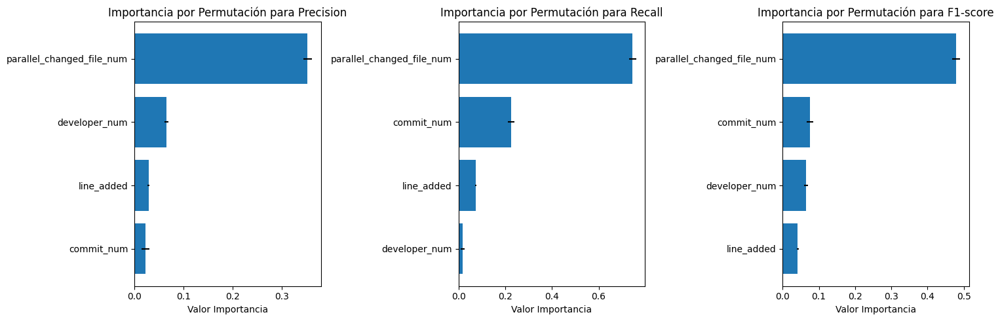

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_rus, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_rus = {}

permu_score = permutation_importance(modelo_rus, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_rus[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_rus['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.352471,0.008833
3,developer_num,0.064961,0.003958
2,line_added,0.028712,0.002062
1,commit_num,0.022239,0.008130


In [ ]:
results_global_rus['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.744725,0.015537
1,commit_num,0.226070,0.013644
2,line_added,0.073853,0.002324
3,developer_num,0.018043,0.007593


In [ ]:
results_global_rus['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.479221,0.011203
1,commit_num,0.075366,0.009334
3,developer_num,0.064473,0.004935
2,line_added,0.041898,0.002099


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_rus, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 18689 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 18689 values
  -> model_class       : imblearn.ensemble._weight_boosting.RUSBoostClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x79995e3f7d00> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.42, mean = 0.471, max = 0.554
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.547, mean = -0.389, max = 0.521
  -> model_info        : package imblearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

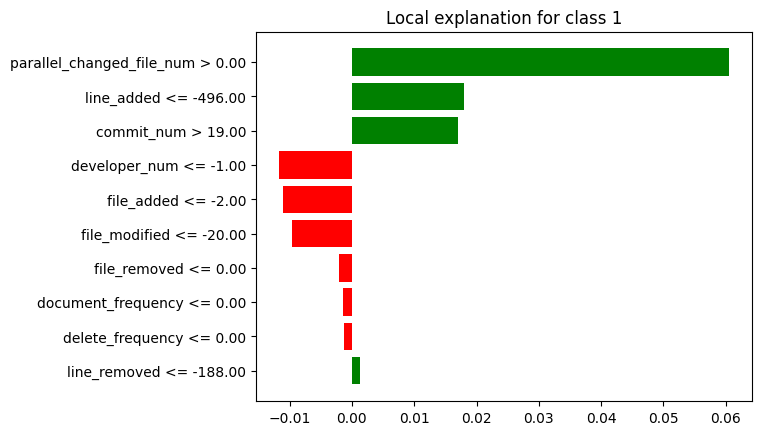

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 line_added        3  Positivo
3              file_modified        4  Negativo
4              developer_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 line_added        3  Positivo
3              file_modified        4  Negativo
4              developer_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Negativo
4                 file_added        5  Negativo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'line_added', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'line_added', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'file_added']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       3   
1              developer_num         5  Negativo       5  Negativo       4   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3              file_modified         4  Negativo       4  Negativo       -   
4                 line_added         3  Positivo       3  Positivo       2   
5                 file_added         -         -       -         -       5   

             
      Signo  
0  Positivo  
1  Negativo  
2  Positivo  
3         -  
4  Positivo  
5  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_added", "file_modified", "developer_num", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       3   
line_added                        3  Positivo       3  Positivo       2   
file_modified                     4  Negativo       4  Negativo       -   
developer_num                     5  Negativo       5  Negativo       4   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
line_added                 Positivo  
file_modified                     -  
developer_num              Negativo  
file_added                 Negativo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

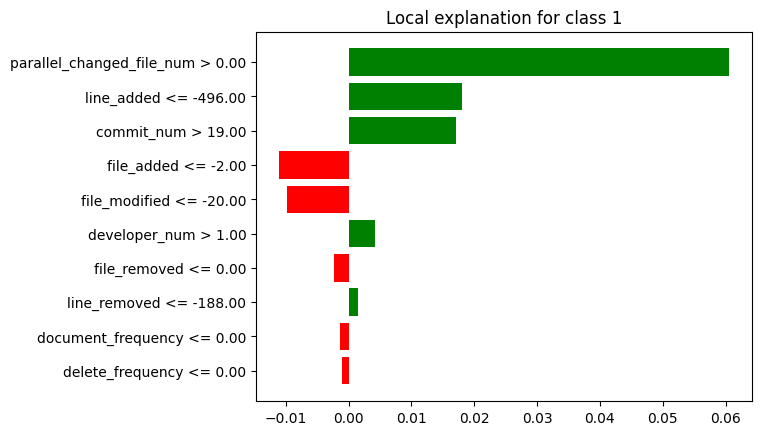

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 file_added        3  Negativo
3              file_modified        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 file_added        3  Negativo
3              file_modified        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3                 file_added        4  Negativo
4              file_modified        5  Negativo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'line_added', 'file_added', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'line_added', 'file_added', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'line_added', 'commit_num', 'file_added', 'file_modified']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         -         -       -         -       3   
1              developer_num         5  Positivo       5  Positivo       -   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3              file_modified         4  Negativo       4  Negativo       5   
4                 line_added         2  Positivo       2  Positivo       2   
5                 file_added         3  Negativo       3  Negativo       4   

             
      Signo  
0  Positivo  
1         -  
2  Positivo  
3  Negativo  
4  Positivo  
5  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_added", "file_added", "file_modified", "developer_num", "commit_num"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
line_added                        2  Positivo       2  Positivo       2   
file_added                        3  Negativo       3  Negativo       4   
file_modified                     4  Negativo       4  Negativo       5   
developer_num                     5  Positivo       5  Positivo       -   
commit_num                        -         -       -         -       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
line_added                 Positivo  
file_added                 Negativo  
file_modified              Negativo  
developer_num                     -  
commit_num                 Positivo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

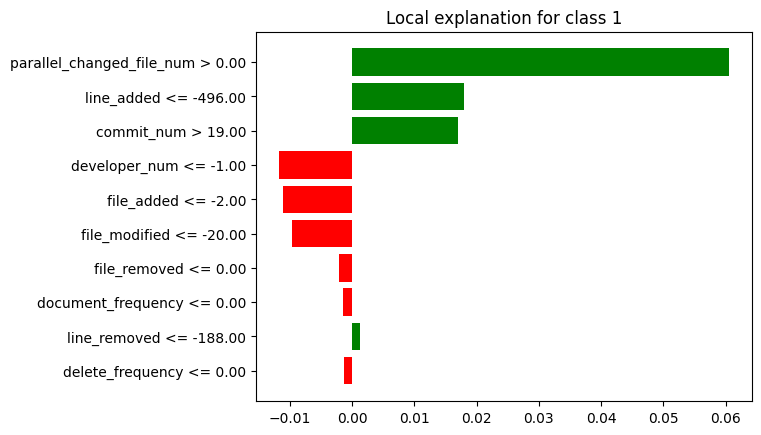

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               line_removed        3  Positivo
3               file_removed        4  Negativo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               line_removed        3  Positivo
3               file_removed        4  Negativo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Negativo
4                 file_added        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'line_removed', 'file_removed', 'commit_num']
['parallel_changed_file_num', 'developer_num', 'line_removed', 'file_removed', 'commit_num']
['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'file_added']
['commit_num', 'line_removed', 'developer_num', 'parallel_changed_file_num', 'line_added', 'file_added', 'file_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         5  Positivo       5  Positivo       3   
1               line_removed         3  Positivo       3  Positivo       -   
2              developer_num         2  Negativo       2  Negativo       4   
3  parallel_changed_file_num         1  Positivo       1  Positivo       1   
4                 line_added         -         -       -         -       2   
5                 file_added         -         -       -         -       5   
6               file_removed         4  Negativo       4  Negativo       -   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3  Positivo  
4  Positivo  
5  Negativo  
6         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "line_removed", "file_removed", "commit_num", "line_added", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       4   
line_removed                      3  Positivo       3  Positivo       -   
file_removed                      4  Negativo       4  Negativo       -   
commit_num                        5  Positivo       5  Positivo       3   
line_added                        -         -       -         -       2   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
line_removed                      -  
file_removed                      -  
commit_num                 Positivo  
line_added                 Positivo  
file_added                 Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_added', 3), ('file_modified', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('line_added', 2), ('file_added', 3), ('file_modified', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('line_removed', 3), ('file_removed', 4), ('commit_num', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_added', 3), ('file_modified', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('line_added', 2), ('file_added', 3), ('file_modified', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('line_removed', 3), ('file_removed', 4), ('commit_num', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 3), ('line_added', 2), ('developer_num', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('line_added', 2), ('file_added', 4), ('file_modified', 5), ('commit_num', 3), ('parallel_changed_file_num', 1), ('de

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        4.0      1           4.0      1   
file_added                          3.0      1           3.0      1   
line_added                          2.5      2           2.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       4.0      2           4.0      2   
developer_num                       4.0      3           4.0      3   
line_removed                        3.0      1           3.0      1   
commit_num                          3.5      2           3.5      2   

                                   Lime         
                          Ranking Medio Conteo  
file_removed                          -      -  
file_added                     4.666667      3  
line_added                          2.0      3  
parallel_changed_file_num           1.0      3  
file_modified                       5.0      1  
developer_num                       4.0      2  
line_removed                          -      -  
commit_num                          3.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_vp[("General", "Ranking")] = df_resumen_rus_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_vp[("General", "Conteo Total")] = df_resumen_rus_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        4.0      1           4.0      1   
file_added                          3.0      1           3.0      1   
line_added                          2.5      2           2.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       4.0      2           4.0      2   
developer_num                       4.0      3           4.0      3   
line_removed                        3.0      1           3.0      1   
commit_num                          3.5      2           3.5      2   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_removed                          -      -  4.000000            2  
file_added                     4.666667      3  3.555556            5  
line_added                          2.0      3  2.333333            7  
parallel_changed_file_num           1.0      3  1.000000            9  
file_modified                       5.0      1  4.333333            5  
developer_num                       4.0      2  4.000000            8  
line_removed                          -      -  3.000000            2  
commit_num                          3.0      3  3.333333            7

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_vp[("General", "Peso Rango")] = 1 - ((df_resumen_rus_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_vp[("General", "Peso Conteo")] = df_resumen_rus_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_vp[("General", "Puntaje")] = df_resumen_rus_vp[("General", "Peso Rango")] + df_resumen_rus_vp[("General", "Peso Conteo")]
df_resumen_rus_vp[("General", "Ranking")] = df_resumen_rus_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_removed                        4.0      1           4.0      1   
file_added                          3.0      1           3.0      1   
line_added                          2.5      2           2.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
file_modified                       4.0      2           4.0      2   
developer_num                       4.0      3           4.0      3   
line_removed                        3.0      1           3.0      1   
commit_num                          3.5      2           3.5      2   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_removed                          -      -     8.0            2  
file_added                     4.666667      3     5.0            5  
line_added                          2.0      3     2.0            7  
parallel_changed_file_num           1.0      3     1.0            9  
file_modified                       5.0      1     7.0            5  
developer_num                       4.0      2     4.0            8  
line_removed                          -      -     5.0            2  
commit_num                          3.0      3     3.0            7

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_vp = df_resumen_rus_vp[new_columns]

In [ ]:
df_resumen_rus_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_vp[(tech, "Ranking Medio")] = df_resumen_rus_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
line_added                    2.0            7          2.50      2   
commit_num                    3.0            7          3.50      2   
developer_num                 4.0            8          4.00      3   
file_added                    5.0            5          3.00      1   
line_removed                  5.0            2          3.00      1   
file_modified                 7.0            5          4.00      2   
file_removed                  8.0            2          4.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
line_added                         2.50      2          2.00      3  
commit_num                         3.50      2          3.00      3  
developer_num                      4.00      3          4.00      2  
file_added                         3.00      1          4.67      3  
line_removed                       3.00      1             -      -  
file_modified                      4.00      2          5.00      1  
file_removed                       4.00      1             -      -

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

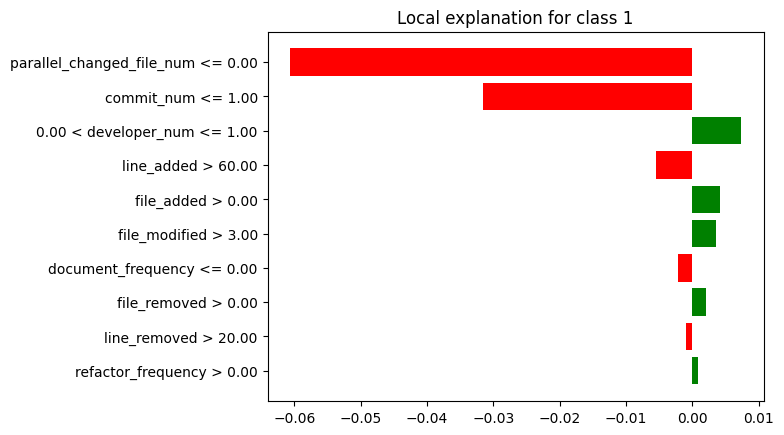

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)
lime_vn_df_max.at[2, 'Variable'] = 'developer_num'

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0                 commit_num        1  Negativo
1  parallel_changed_file_num        2  Negativo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0                 commit_num        1  Negativo
1  parallel_changed_file_num        2  Negativo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4                 file_added        5  Positivo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['commit_num', 'parallel_changed_file_num', 'developer_num', 'line_added', 'file_modified']
['commit_num', 'parallel_changed_file_num', 'developer_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         1  Negativo       1  Negativo       2   
1              developer_num         3  Positivo       3  Positivo       3   
2  parallel_changed_file_num         2  Negativo       2  Negativo       1   
3              file_modified         5  Positivo       5  Positivo       -   
4                 line_added         4  Negativo       4  Negativo       4   
5                 file_added         -         -       -         -       5   

             
      Signo  
0  Negativo  
1  Positivo  
2  Negativo  
3         -  
4  Negativo  
5  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["commit_num", "parallel_changed_file_num", "developer_num", "line_added", "file_modified", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
commit_num                        1  Negativo       1  Negativo       2   
parallel_changed_file_num         2  Negativo       2  Negativo       1   
developer_num                     3  Positivo       3  Positivo       3   
line_added                        4  Negativo       4  Negativo       4   
file_modified                     5  Positivo       5  Positivo       -   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
commit_num                 Negativo  
parallel_changed_file_num  Negativo  
developer_num              Positivo  
line_added                 Negativo  
file_modified                     -  
file_added                 Positivo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

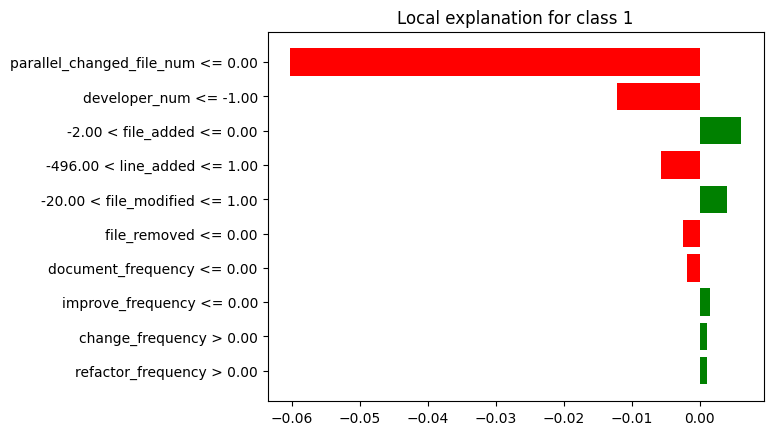

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[2, 'Variable'] = 'file_added'
lime_vn_df_mediana.at[3, 'Variable'] = 'line_added'
lime_vn_df_mediana.at[4, 'Variable'] = 'file_modified'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2                 file_added        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'file_added', 'line_added', 'file_modified']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Positivo       3  Positivo       -   
1              developer_num         2  Negativo       2  Negativo       2   
2  parallel_changed_file_num         1  Negativo       1  Negativo       1   
3              file_modified         5  Positivo       5  Positivo       5   
4                 line_added         4  Negativo       4  Negativo       4   
5                 file_added         -         -       -         -       3   

             
      Signo  
0         -  
1  Negativo  
2  Negativo  
3  Positivo  
4  Negativo  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "file_modified", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
developer_num                     2  Negativo       2  Negativo       2   
commit_num                        3  Positivo       3  Positivo       -   
line_added                        4  Negativo       4  Negativo       4   
file_modified                     5  Positivo       5  Positivo       5   
file_added                        -         -       -         -       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
developer_num              Negativo  
commit_num                        -  
line_added                 Negativo  
file_modified              Positivo  
file_added                 Positivo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

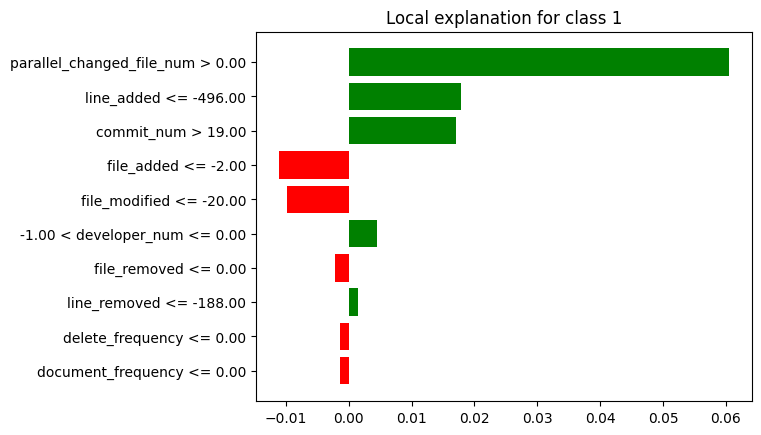

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 file_added        3  Negativo
3              file_modified        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 file_added        3  Negativo
3              file_modified        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3                 file_added        4  Negativo
4              file_modified        5  Negativo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'line_added', 'file_added', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'line_added', 'file_added', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'line_added', 'commit_num', 'file_added', 'file_modified']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         -         -       -         -       3   
1              developer_num         5  Positivo       5  Positivo       -   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3              file_modified         4  Negativo       4  Negativo       5   
4                 line_added         2  Positivo       2  Positivo       2   
5                 file_added         3  Negativo       3  Negativo       4   

             
      Signo  
0  Positivo  
1         -  
2  Positivo  
3  Negativo  
4  Positivo  
5  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_added", "file_added", "file_modified", "developer_num", "commit_num"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
line_added                        2  Positivo       2  Positivo       2   
file_added                        3  Negativo       3  Negativo       4   
file_modified                     4  Negativo       4  Negativo       5   
developer_num                     5  Positivo       5  Positivo       -   
commit_num                        -         -       -         -       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
line_added                 Positivo  
file_added                 Negativo  
file_modified              Negativo  
developer_num                     -  
commit_num                 Positivo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('commit_num', 1), ('parallel_changed_file_num', 2), ('developer_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('line_added', 2), ('file_added', 3), ('file_modified', 4), ('developer_num', 5)], 'Shapley': [('commit_num', 1), ('parallel_changed_file_num', 2), ('developer_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('line_added', 2), ('file_added', 3), ('file_modified', 4), ('developer_num', 5)], 'Lime': [('commit_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('line_added', 4), ('file_modified', 5), ('file_added', 3), ('parallel_changed_file_num', 1), ('l

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                     3.000000      1      3.000000      1   
line_added                     3.333333      3      3.333333      3   
file_modified                  4.666667      3      4.666667      3   
parallel_changed_file_num      1.333333      3      1.333333      3   
developer_num                  3.333333      3      3.333333      3   
commit_num                     2.000000      2      2.000000      2   

                                   Lime         
                          Ranking Medio Conteo  
file_added                     4.000000      3  
line_added                     3.333333      3  
file_modified                  5.000000      2  
parallel_changed_file_num      1.000000      3  
developer_num                  2.500000      2  
commit_num                     2.500000      2

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_vn[("General", "Ranking")] = df_resumen_rus_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_vn[("General", "Conteo Total")] = df_resumen_rus_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                     3.000000      1      3.000000      1   
line_added                     3.333333      3      3.333333      3   
file_modified                  4.666667      3      4.666667      3   
parallel_changed_file_num      1.333333      3      1.333333      3   
developer_num                  3.333333      3      3.333333      3   
commit_num                     2.000000      2      2.000000      2   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_added                     4.000000      3  3.333333            5  
line_added                     3.333333      3  3.333333            9  
file_modified                  5.000000      2  4.777778            8  
parallel_changed_file_num      1.000000      3  1.222222            9  
developer_num                  2.500000      2  3.055556            8  
commit_num                     2.500000      2  2.166667            6

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_vn[("General", "Peso Rango")] = 1 - ((df_resumen_rus_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_vn[("General", "Peso Conteo")] = df_resumen_rus_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_vn[("General", "Puntaje")] = df_resumen_rus_vn[("General", "Peso Rango")] + df_resumen_rus_vn[("General", "Peso Conteo")]
df_resumen_rus_vn[("General", "Ranking")] = df_resumen_rus_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                     3.000000      1      3.000000      1   
line_added                     3.333333      3      3.333333      3   
file_modified                  4.666667      3      4.666667      3   
parallel_changed_file_num      1.333333      3      1.333333      3   
developer_num                  3.333333      3      3.333333      3   
commit_num                     2.000000      2      2.000000      2   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_added                     4.000000      3     6.0            5  
line_added                     3.333333      3     2.0            9  
file_modified                  5.000000      2     5.0            8  
parallel_changed_file_num      1.000000      3     1.0            9  
developer_num                  2.500000      2     3.0            8  
commit_num                     2.500000      2     4.0            6

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_vn = df_resumen_rus_vn[new_columns]

In [ ]:
df_resumen_rus_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_vn[(tech, "Ranking Medio")] = df_resumen_rus_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.33      3   
line_added                    2.0            9          3.33      3   
developer_num                 3.0            8          3.33      3   
commit_num                    4.0            6          2.00      2   
file_modified                 5.0            8          4.67      3   
file_added                    6.0            5          3.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.33      3          1.00      3  
line_added                         3.33      3          3.33      3  
developer_num                      3.33      3          2.50      2  
commit_num                         2.00      2          2.50      2  
file_modified                      4.67      3          5.00      2  
file_added                         3.00      1          4.00      3

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

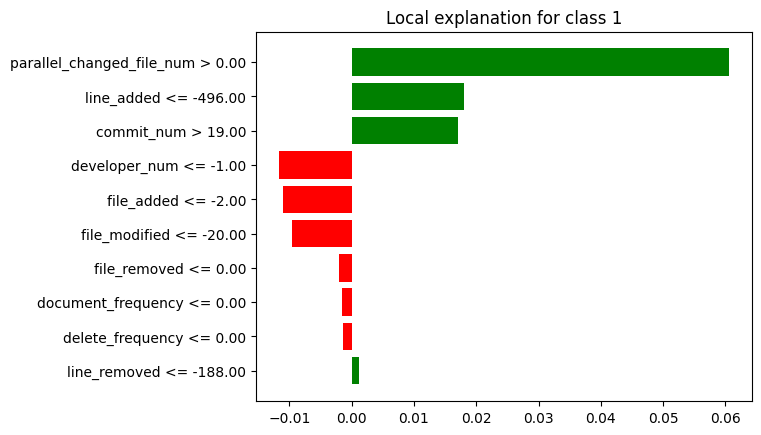

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 line_added        3  Positivo
3              file_modified        4  Negativo
4              developer_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 line_added        3  Positivo
3              file_modified        4  Negativo
4              developer_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Negativo
4                 file_added        5  Negativo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'line_added', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'line_added', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'file_added']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         2  Positivo       2  Positivo       3   
1              developer_num         5  Negativo       5  Negativo       4   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3              file_modified         4  Negativo       4  Negativo       -   
4                 line_added         3  Positivo       3  Positivo       2   
5                 file_added         -         -       -         -       5   

             
      Signo  
0  Positivo  
1  Negativo  
2  Positivo  
3         -  
4  Positivo  
5  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_added", "file_modified", "developer_num", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       3   
line_added                        3  Positivo       3  Positivo       2   
file_modified                     4  Negativo       4  Negativo       -   
developer_num                     5  Negativo       5  Negativo       4   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
line_added                 Positivo  
file_modified                     -  
developer_num              Negativo  
file_added                 Negativo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

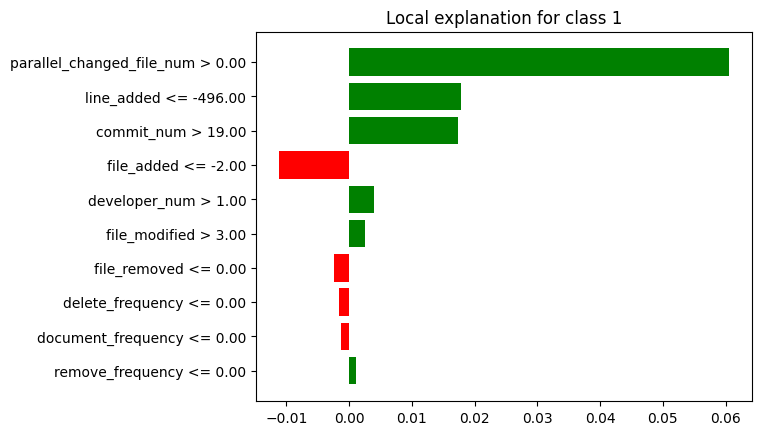

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3                 file_added        4  Negativo
4              developer_num        5  Positivo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'line_added', 'commit_num', 'file_added', 'developer_num']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Positivo       3  Positivo       3   
1              developer_num         2  Positivo       2  Positivo       5   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3              file_modified         5  Positivo       5  Positivo       -   
4                 line_added         4  Negativo       4  Negativo       2   
5                 file_added         -         -       -         -       4   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3         -  
4  Positivo  
5  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "file_modified", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       5   
commit_num                        3  Positivo       3  Positivo       3   
line_added                        4  Negativo       4  Negativo       2   
file_modified                     5  Positivo       5  Positivo       -   
file_added                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
commit_num                 Positivo  
line_added                 Positivo  
file_modified                     -  
file_added                 Negativo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

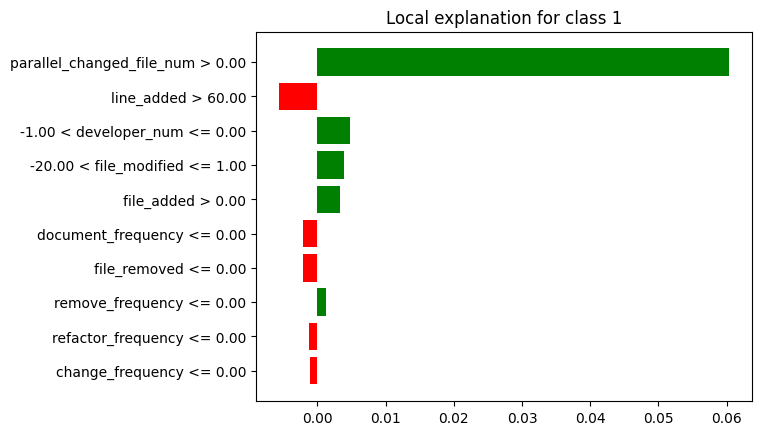

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)
lime_fp_df_min.at[2, 'Variable'] = 'developer_num'
lime_fp_df_min.at[3, 'Variable'] = 'file_modified'

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Negativo
2              developer_num        3  Positivo
3              file_modified        4  Positivo
4                 file_added        5  Positivo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'line_added', 'developer_num', 'file_modified', 'file_added']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Positivo       3  Positivo       -   
1              developer_num         2  Positivo       2  Positivo       3   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3              file_modified         5  Positivo       5  Positivo       4   
4                 line_added         4  Negativo       4  Negativo       2   
5                 file_added         -         -       -         -       5   

             
      Signo  
0         -  
1  Positivo  
2  Positivo  
3  Positivo  
4  Negativo  
5  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "file_modified", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       3   
commit_num                        3  Positivo       3  Positivo       -   
line_added                        4  Negativo       4  Negativo       2   
file_modified                     5  Positivo       5  Positivo       4   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
commit_num                        -  
line_added                 Negativo  
file_modified              Positivo  
file_added                 Positivo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_added', 3), ('file_modified', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_modified', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_added', 3), ('file_modified', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_modified', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 3), ('line_added', 2), ('developer_num', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 5), ('commit_num', 3), ('line_added', 2), ('file_added', 4), ('parallel_changed_file_num', 1), ('deve

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                            -      -             -      -   
line_added                     3.666667      3      3.666667      3   
file_modified                  4.666667      3      4.666667      3   
parallel_changed_file_num           1.0      3           1.0      3   
developer_num                       3.0      3           3.0      3   
commit_num                     2.666667      3      2.666667      3   

                                   Lime         
                          Ranking Medio Conteo  
file_added                     4.666667      3  
line_added                     2.000000      3  
file_modified                  4.000000      1  
parallel_changed_file_num      1.000000      3  
developer_num                  4.000000      3  
commit_num                     3.000000      2

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_fp[("General", "Ranking")] = df_resumen_rus_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_fp[("General", "Conteo Total")] = df_resumen_rus_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                            -      -             -      -   
line_added                     3.666667      3      3.666667      3   
file_modified                  4.666667      3      4.666667      3   
parallel_changed_file_num           1.0      3           1.0      3   
developer_num                       3.0      3           3.0      3   
commit_num                     2.666667      3      2.666667      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_added                     4.666667      3  4.666667            3  
line_added                     2.000000      3  3.111111            9  
file_modified                  4.000000      1  4.444444            7  
parallel_changed_file_num      1.000000      3  1.000000            9  
developer_num                  4.000000      3  3.333333            9  
commit_num                     3.000000      2  2.777778            8

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_fp[("General", "Peso Rango")] = 1 - ((df_resumen_rus_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_fp[("General", "Peso Conteo")] = df_resumen_rus_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_fp[("General", "Puntaje")] = df_resumen_rus_fp[("General", "Peso Rango")] + df_resumen_rus_fp[("General", "Peso Conteo")]
df_resumen_rus_fp[("General", "Ranking")] = df_resumen_rus_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                            -      -             -      -   
line_added                     3.666667      3      3.666667      3   
file_modified                  4.666667      3      4.666667      3   
parallel_changed_file_num           1.0      3           1.0      3   
developer_num                       3.0      3           3.0      3   
commit_num                     2.666667      3      2.666667      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_added                     4.666667      3     6.0            3  
line_added                     2.000000      3     2.0            9  
file_modified                  4.000000      1     5.0            7  
parallel_changed_file_num      1.000000      3     1.0            9  
developer_num                  4.000000      3     3.0            9  
commit_num                     3.000000      2     3.0            8

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_fp = df_resumen_rus_fp[new_columns]

In [ ]:
df_resumen_rus_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_fp[(tech, "Ranking Medio")] = df_resumen_rus_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
line_added                    2.0            9          3.67      3   
developer_num                 3.0            9          3.00      3   
commit_num                    3.0            8          2.67      3   
file_modified                 5.0            7          4.67      3   
file_added                    6.0            3             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
line_added                         3.67      3          2.00      3  
developer_num                      3.00      3          4.00      3  
commit_num                         2.67      3          3.00      2  
file_modified                      4.67      3          4.00      1  
file_added                            -      -          4.67      3

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

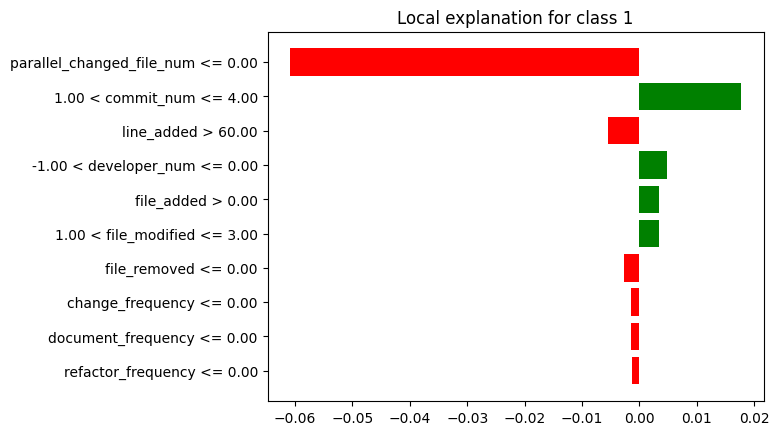

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[1, 'Variable'] = 'commit_num'
lime_fn_df_max.at[3, 'Variable'] = 'developer_num'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0                 commit_num        1  Positivo
1  parallel_changed_file_num        2  Negativo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0                 commit_num        1  Positivo
1  parallel_changed_file_num        2  Negativo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Positivo
2                 line_added        3  Negativo
3              developer_num        4  Positivo
4                 file_added        5  Positivo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['commit_num', 'parallel_changed_file_num', 'developer_num', 'line_added', 'file_modified']
['commit_num', 'parallel_changed_file_num', 'developer_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'line_added', 'developer_num', 'file_added']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         1  Positivo       1  Positivo       2   
1              developer_num         3  Positivo       3  Positivo       4   
2  parallel_changed_file_num         2  Negativo       2  Negativo       1   
3              file_modified         5  Positivo       5  Positivo       -   
4                 line_added         4  Negativo       4  Negativo       3   
5                 file_added         -         -       -         -       5   

             
      Signo  
0  Positivo  
1  Positivo  
2  Negativo  
3         -  
4  Negativo  
5  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["commit_num", "parallel_changed_file_num", "developer_num", "line_added", "file_modified", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
commit_num                        1  Positivo       1  Positivo       2   
parallel_changed_file_num         2  Negativo       2  Negativo       1   
developer_num                     3  Positivo       3  Positivo       4   
line_added                        4  Negativo       4  Negativo       3   
file_modified                     5  Positivo       5  Positivo       -   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
commit_num                 Positivo  
parallel_changed_file_num  Negativo  
developer_num              Positivo  
line_added                 Negativo  
file_modified                     -  
file_added                 Positivo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

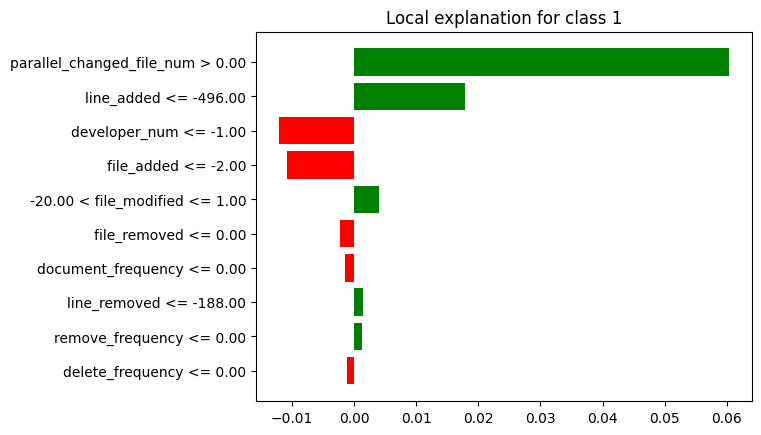

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[4, 'Variable'] = 'file_modified'

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Negativo
4              file_modified        5  Positivo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'line_added', 'developer_num', 'file_added', 'file_modified']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Positivo       3  Positivo       -   
1              developer_num         2  Negativo       2  Negativo       3   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3              file_modified         5  Positivo       5  Positivo       5   
4                 line_added         4  Negativo       4  Negativo       2   
5                 file_added         -         -       -         -       4   

             
      Signo  
0         -  
1  Negativo  
2  Positivo  
3  Positivo  
4  Positivo  
5  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "file_modified", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       3   
commit_num                        3  Positivo       3  Positivo       -   
line_added                        4  Negativo       4  Negativo       2   
file_modified                     5  Positivo       5  Positivo       5   
file_added                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                        -  
line_added                 Positivo  
file_modified              Positivo  
file_added                 Negativo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

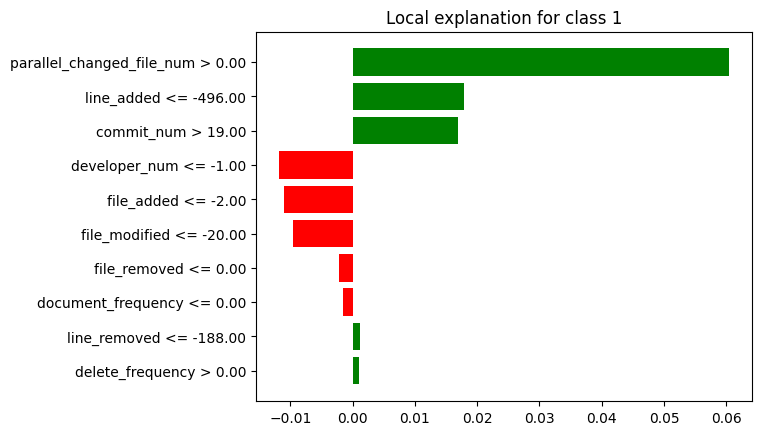

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Negativo
4                 file_added        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'file_added']
['commit_num', 'developer_num', 'parallel_changed_file_num', 'file_modified', 'line_added', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0                 commit_num         3  Positivo       3  Positivo       3   
1              developer_num         2  Negativo       2  Negativo       4   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3              file_modified         5  Positivo       5  Positivo       -   
4                 line_added         4  Negativo       4  Negativo       2   
5                 file_added         -         -       -         -       5   

             
      Signo  
0  Positivo  
1  Negativo  
2  Positivo  
3         -  
4  Positivo  
5  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "file_modified", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       4   
commit_num                        3  Positivo       3  Positivo       3   
line_added                        4  Negativo       4  Negativo       2   
file_modified                     5  Positivo       5  Positivo       -   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                 Positivo  
line_added                 Positivo  
file_modified                     -  
file_added                 Negativo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('commit_num', 1), ('parallel_changed_file_num', 2), ('developer_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_modified', 5)], 'Shapley': [('commit_num', 1), ('parallel_changed_file_num', 2), ('developer_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_modified', 5)], 'Lime': [('commit_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 4), ('line_added', 3), ('file_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 3), ('line_added', 2), ('file_modified', 5), ('file_added', 4), ('parallel_changed_file_num', 1), ('d

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                            -      -             -      -   
line_added                          4.0      3           4.0      3   
file_modified                       5.0      3           5.0      3   
parallel_changed_file_num      1.333333      3      1.333333      3   
developer_num                  2.333333      3      2.333333      3   
commit_num                     2.333333      3      2.333333      3   

                                   Lime         
                          Ranking Medio Conteo  
file_added                     4.666667      3  
line_added                     2.333333      3  
file_modified                  5.000000      1  
parallel_changed_file_num      1.000000      3  
developer_num                  3.666667      3  
commit_num                     2.500000      2

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_fn[("General", "Ranking")] = df_resumen_rus_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_fn[("General", "Conteo Total")] = df_resumen_rus_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                            -      -             -      -   
line_added                          4.0      3           4.0      3   
file_modified                       5.0      3           5.0      3   
parallel_changed_file_num      1.333333      3      1.333333      3   
developer_num                  2.333333      3      2.333333      3   
commit_num                     2.333333      3      2.333333      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_added                     4.666667      3  4.666667            3  
line_added                     2.333333      3  3.444444            9  
file_modified                  5.000000      1  5.000000            7  
parallel_changed_file_num      1.000000      3  1.222222            9  
developer_num                  3.666667      3  2.777778            9  
commit_num                     2.500000      2  2.388889            8

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_fn[("General", "Peso Rango")] = 1 - ((df_resumen_rus_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_fn[("General", "Peso Conteo")] = df_resumen_rus_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_fn[("General", "Puntaje")] = df_resumen_rus_fn[("General", "Peso Rango")] + df_resumen_rus_fn[("General", "Peso Conteo")]
df_resumen_rus_fn[("General", "Ranking")] = df_resumen_rus_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_added                            -      -             -      -   
line_added                          4.0      3           4.0      3   
file_modified                       5.0      3           5.0      3   
parallel_changed_file_num      1.333333      3      1.333333      3   
developer_num                  2.333333      3      2.333333      3   
commit_num                     2.333333      3      2.333333      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_added                     4.666667      3     5.0            3  
line_added                     2.333333      3     3.0            9  
file_modified                  5.000000      1     6.0            7  
parallel_changed_file_num      1.000000      3     1.0            9  
developer_num                  3.666667      3     2.0            9  
commit_num                     2.500000      2     3.0            8

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_fn = df_resumen_rus_fn[new_columns]

In [ ]:
df_resumen_rus_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_fn[(tech, "Ranking Medio")] = df_resumen_rus_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.33      3   
developer_num                 2.0            9          2.33      3   
line_added                    3.0            9          4.00      3   
commit_num                    3.0            8          2.33      3   
file_added                    5.0            3             -      -   
file_modified                 6.0            7          5.00      3   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.33      3          1.00      3  
developer_num                      2.33      3          3.67      3  
line_added                         4.00      3          2.33      3  
commit_num                         2.33      3          2.50      2  
file_added                            -      -          4.67      3  
file_modified                      5.00      3          5.00      1

## **LOCAL GENERAL:**

Verdadero Positivo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_vp, df_resumen_brf_vp, df_resumen_gb_vp, df_resumen_ada_vp, df_resumen_rus_vp]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
commit_num,2,9,2,9,2,9,2,9,3,7,2,43
developer_num,3,8,7,3,4,6,3,9,4,8,3,34
file_added,5,2,3,6,5,4,4,9,5,5,4,26
file_modified,4,7,5,5,3,8,-,-,7,5,5,25
line_added,5,4,10,1,-,-,5,6,2,7,6,18
line_removed,7,2,4,4,8,1,-,-,5,2,7,9
file_removed,7,2,6,3,5,5,-,-,8,2,8,12
delete_frequency,-,-,-,-,-,-,6,3,-,-,9,3
commit_density,-,-,8,2,7,2,-,-,-,-,10,4


Verdadero Negativo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_vn, df_resumen_brf_vn, df_resumen_gb_vn, df_resumen_ada_vn, df_resumen_rus_vn]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
commit_num,2,9,2,8,2,8,2,9,4,6,2,40
developer_num,3,7,7,2,4,5,3,9,3,8,3,31
line_added,6,6,3,4,8,3,4,7,2,9,4,29
file_added,7,3,3,4,3,6,4,8,6,5,5,26
file_modified,4,4,8,4,5,2,-,-,5,8,6,18
line_removed,5,2,3,3,9,3,-,-,-,-,7,8
fix_frequency,9,1,6,2,5,2,7,1,-,-,8,6
file_removed,8,2,14,1,7,6,-,-,-,-,9,9
improve_frequency,-,-,-,-,-,-,6,1,-,-,10,1


Falso Positivo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_fp, df_resumen_brf_fp, df_resumen_gb_fp, df_resumen_ada_fp, df_resumen_rus_fp]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
commit_num,2,8,2,8,2,9,2,9,3,8,2,42
developer_num,3,8,3,4,3,6,3,9,3,9,3,36
file_added,4,4,5,4,4,4,4,8,6,3,4,23
line_added,7,4,8,2,9,2,4,7,2,9,5,24
file_modified,6,5,7,4,7,4,-,-,5,7,6,20
messages_min,-,-,4,2,-,-,-,-,-,-,7,2
file_removed,10,2,6,3,6,4,-,-,-,-,8,9
delete_frequency,-,-,-,-,-,-,6,2,-,-,9,2
messages_mean,5,3,9,1,-,-,-,-,-,-,10,4


Falso Negativo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_fn, df_resumen_brf_fn, df_resumen_gb_fn, df_resumen_ada_fn, df_resumen_rus_fn]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
developer_num,2,9,2,7,3,8,3,9,2,9,2,42
commit_num,3,6,4,6,2,7,2,9,3,8,3,36
file_added,5,4,3,5,5,3,4,8,5,3,4,23
line_added,5,4,6,4,7,3,4,7,3,9,4,27
file_modified,7,2,9,2,4,6,-,-,6,7,6,17
duration,4,4,7,2,10,1,-,-,-,-,7,7
file_removed,8,3,-,-,6,3,-,-,-,-,8,6
commit_density,10,1,5,5,8,2,-,-,-,-,9,8
improve_frequency,-,-,-,-,8,2,6,2,-,-,10,4


# **Resultados:**

**RENDIMIENTO MODELOS:**

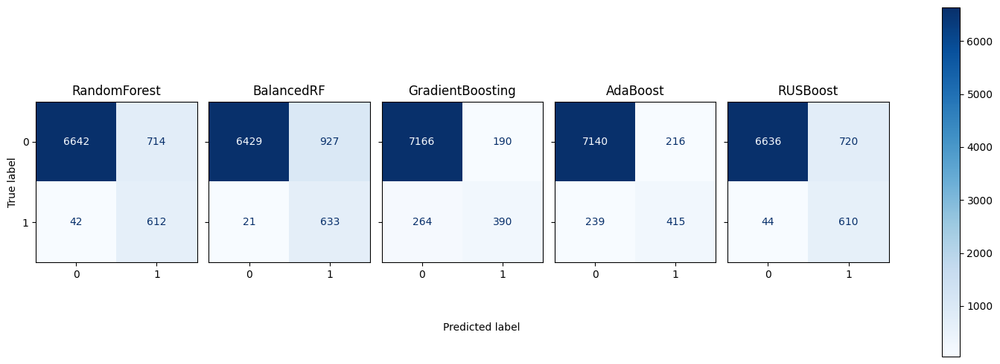

In [ ]:
classifiers = ["RandomForest", "BalancedRF", "GradientBoosting", "AdaBoost", "RUSBoost"]
matrices_confusion = [cm_rf, cm_brf, cm_gb, cm_ada, cm_rus]
class_names = ["0", "1"]

fig, axes = plt.subplots(1, 5, figsize=(15, 5), sharey="row")

for i, (cm, classifier_name) in enumerate(zip(matrices_confusion, classifiers)):

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

    disp.plot(ax=axes[i], cmap="Blues")
    axes[i].set_title(classifier_name)
    disp.im_.colorbar.remove()
    disp.ax_.set_xlabel('')
    if i!=0:
        disp.ax_.set_ylabel('')

plt.tight_layout()
fig.text(0.4, 0.1, "Predicted label", ha="left")
fig.colorbar(disp.im_, ax=axes)
plt.show()

In [ ]:
score_result

,Modelo,Accuracy,Precision,Recall,F1-score
0,RandomForest,0.909098,0.471865,0.940826,0.628422
1,BalancedRF,0.884603,0.412226,0.966055,0.577769
2,GradientBoosting,0.947976,0.711479,0.611927,0.657592
3,AdaBoost,0.946814,0.693772,0.626147,0.657908
4,RUSBoost,0.892206,0.433599,0.951835,0.593865


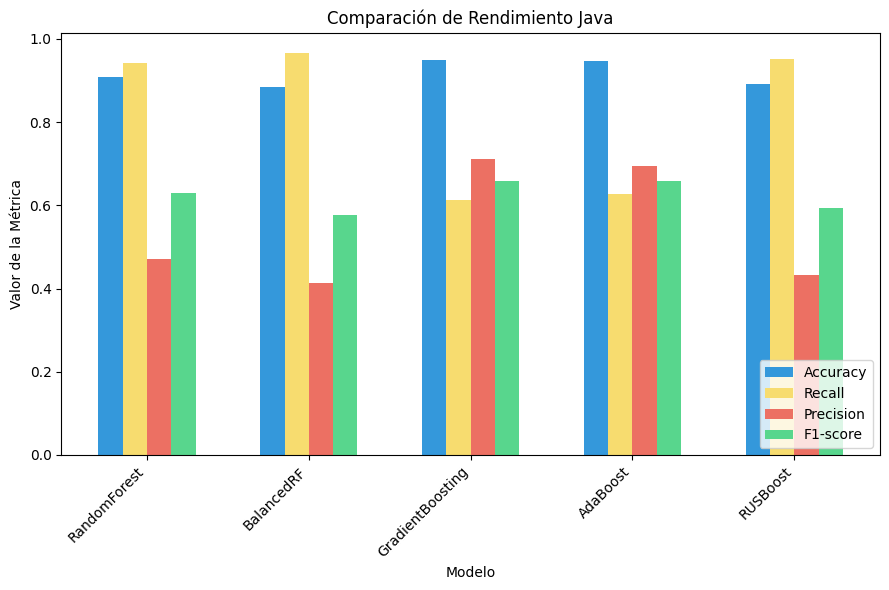

In [ ]:
metricas = ['Accuracy', 'Recall', 'Precision', 'F1-score']
colores = ['#3498DB', '#F7DC6F','#EC7063', '#58D68D']

num_modelos = len(score_result)
ancho_barra = 0.15
x = range(num_modelos)

plt.figure(figsize=(9, 6))

# Crear un gráfico de barras para cada métrica
for i, metrica in enumerate(metricas):
    # Calcular la posición para las barras de esta métrica
    posiciones_x = [pos + i * ancho_barra for pos in x]

    # Obtener los valores de la métrica actual
    valores_metrica = score_result[metrica]

    # Crear las barras para la métrica actual
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

# Personalizar el gráfico
plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento Java')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')

# Mostrar el gráfico combinado
plt.tight_layout()
plt.show()

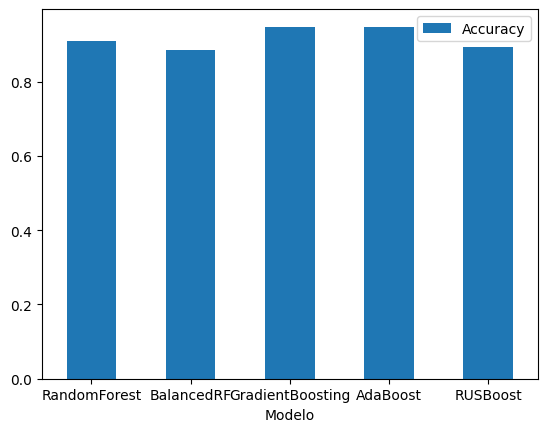

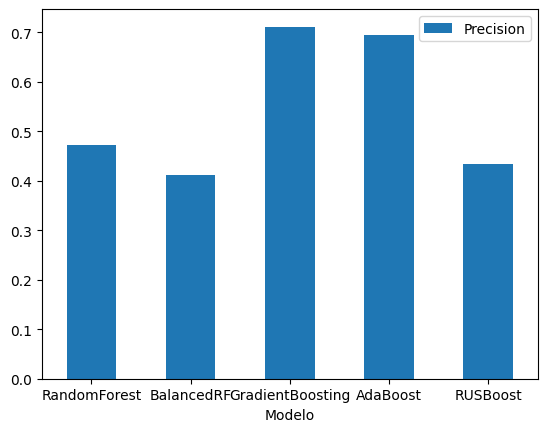

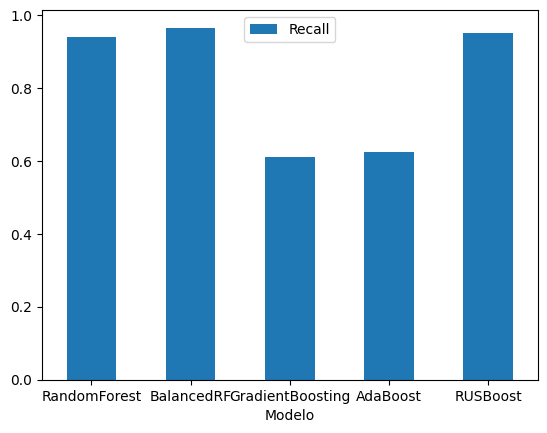

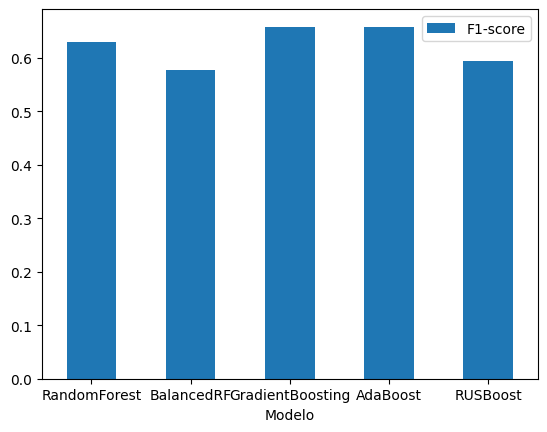

In [ ]:
variables=list(score_result)
variables.pop(0)

for var in variables:
  score_result.plot.bar(x='Modelo', y=var, rot=0)

**RENDIMIENTO INVERSO:**

In [ ]:
score_inv_result

,Modelo,Accuracy,Precision,Recall,F1-score
0,RandomForest,0.905618,0.993716,0.902936,0.946154
1,BalancedRF,0.881648,0.996744,0.873980,0.931334
2,GradientBoost,0.943321,0.964468,0.974171,0.969295
3,AdaBoost,0.943196,0.967611,0.970636,0.969121
4,RUSBoost,0.904619,0.993413,0.902121,0.945569


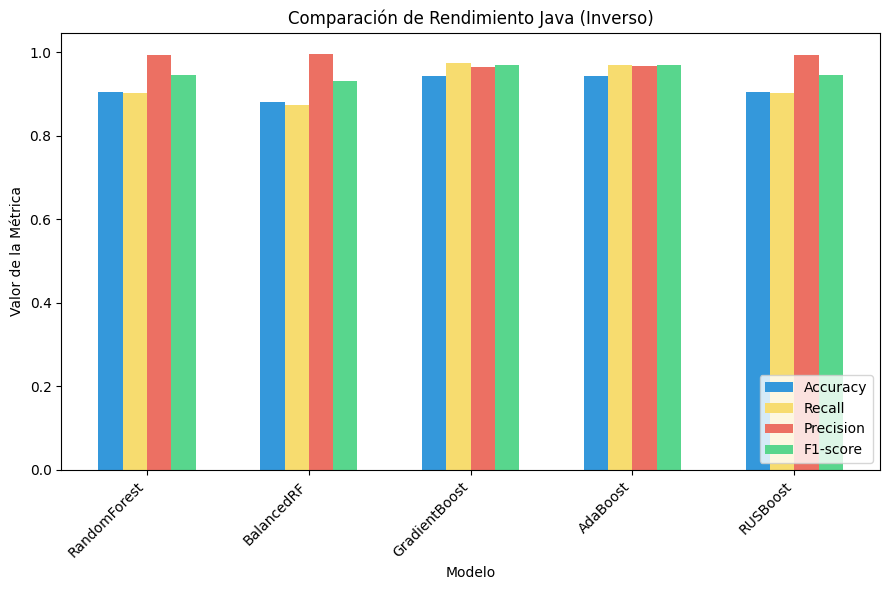

In [ ]:
metricas = ['Accuracy', 'Recall', 'Precision', 'F1-score']
colores = ['#3498DB', '#F7DC6F','#EC7063', '#58D68D']

num_modelos = len(score_inv_result)
ancho_barra = 0.15
x = range(num_modelos)

plt.figure(figsize=(9, 6))

# Crear un gráfico de barras para cada métrica
for i, metrica in enumerate(metricas):
    # Calcular la posición para las barras de esta métrica
    posiciones_x = [pos + i * ancho_barra for pos in x]

    # Obtener los valores de la métrica actual
    valores_metrica = score_inv_result[metrica]

    # Crear las barras para la métrica actual
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

# Personalizar el gráfico
plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento Java (Inverso)')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_inv_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')

# Mostrar el gráfico combinado
plt.tight_layout()
plt.show()

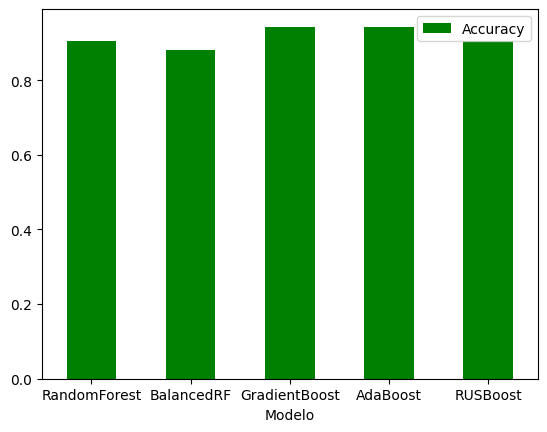

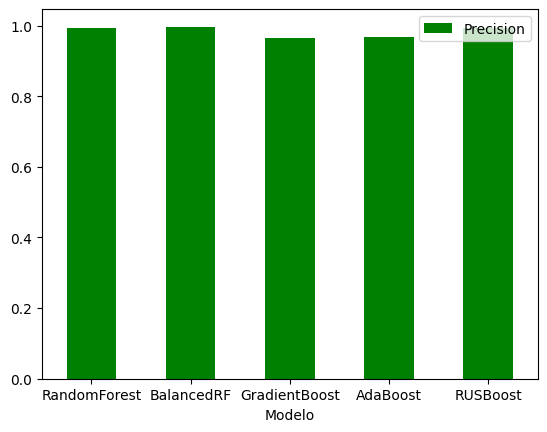

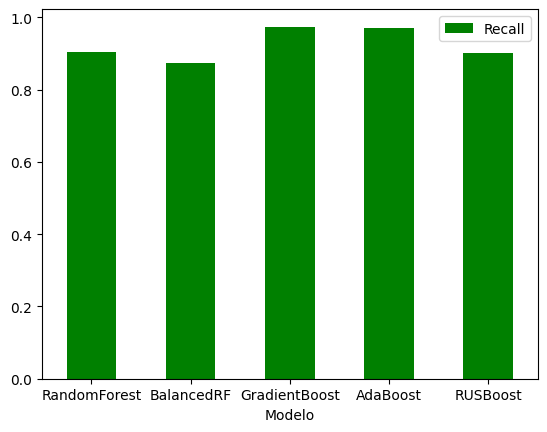

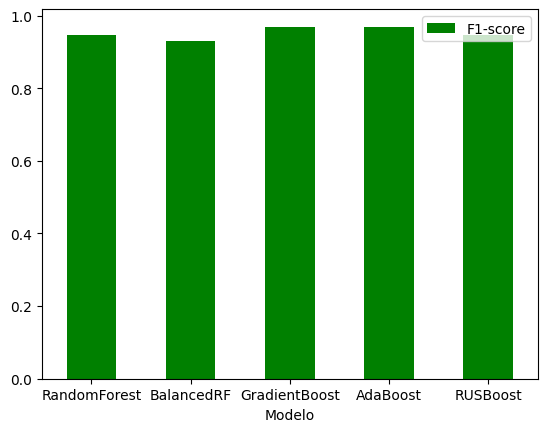

In [ ]:
variables_inv=list(score_inv_result)
variables_inv.pop(0)

for var in variables_inv:
  score_inv_result.plot.bar(x='Modelo', y=var, rot=0, color='green')

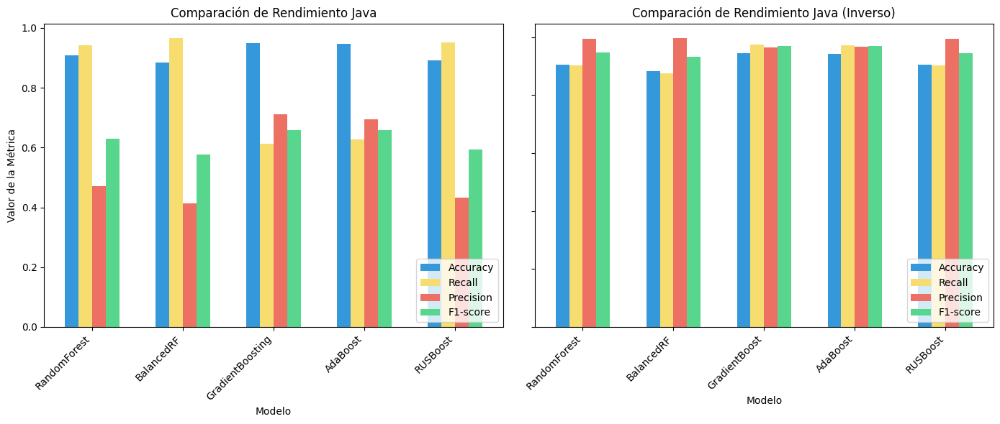

In [ ]:
# Código para la primera gráfica (score_result)
metricas = ['Accuracy', 'Recall', 'Precision', 'F1-score']
colores = ['#3498DB', '#F7DC6F', '#EC7063', '#58D68D']

num_modelos = len(score_result)
ancho_barra = 0.15
x = range(num_modelos)

# Crear una figura con dos subplots, uno a la izquierda y otro a la derecha
plt.figure(figsize=(14, 6))

# Subplot izquierdo para la primera gráfica (score_result)
plt.subplot(1, 2, 1)

for i, metrica in enumerate(metricas):
    posiciones_x = [pos + i * ancho_barra for pos in x]
    valores_metrica = score_result[metrica]
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento Java')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')

# Subplot derecho para la segunda gráfica (score_inv_result)
plt.subplot(1, 2, 2)

for i, metrica in enumerate(metricas):
    posiciones_x = [pos + i * ancho_barra for pos in x]
    valores_metrica = score_inv_result[metrica]
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

plt.xlabel('Modelo')
plt.title('Comparación de Rendimiento Java (Inverso)')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_inv_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')
plt.tick_params(labelleft = False)


# Ajustar los subplots para evitar superposiciones
plt.tight_layout()

# Mostrar la figura combinada
plt.show()
